In [1]:
import numpy as  np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns


from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier,VotingClassifier 
from xgboost import XGBClassifier


from sklearn.model_selection import KFold ,cross_val_score ,train_test_split


from sklearn.metrics import confusion_matrix, accuracy_score , precision_score , recall_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv("/kaggle/input/telco-customer-churn/WA_Fn-UseC_-Telco-Customer-Churn.csv")
data

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [3]:
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [4]:
data.tail()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes
7042,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.65,6844.5,No


In [5]:
data.sample(10)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
1737,8887-IPQNC,Female,0,Yes,No,7,Yes,No,DSL,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,44.25,313.45,No
509,1135-LMECX,Female,0,No,No,1,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,19.85,19.85,No
2310,4967-WPNCF,Male,0,No,No,72,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),63.70,4464.8,No
1022,8242-SOQUO,Female,1,No,No,5,Yes,No,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Electronic check,84.70,392.5,No
5612,9670-BPNXF,Female,0,No,No,45,Yes,No,DSL,Yes,...,No,Yes,No,No,One year,Yes,Credit card (automatic),62.55,2796.45,No
3000,7613-LLQFO,Male,0,No,No,12,Yes,Yes,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Electronic check,84.45,1059.55,Yes
6903,9609-BENEA,Male,0,Yes,No,35,Yes,Yes,DSL,No,...,No,Yes,Yes,No,One year,Yes,Electronic check,69.00,2441.7,No
1581,2782-JEEBU,Male,0,No,No,21,No,No phone service,DSL,No,...,No,Yes,No,No,Month-to-month,Yes,Mailed check,36.00,780.15,No
6440,2809-ZMYOQ,Female,0,No,No,32,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,101.35,3334.9,No
3137,4567-AKPIA,Female,0,Yes,Yes,41,Yes,Yes,Fiber optic,No,...,Yes,Yes,Yes,Yes,One year,Yes,Bank transfer (automatic),109.10,4454.25,No


In [6]:
data.describe().style.background_gradient(cmap="cividis")

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [7]:
for col in data:
    print(f"{col} has {data[col].unique()}\n")

customerID has ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']

gender has ['Female' 'Male']

SeniorCitizen has [0 1]

Partner has ['Yes' 'No']

Dependents has ['No' 'Yes']

tenure has [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]

PhoneService has ['No' 'Yes']

MultipleLines has ['No phone service' 'No' 'Yes']

InternetService has ['DSL' 'Fiber optic' 'No']

OnlineSecurity has ['No' 'Yes' 'No internet service']

OnlineBackup has ['Yes' 'No' 'No internet service']

DeviceProtection has ['No' 'Yes' 'No internet service']

TechSupport has ['No' 'Yes' 'No internet service']

StreamingTV has ['No' 'Yes' 'No internet service']

StreamingMovies has ['No' 'Yes' 'No internet service']

Contract has ['Month-to-month' 'One year' 'Two year']

PaperlessBilling has ['Yes' 'No']

PaymentM

In [8]:
data.describe(include="object")

,customerID,gender,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,TotalCharges,Churn
count,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043
unique,7043,2,2,2,2,3,3,3,3,3,3,3,3,3,2,4,6531,2
top,7590-VHVEG,Male,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,,No
freq,1,3555,3641,4933,6361,3390,3096,3498,3088,3095,3473,2810,2785,3875,4171,2365,11,5174


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


# Fix TotalCharges

In [10]:
data[data['TotalCharges']==' ']

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


In [11]:
data['TotalCharges'] = data['TotalCharges'].replace(' ', 0)

In [12]:
data['TotalCharges'] = pd.to_numeric(data['TotalCharges'], errors='coerce')

In [13]:
data['TotalCharges']

0         29.85
1       1889.50
2        108.15
3       1840.75
4        151.65
         ...   
7038    1990.50
7039    7362.90
7040     346.45
7041     306.60
7042    6844.50
Name: TotalCharges, Length: 7043, dtype: float64

# visualization

In [14]:
def bar_chart(feature):
    yes = data[data['Churn']=="Yes"][feature].value_counts()
    no = data[data['Churn']=="No"][feature].value_counts()
    
    df = pd.DataFrame([yes,no])
    
    df.index = ['yes','no']
    
    df.plot(kind='bar',stacked=True, figsize=(10,6))
    plt.title("Value count for some features according to Churn")
    plt.xlabel(feature)
    plt.ylabel("Value count")
    plt.xticks(rotation = 0)

In [15]:
features = ["gender", "SeniorCitizen", "Partner", "Dependents", "DeviceProtection", "PhoneService", "MultipleLines", "InternetService", 
            "OnlineSecurity", "OnlineBackup", "TechSupport", "StreamingTV", "StreamingMovies", "Contract", "PaperlessBilling", "PaymentMethod"]

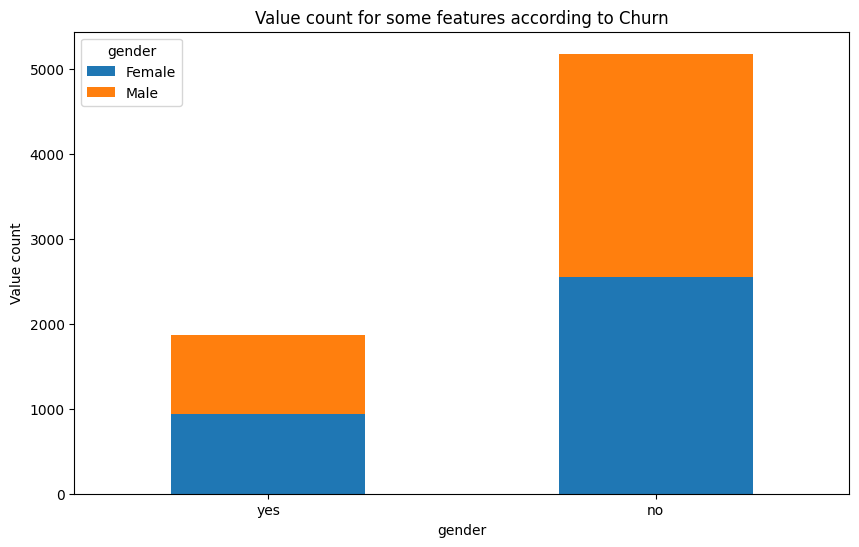

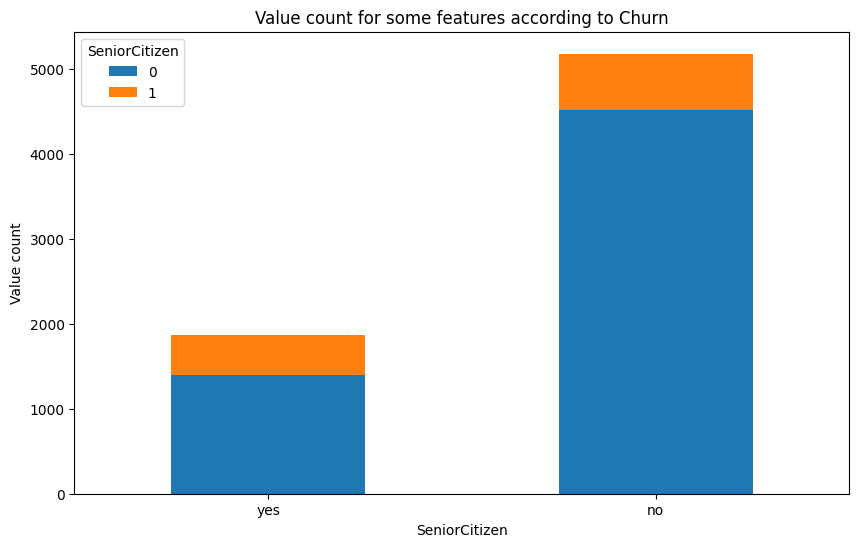

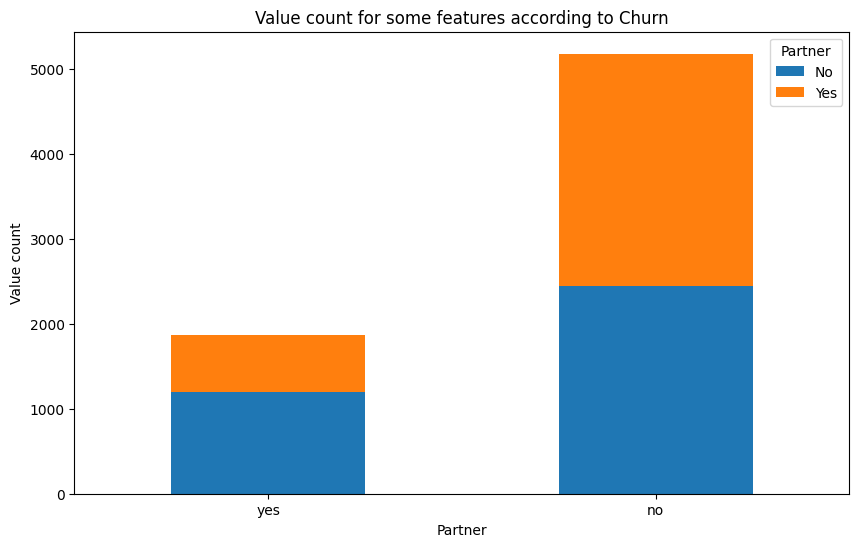

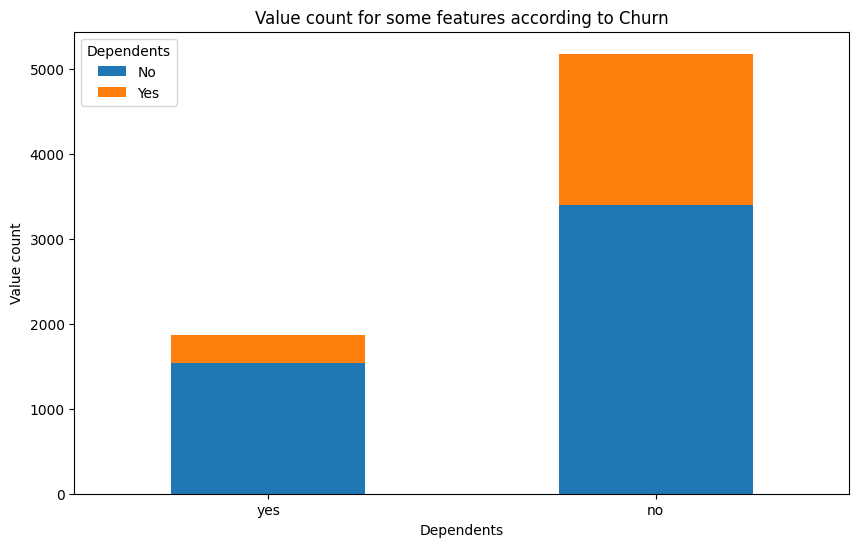

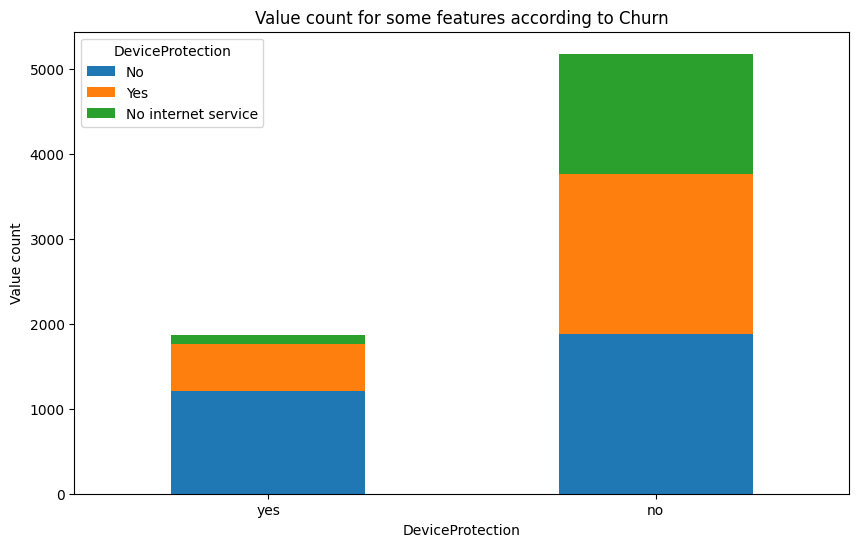

...

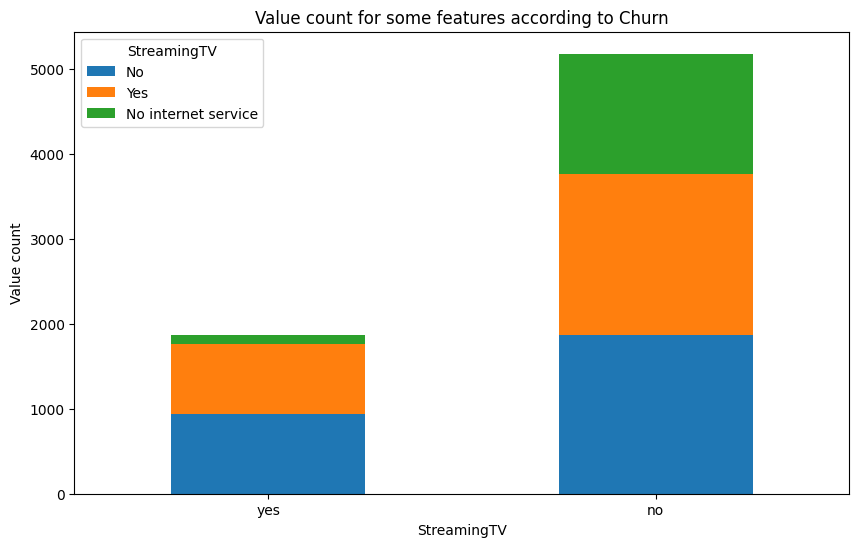

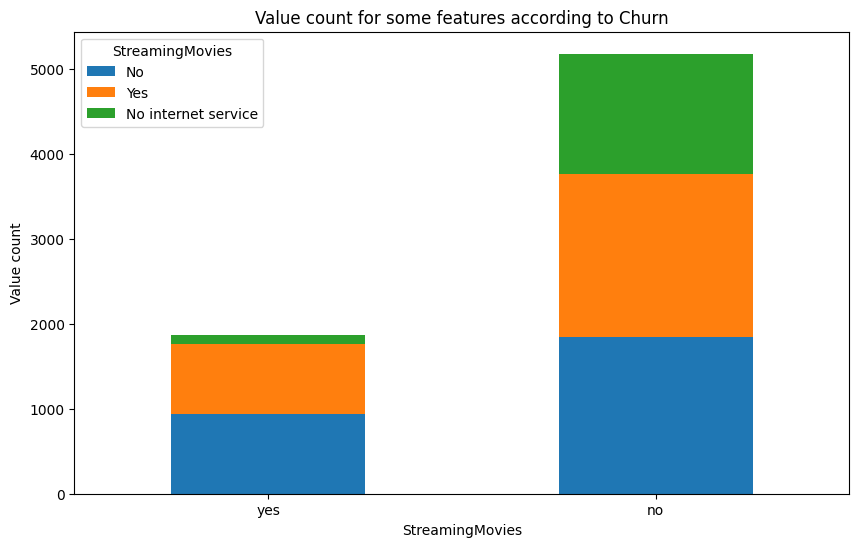

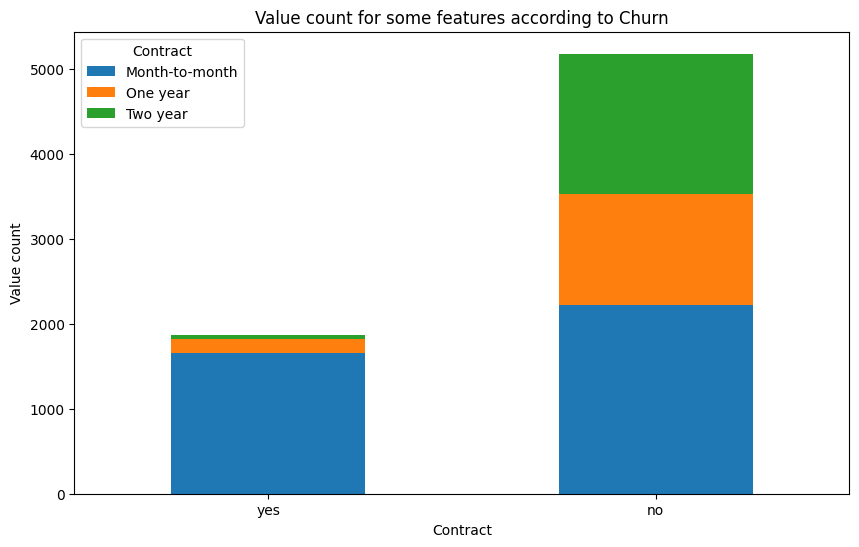

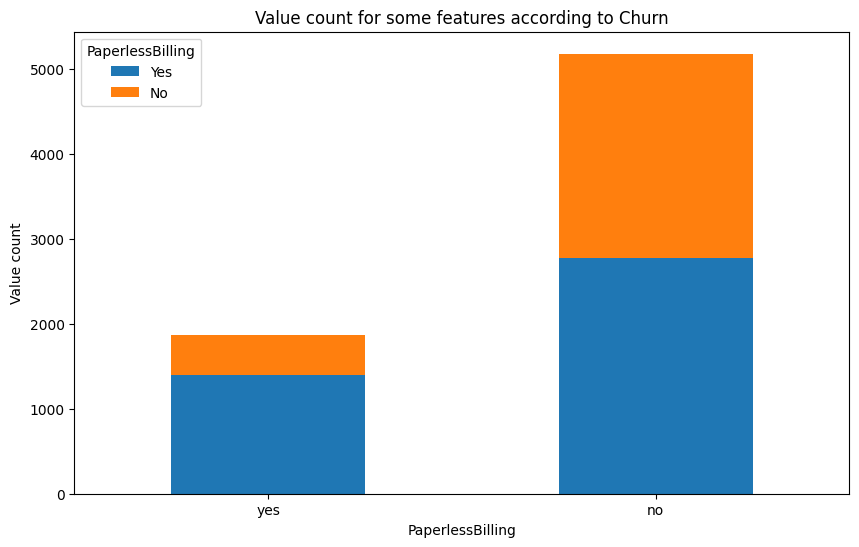

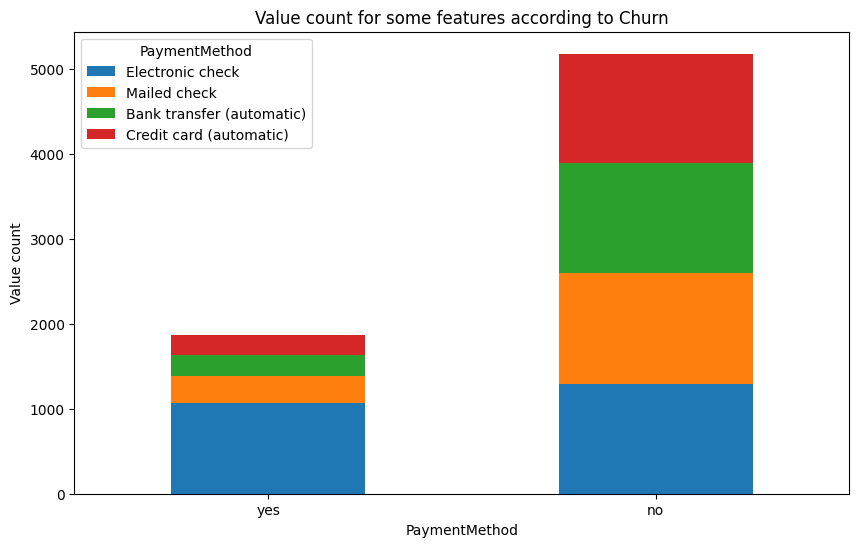

In [16]:
for i in features:
    bar_chart(i)

# Numerical Univariate Analysis

In [17]:
num_cols = data.select_dtypes(include='number').columns.tolist()
cat_cols = data.select_dtypes(include='object').columns.tolist()

In [18]:
def univ_num(col):
    fig = px.histogram(data, x=col, marginal='box')
    fig.show()

In [19]:
for col in cat_cols[1:len(cat_cols)]:
    univ_num(col)

In [20]:
for col in num_cols[1:len(cat_cols)]:
    univ_num(col)

# Bivariate Analysis

In [21]:
def num_vs_target(col):
    fig = px.histogram(data, x=col, color='Churn', marginal='box')
    fig.show()
    
for col in cat_cols[1:len(cat_cols)]:
    num_vs_target(col)

In [22]:
def num_vs_target(col):
    fig = px.histogram(data, x=col, color='Churn', marginal='box')
    fig.show()
    
for col in num_cols[1:len(cat_cols)]:
    num_vs_target(col)

# Fix Churn

In [23]:
data["Churn"] = data["Churn"].map({'Yes': 1, 'No': 0})

In [24]:
data["Churn"].value_counts()

Churn
0    5174
1    1869
Name: count, dtype: int64

In [25]:
global_mean = data["Churn"].mean()
global_mean

0.2653698707936959

In [26]:
def cat_vs_target(col):
    df_group = data.groupby(col)['Churn'].mean().round(2).reset_index()
    fig = px.bar(df_group, x=col, y='Churn', color='Churn', color_continuous_scale=['blue', 'red'], text='Churn', width=800, height=400)

    # Horizontal line for global mean
    fig.add_shape(type='line', x0=-0.5, x1=len(df_group[col]), y0=global_mean, y1=global_mean, line=dict(color='black', width=3))

    # Add text
    fig.add_annotation(x=0.7, y=global_mean+0.02, text=f'Global mean: {global_mean:.2f}', showarrow=False, font=dict(color='black', size=14))
    fig.update_layout( title_text=f'{col}',showlegend=False)
    fig.show()
    
for col in cat_cols[1:len(cat_cols)-1]:
    cat_vs_target(col)

# Feature engineering

# Gender

In [27]:
le = LabelEncoder()
data["gender"] = le.fit_transform(data["gender"])

In [28]:
data["gender"]

0       0
1       1
2       1
3       1
4       0
       ..
7038    1
7039    0
7040    0
7041    1
7042    1
Name: gender, Length: 7043, dtype: int64

In [29]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="Churn", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    plt.title(f"Density of {title} according to churn")
    facet.add_legend()
    plt.show()


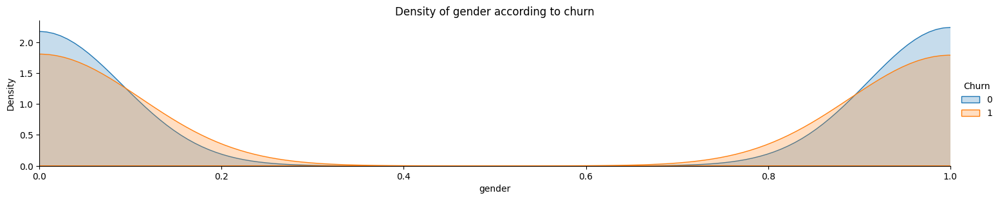

In [30]:
facet("gender","gender")

In [31]:
data

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,0,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,0
1,5575-GNVDE,1,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,0
2,3668-QPYBK,1,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
3,7795-CFOCW,1,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,0
4,9237-HQITU,0,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,1,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,0
7039,2234-XADUH,0,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,0
7040,4801-JZAZL,0,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,0
7041,8361-LTMKD,1,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,1


# Partner

In [32]:
def count(feature):
    partner1 = data[data['Partner']=="Yes"][feature].value_counts()
    partner2 = data[data['Partner']=="No"][feature].value_counts()
    df = pd.DataFrame([partner1, partner2])
    df.index = ['partner1','partner2']
    df.plot(kind='bar',stacked=True, figsize=(10,5))
    plt.xticks(rotation=0)
    plt.title("Density of some features according to partner")


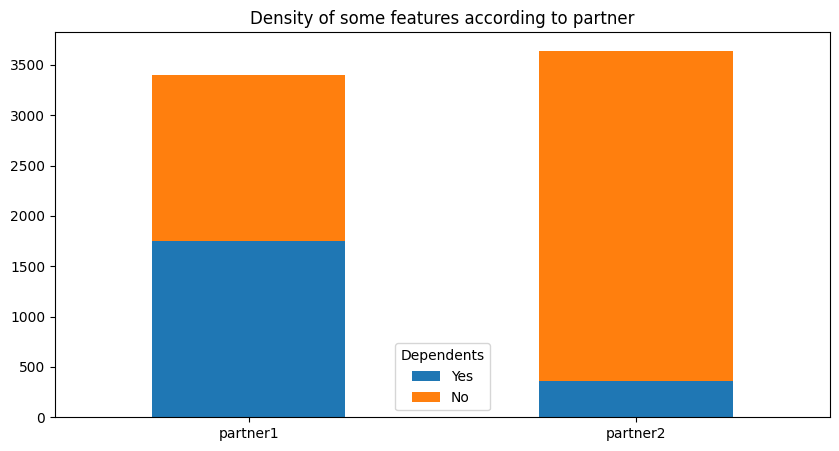

In [33]:
count("Dependents")

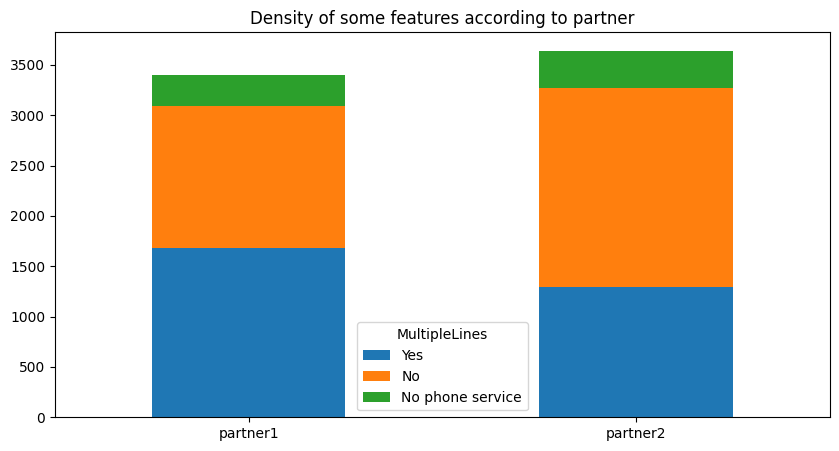

In [34]:
count("MultipleLines")


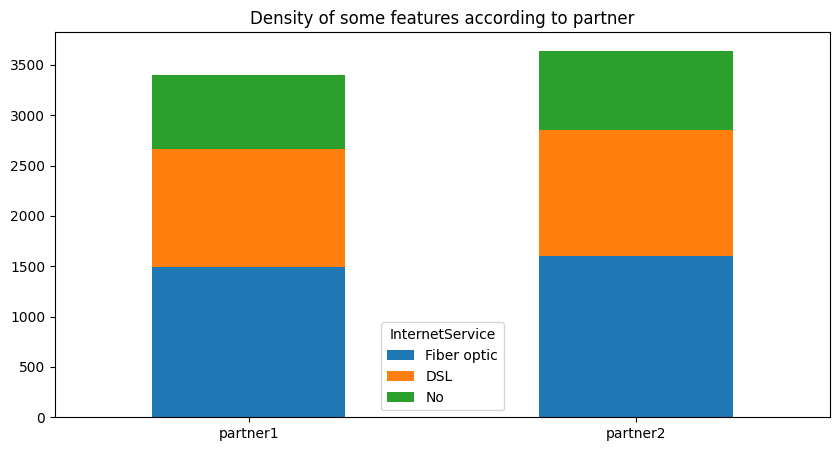

In [35]:
count("InternetService")

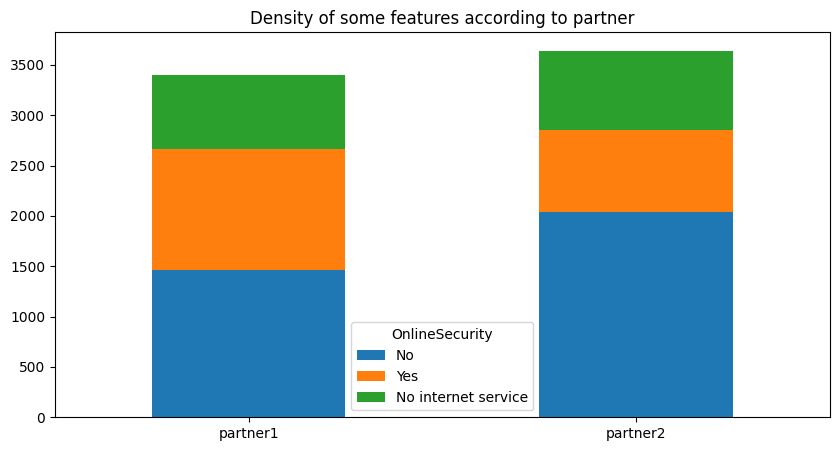

In [36]:
count("OnlineSecurity")

In [37]:
data["Partner"] = le.fit_transform(data["Partner"])
data["Partner"]

0       1
1       0
2       0
3       0
4       0
       ..
7038    1
7039    1
7040    1
7041    1
7042    0
Name: Partner, Length: 7043, dtype: int64

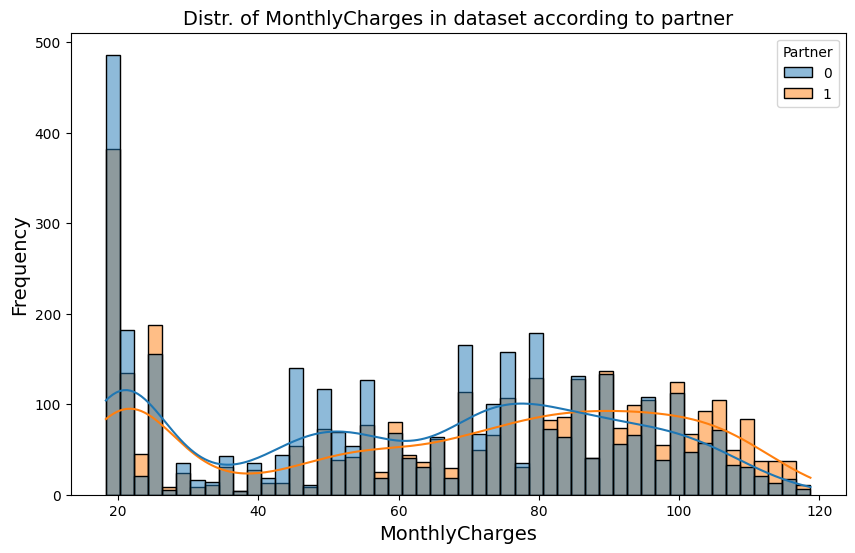

In [38]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='Partner')  

## title and axis
plt.title('Distr. of MonthlyCharges in dataset according to partner', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

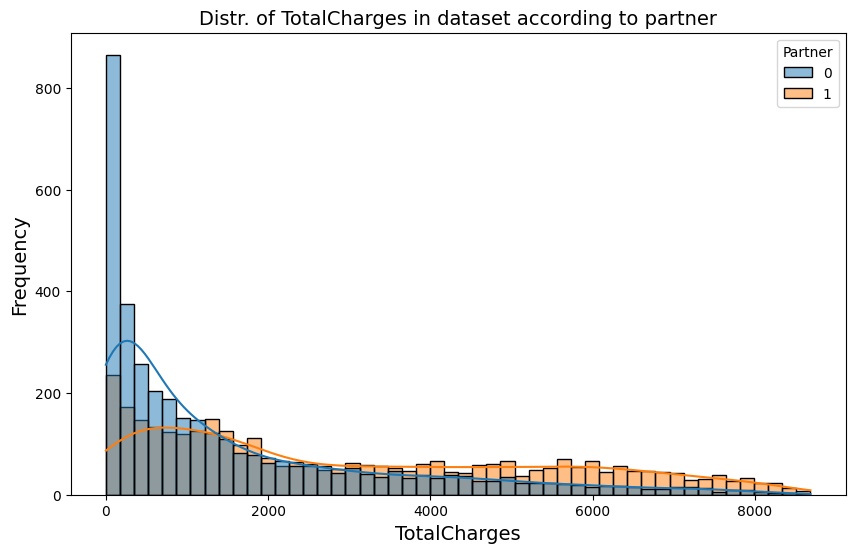

In [39]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='Partner')  

## title and axis
plt.title('Distr. of TotalCharges in dataset according to partner', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# Dependents

In [40]:
data["Dependents"] = le.fit_transform(data["Dependents"])

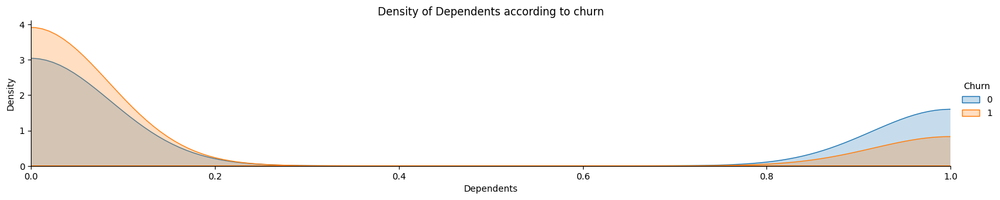

In [41]:
facet("Dependents","Dependents")

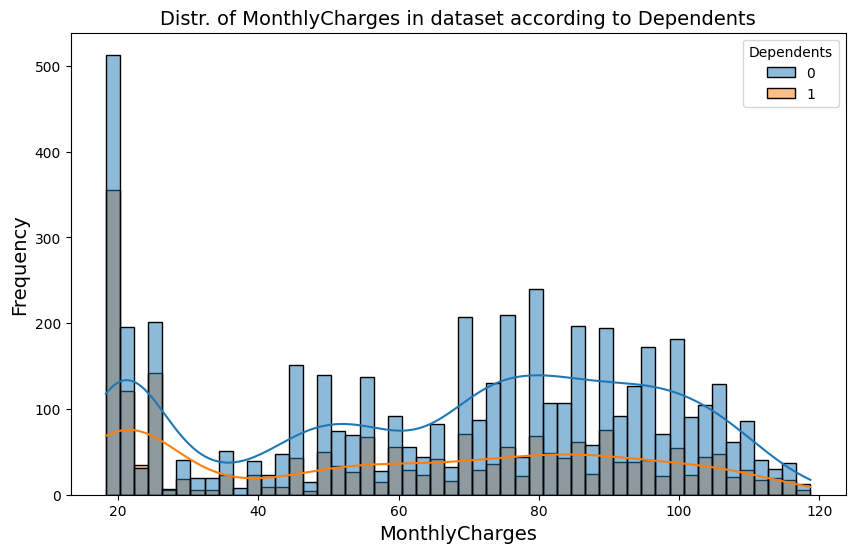

In [42]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='Dependents')  

## title and axis
plt.title('Distr. of MonthlyCharges in dataset according to Dependents', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

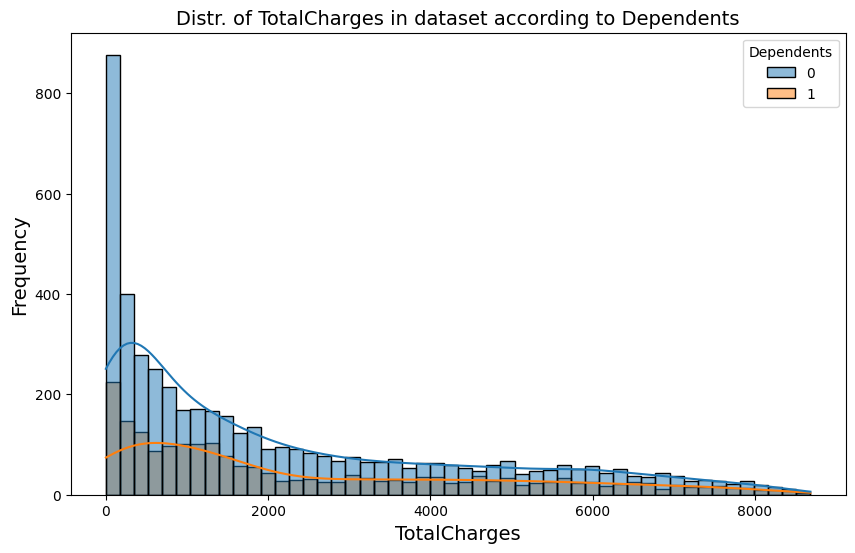

In [43]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='Dependents')  

## title and axis
plt.title('Distr. of TotalCharges in dataset according to Dependents', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# tenure

 make tenure in scale ( tenure <= 20 in scale 0,   20 < tenure <= 40 in scale 1,  40 < tenure <= 60 in scale 2, more than 60 in scale 3 )

In [44]:
data["tenure"].unique()

array([ 1, 34,  2, 45,  8, 22, 10, 28, 62, 13, 16, 58, 49, 25, 69, 52, 71,
       21, 12, 30, 47, 72, 17, 27,  5, 46, 11, 70, 63, 43, 15, 60, 18, 66,
        9,  3, 31, 50, 64, 56,  7, 42, 35, 48, 29, 65, 38, 68, 32, 55, 37,
       36, 41,  6,  4, 33, 67, 23, 57, 61, 14, 20, 53, 40, 59, 24, 44, 19,
       54, 51, 26,  0, 39])

In [45]:
data["tenure"].max()

72

In [46]:
data["tenure"].min()

0

In [47]:
df = [data]

In [48]:
# tenure  0 ---> 72
for pointer in df:
    pointer.loc[ pointer['tenure'] <= 20, 'tenure'] = 0
    pointer.loc[(pointer['tenure'] > 20) & (pointer['tenure'] <= 40), 'tenure'] = 1
    pointer.loc[(pointer['tenure'] > 40) & (pointer['tenure'] <= 60), 'tenure'] = 2
    pointer.loc[ pointer['tenure'] > 60, 'tenure'] = 3

In [49]:
data["tenure"].unique()

array([0, 1, 2, 3])

In [50]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="tenure", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to tenure")
    plt.show()


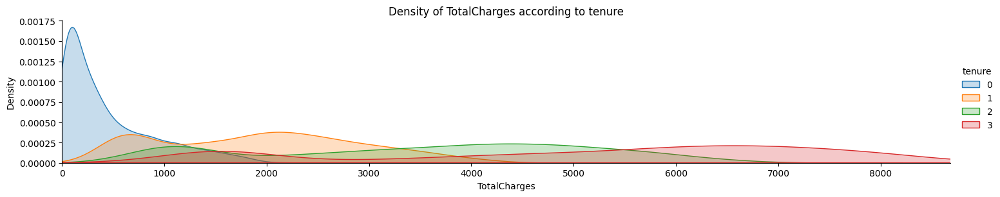

In [51]:
facet("TotalCharges","TotalCharges")

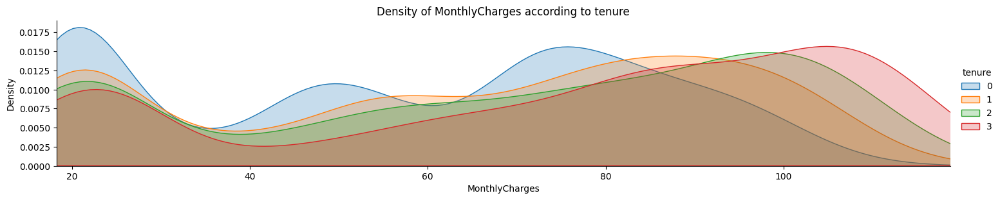

In [52]:
facet("MonthlyCharges","MonthlyCharges")


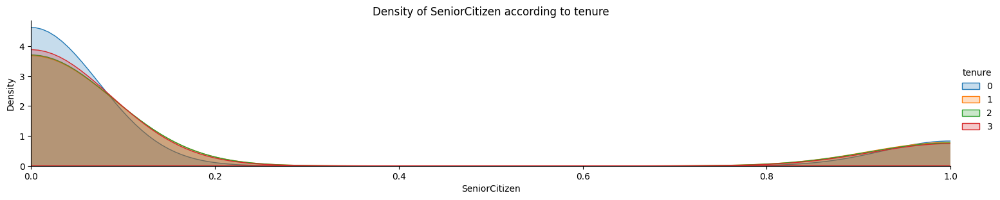

In [53]:
facet("SeniorCitizen","SeniorCitizen")

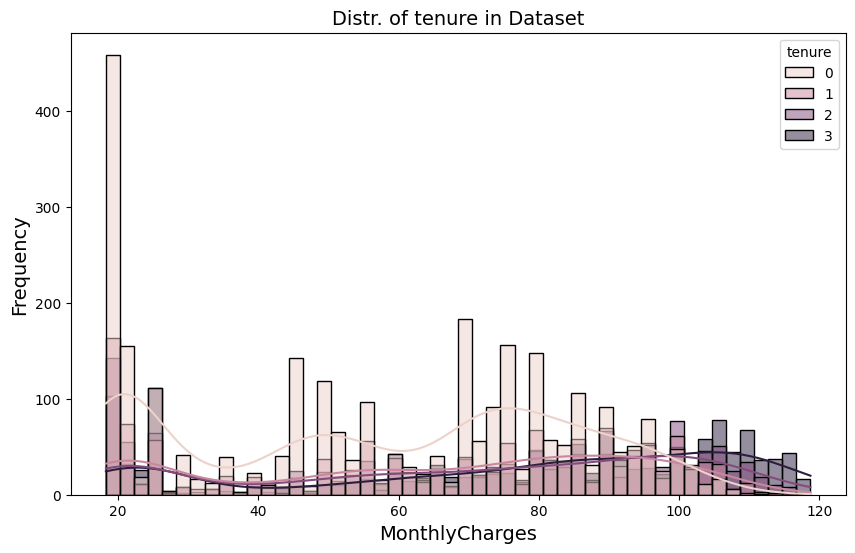

In [54]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='tenure')  

## title and axis
plt.title('Distr. of tenure in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

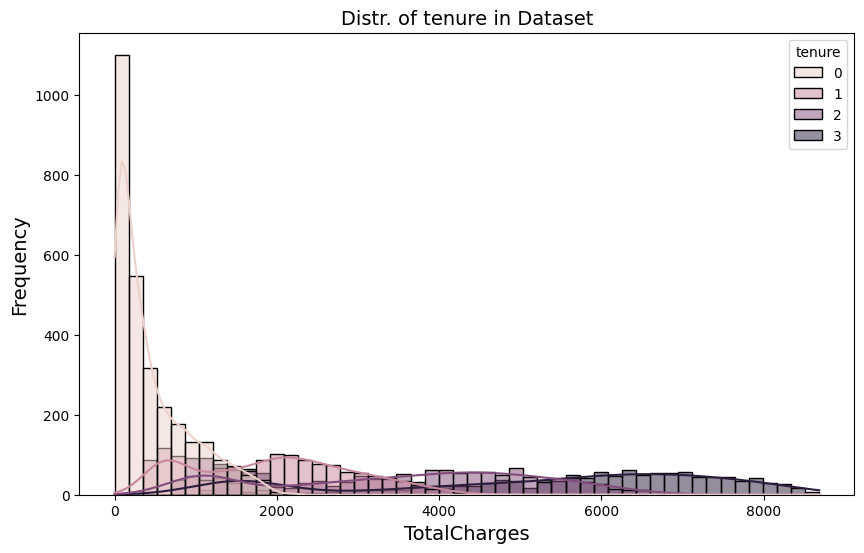

In [55]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='tenure')  

## title and axis
plt.title('Distr. of tenure in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# PhoneService

In [56]:
data

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,0,0,1,0,0,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,0
1,5575-GNVDE,1,0,0,0,1,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,0
2,3668-QPYBK,1,0,0,0,0,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
3,7795-CFOCW,1,0,0,0,2,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,0
4,9237-HQITU,0,0,0,0,0,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,1,0,1,1,1,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,0
7039,2234-XADUH,0,0,1,1,3,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,0
7040,4801-JZAZL,0,0,1,1,0,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,0
7041,8361-LTMKD,1,1,1,0,0,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,1


In [57]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="PhoneService", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    plt.title(f"Density of {title} according to PhoneService")
    facet.add_legend()
    plt.show()


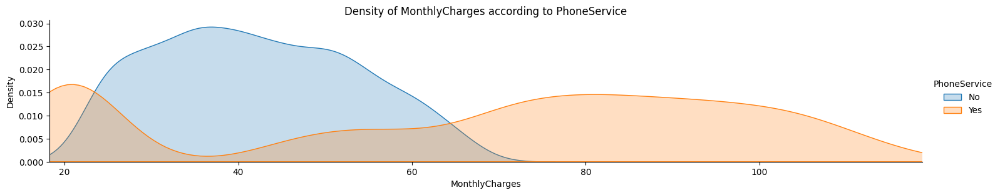

In [58]:
facet("MonthlyCharges","MonthlyCharges")

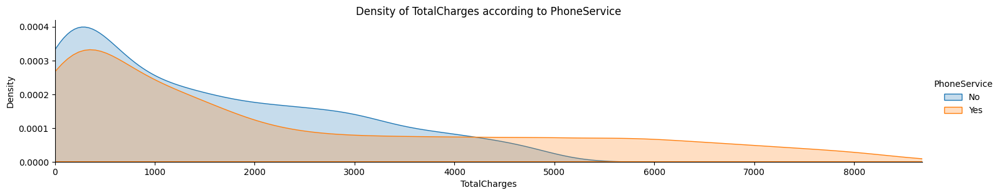

In [59]:
facet("TotalCharges","TotalCharges")


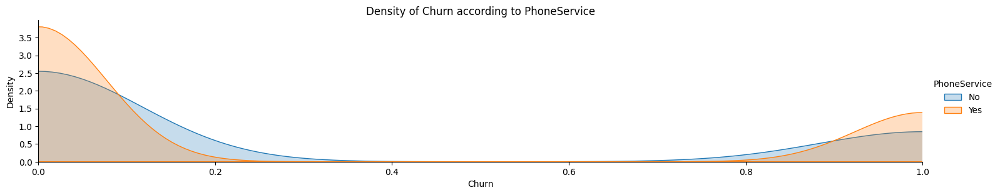

In [60]:
facet("Churn","Churn")

In [61]:
def phone_count(feature):
    phone1 = data[data['PhoneService']=="Yes"][feature].value_counts()
    phone2 = data[data['PhoneService']=="No"][feature].value_counts()
    df = pd.DataFrame([phone1, phone2])
    df.index = ['partner1','phone2']
    df.plot(kind='bar',stacked=True, figsize=(10,5))
    plt.xticks(rotation=0)

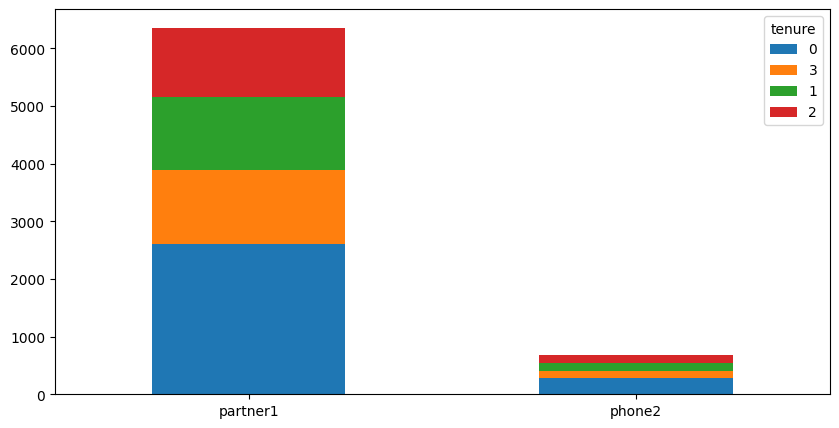

In [62]:
phone_count("tenure")

In [63]:
data["PhoneService"] = le.fit_transform(data["PhoneService"])

In [64]:
data["PhoneService"].value_counts()

PhoneService
1    6361
0     682
Name: count, dtype: int64

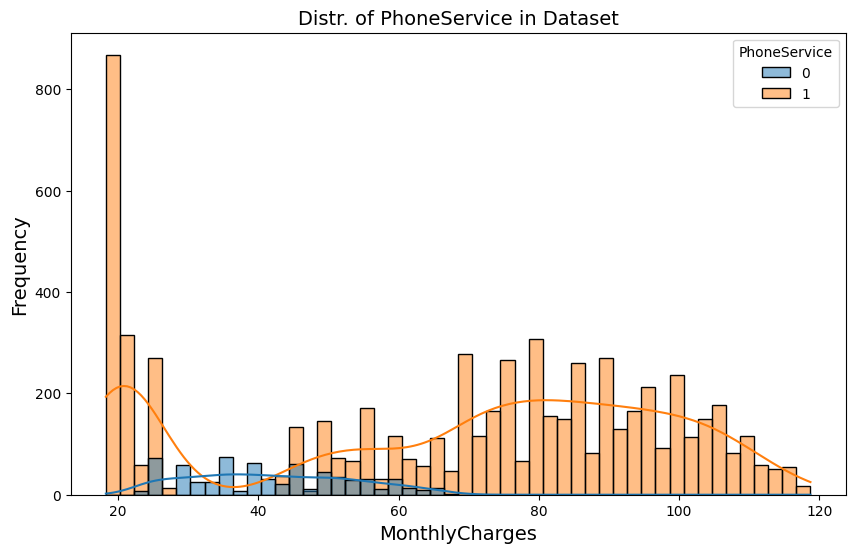

In [65]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='PhoneService')  

## title and axis
plt.title('Distr. of PhoneService in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

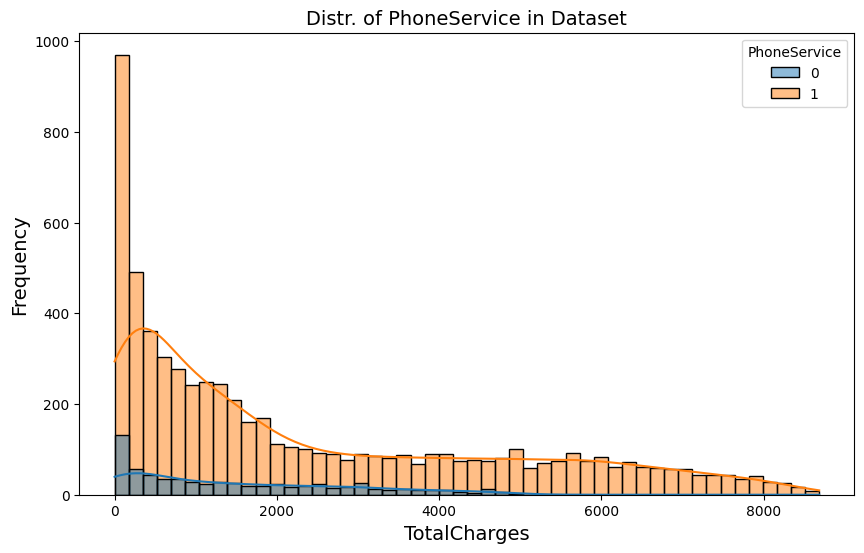

In [66]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='PhoneService')  

## title and axis
plt.title('Distr. of PhoneService in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# MultipleLines

In [67]:
data["MultipleLines"].unique()

array(['No phone service', 'No', 'Yes'], dtype=object)

In [68]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="MultipleLines", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to MultipleLines")
    plt.show()


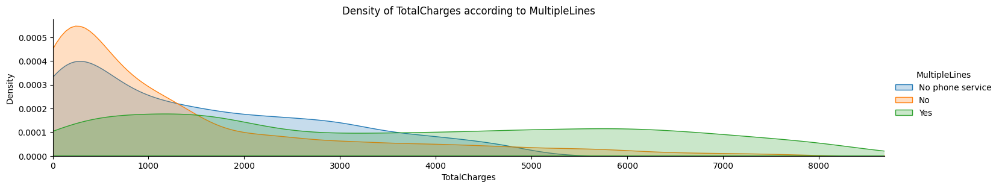

In [69]:
facet("TotalCharges","TotalCharges")


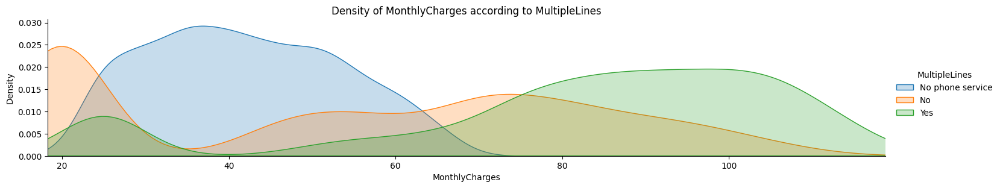

In [70]:
facet("MonthlyCharges","MonthlyCharges")


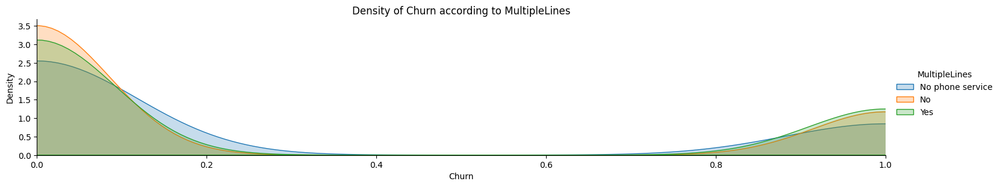

In [71]:
facet("Churn","Churn")


In [72]:
def Lines_count(title,feature):
    Line1 = data[data['MultipleLines']=="No phone service"][feature].value_counts()
    Line2 = data[data['MultipleLines']=="Yes"][feature].value_counts()
    Line3 = data[data['MultipleLines']=="No"][feature].value_counts()
    df = pd.DataFrame([Line1, Line2, Line3])
    df.index = ['No phone service','Yes', "No"]
    df.plot(kind='bar',stacked=True, figsize=(10,5))
    plt.xticks(rotation=0)
    plt.title(f"Value count of {title} according to MultipleLines")

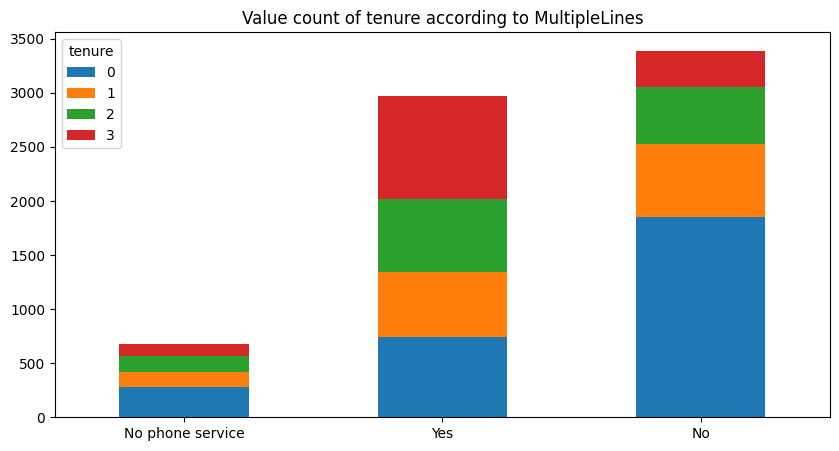

In [73]:
Lines_count("tenure","tenure")

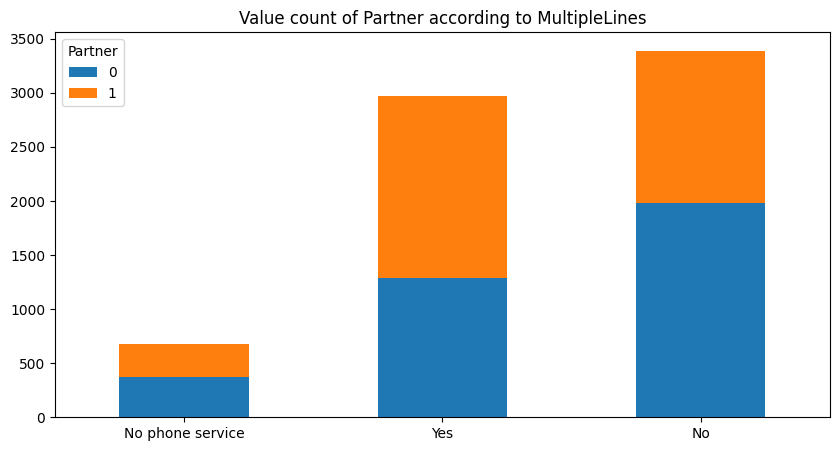

In [74]:
Lines_count("Partner","Partner")


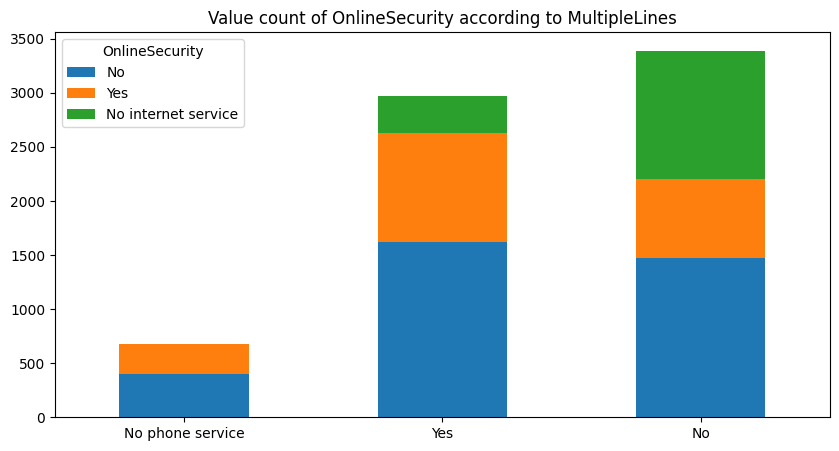

In [75]:
Lines_count("OnlineSecurity","OnlineSecurity")

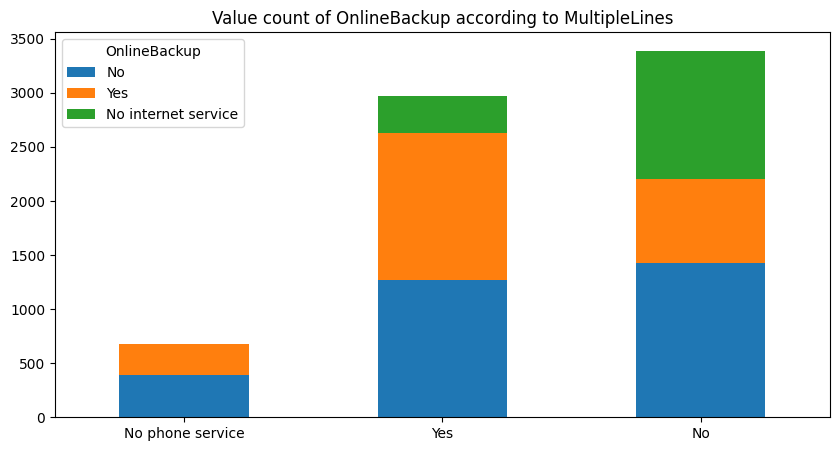

In [76]:
Lines_count("OnlineBackup","OnlineBackup")

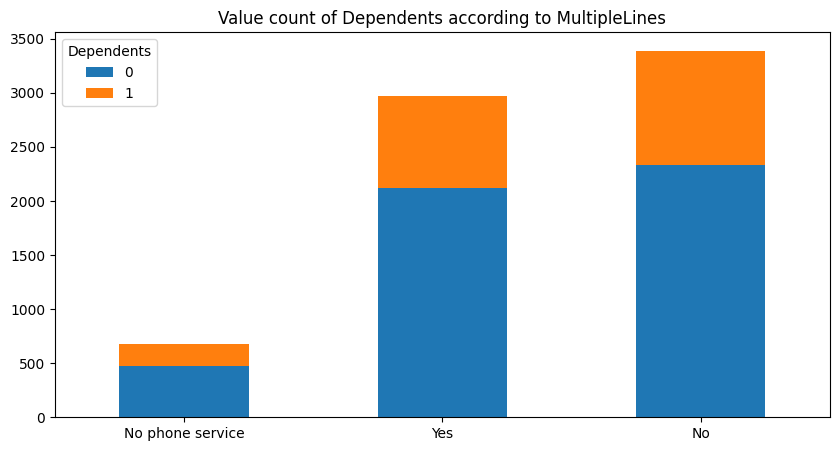

In [77]:
Lines_count("Dependents","Dependents")

In [78]:
data['MultipleLines'] = data['MultipleLines'].map({'Yes': 2, 'No': 1, 'No phone service':0})

In [79]:
data['MultipleLines'].value_counts()

MultipleLines
1    3390
2    2971
0     682
Name: count, dtype: int64

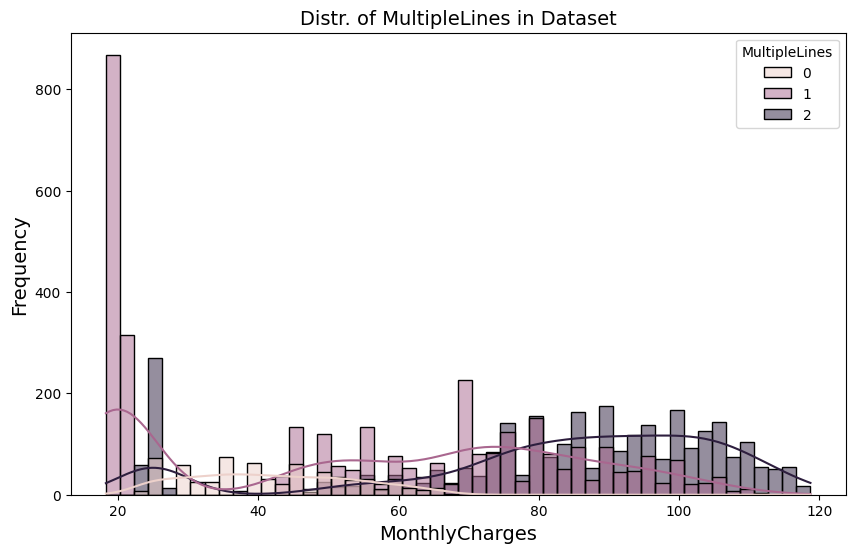

In [80]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='MultipleLines')  

## title and axis
plt.title('Distr. of MultipleLines in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

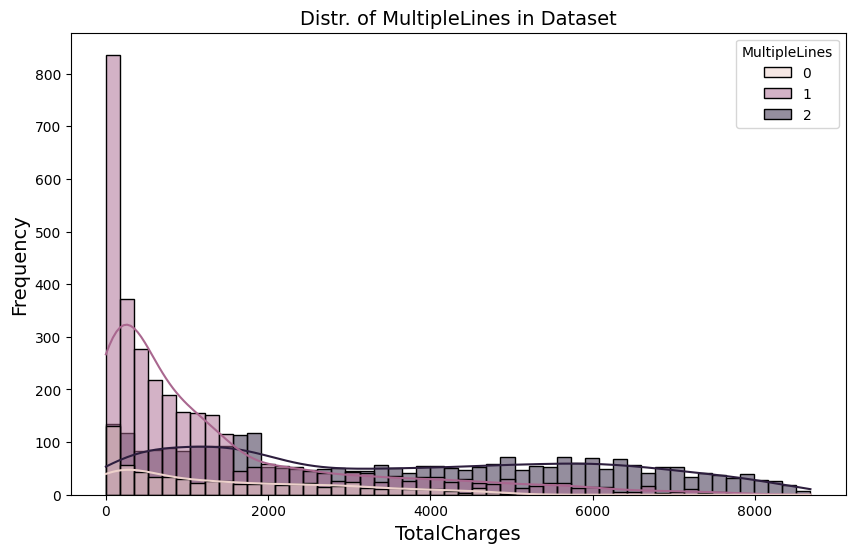

In [81]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='MultipleLines')  

## title and axis
plt.title('Distr. of MultipleLines in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# InternetService

In [82]:
data["InternetService"].value_counts()

InternetService
Fiber optic    3096
DSL            2421
No             1526
Name: count, dtype: int64

In [83]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="InternetService", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to InternetService")
    plt.show()


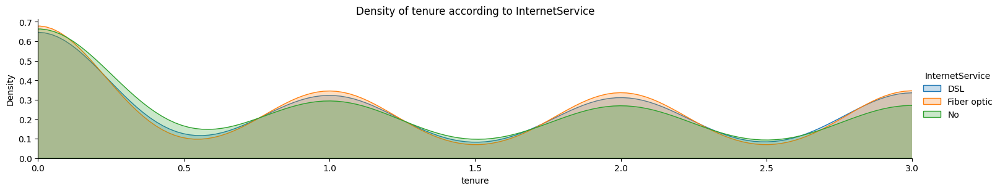

In [84]:
facet("tenure","tenure")

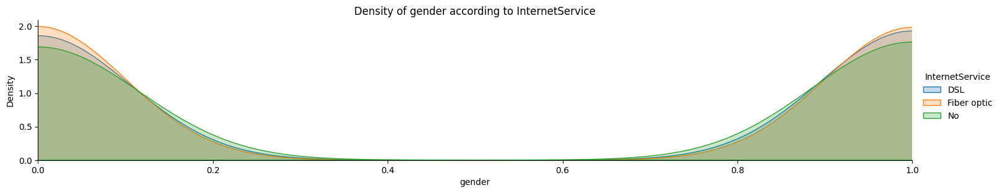

In [85]:
facet("gender","gender")

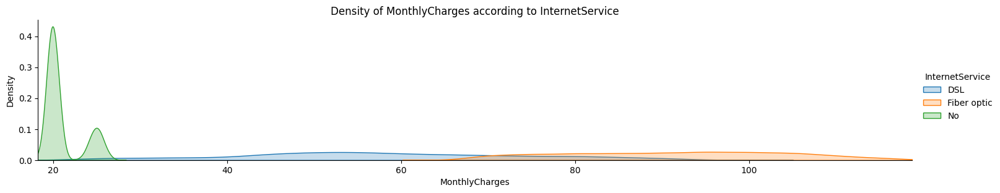

In [86]:
facet("MonthlyCharges","MonthlyCharges")

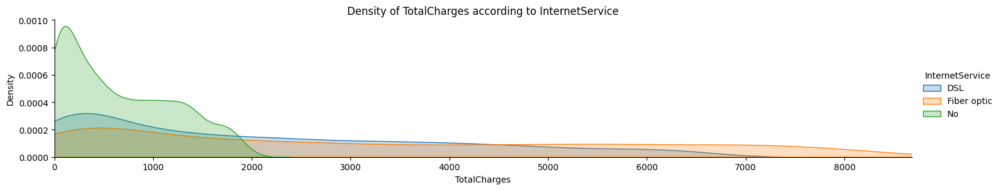

In [87]:
facet("TotalCharges","TotalCharges")

In [88]:
def Internet_count(title,feature):
    Internet1 = data[data['InternetService']=="Fiber optic"][feature].value_counts()
    Internet2 = data[data['InternetService']=="DSL"][feature].value_counts()
    Internet3 = data[data['InternetService']=="No"][feature].value_counts()
    df = pd.DataFrame([Internet1, Internet2, Internet3])
    df.index = ['Fiber optic','DSL', "No"]
    df.plot(kind='bar',stacked=True, figsize=(10,5))
    plt.xticks(rotation=0)
    plt.title(f"Value count of {title} according to MultipleLines")


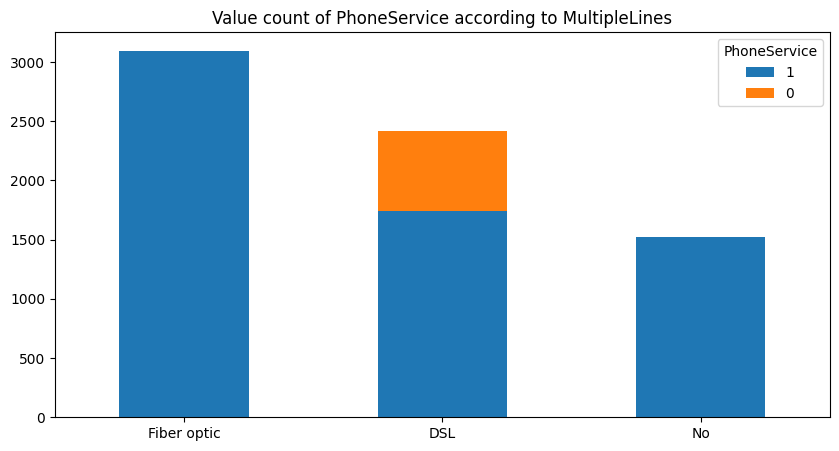

In [89]:
Internet_count("PhoneService","PhoneService")

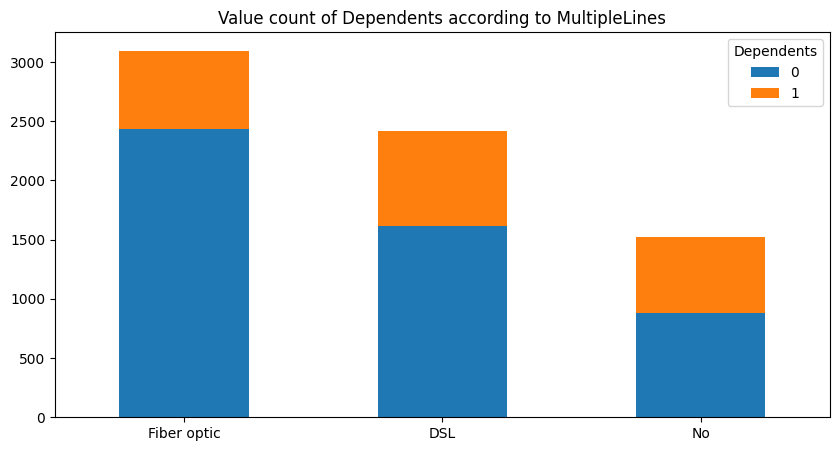

In [90]:
Internet_count("Dependents","Dependents")


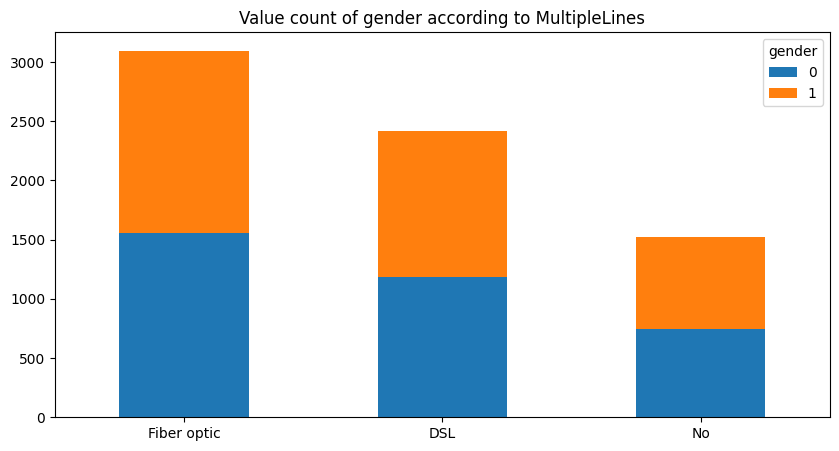

In [91]:
Internet_count("gender","gender")

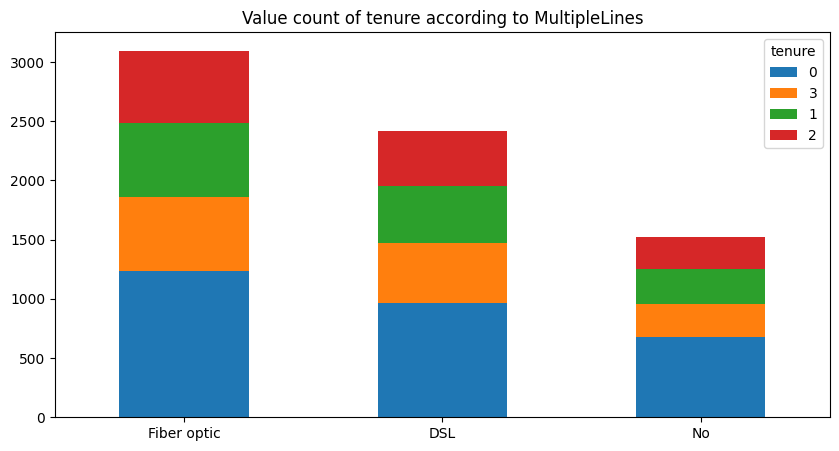

In [92]:
Internet_count("tenure","tenure")

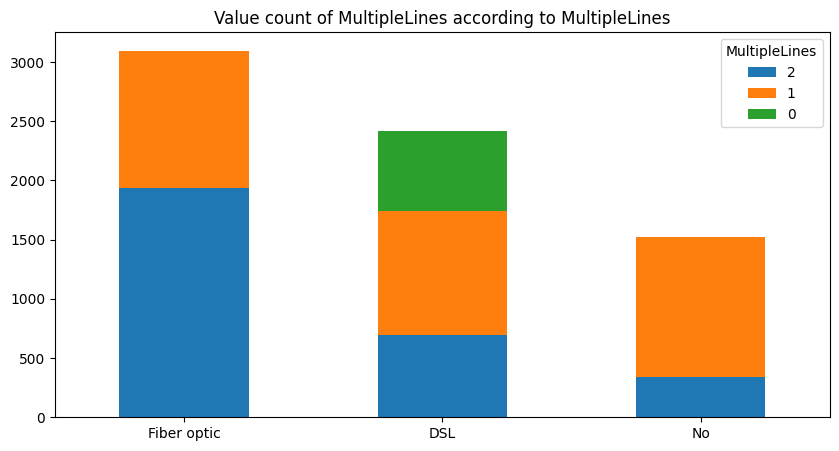

In [93]:
Internet_count("MultipleLines","MultipleLines")


In [94]:
data["InternetService"] = data["InternetService"].map({"No":0, "DSL":1, "Fiber optic":2})

In [95]:
data["InternetService"].value_counts()

InternetService
2    3096
1    2421
0    1526
Name: count, dtype: int64

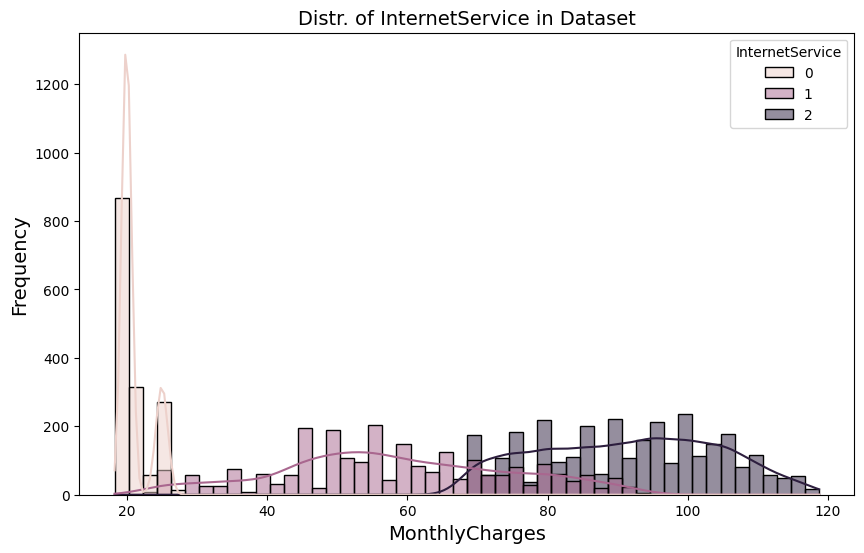

In [96]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='InternetService')  

## title and axis
plt.title('Distr. of InternetService in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

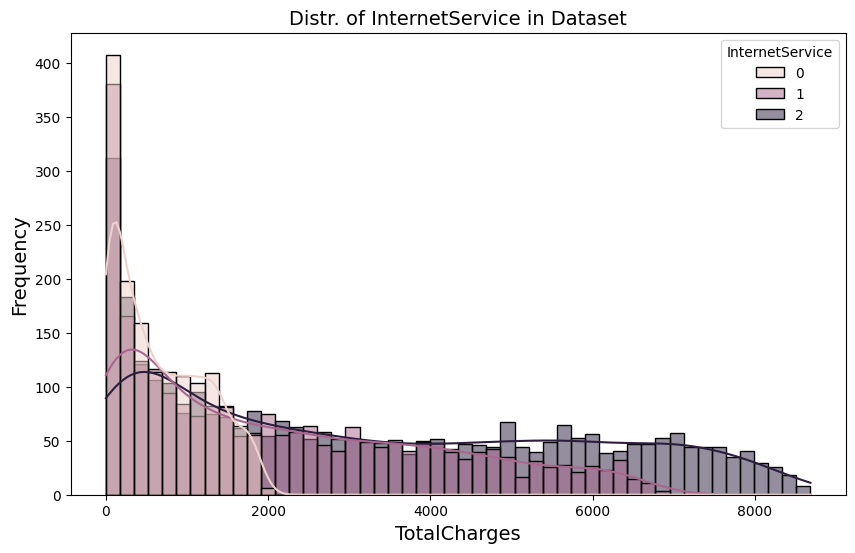

In [97]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='InternetService')  

## title and axis
plt.title('Distr. of InternetService in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# OnlineSecurity

In [98]:
data["OnlineSecurity"].value_counts()

OnlineSecurity
No                     3498
Yes                    2019
No internet service    1526
Name: count, dtype: int64

In [99]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="OnlineSecurity", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to OnlineSecurity")
    plt.show()


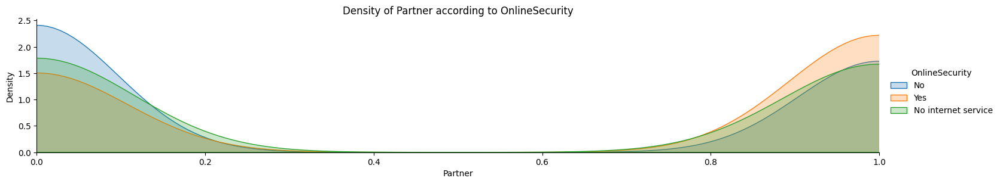

In [100]:
facet("Partner","Partner")

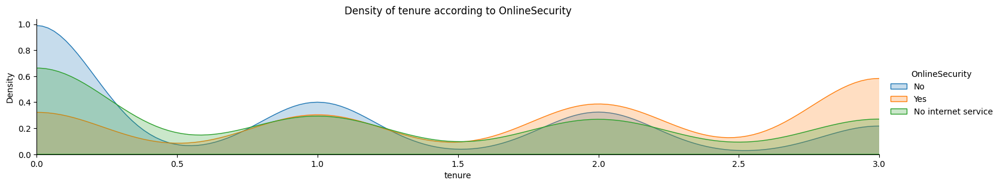

In [101]:
facet("tenure","tenure")

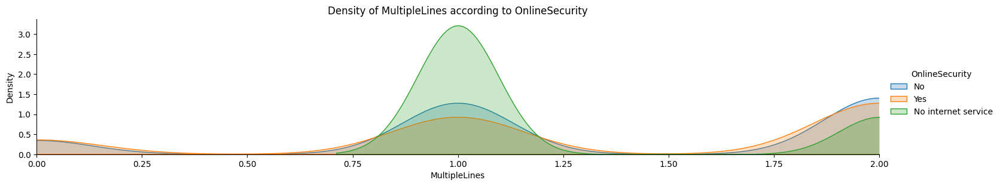

In [102]:
facet("MultipleLines","MultipleLines")


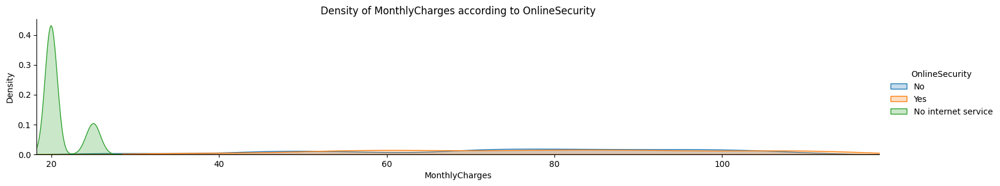

In [103]:
facet("MonthlyCharges","MonthlyCharges")

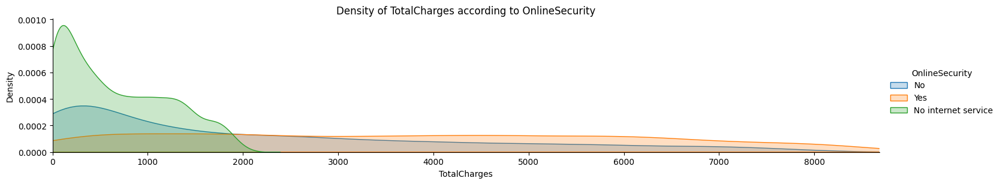

In [104]:
facet("TotalCharges","TotalCharges")

In [105]:
def Security_count(kind,feature):
    Security1 = data[data['OnlineSecurity']=="Yes"][feature].value_counts()
    Security2 = data[data['OnlineSecurity']=="No"][feature].value_counts()
    Security3 = data[data['OnlineSecurity']=="No internet service"][feature].value_counts()
    df = pd.DataFrame([Security1, Security2, Security3])
    df.index = ['Yes','No', "No internet service"]
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("OnlineSecurity")
    plt.xticks(rotation=0)

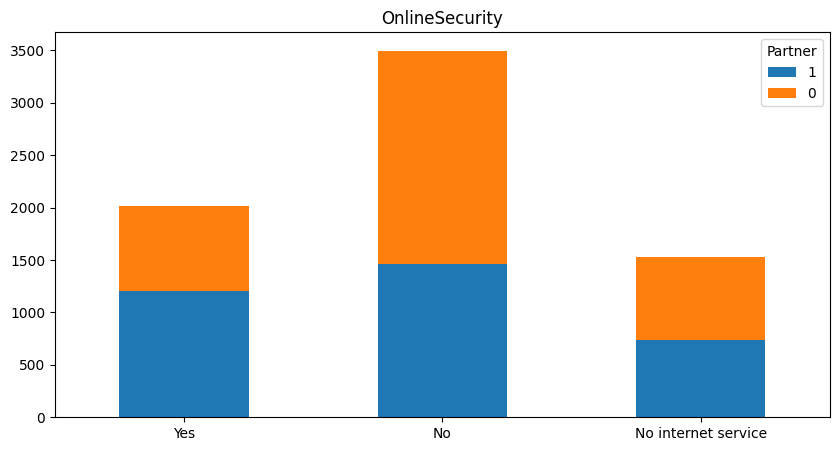

In [106]:
Security_count("bar","Partner")

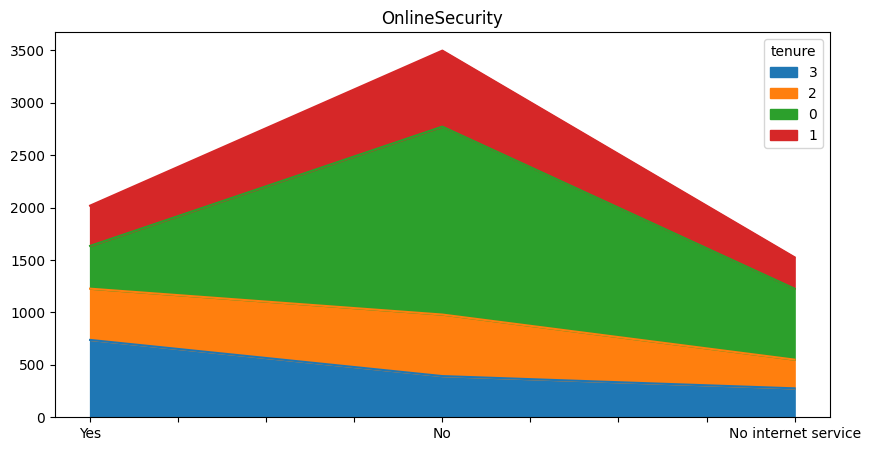

In [107]:
Security_count("area","tenure")

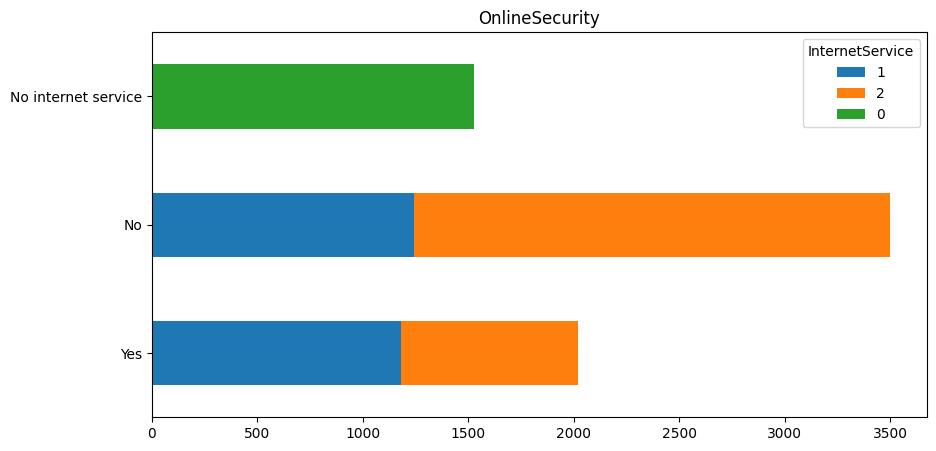

In [108]:
Security_count("barh","InternetService")


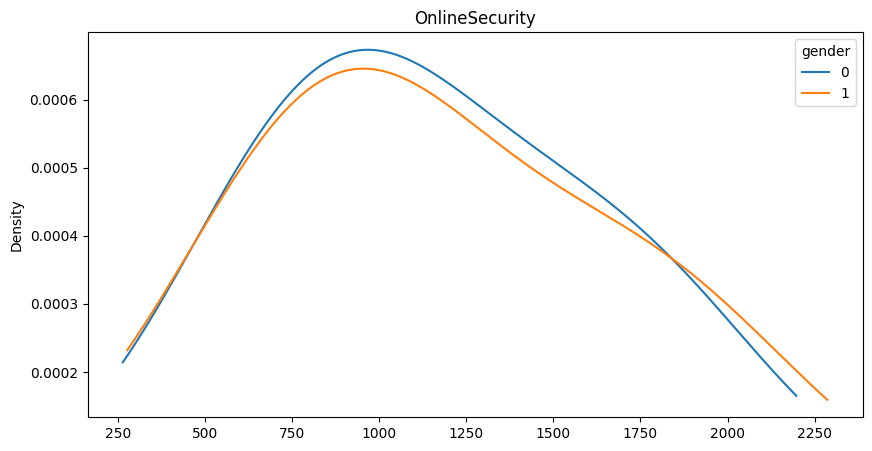

In [109]:
Security_count("density","gender")

In [110]:
data["OnlineSecurity"] = data["OnlineSecurity"].map({"No":2, "No internet service":0, "Yes":1})

In [111]:
data["OnlineSecurity"].value_counts()

OnlineSecurity
2    3498
1    2019
0    1526
Name: count, dtype: int64

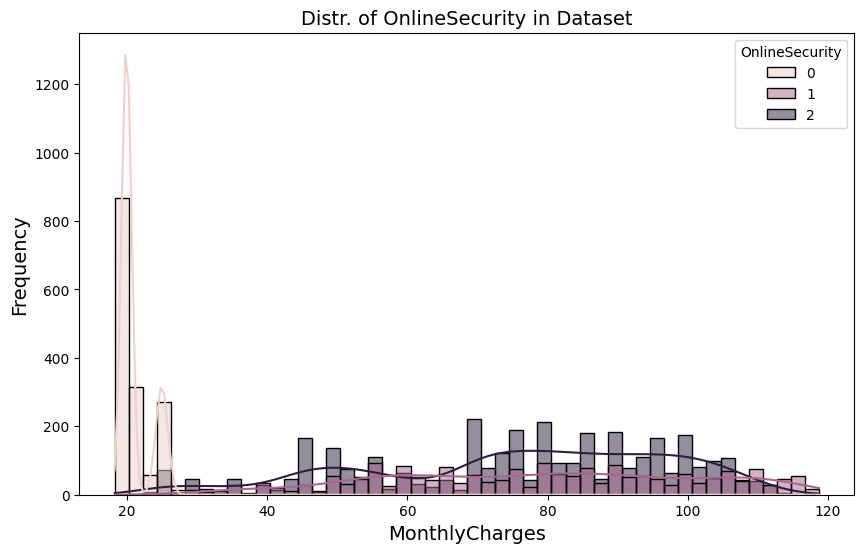

In [112]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='OnlineSecurity')  

## title and axis
plt.title('Distr. of OnlineSecurity in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

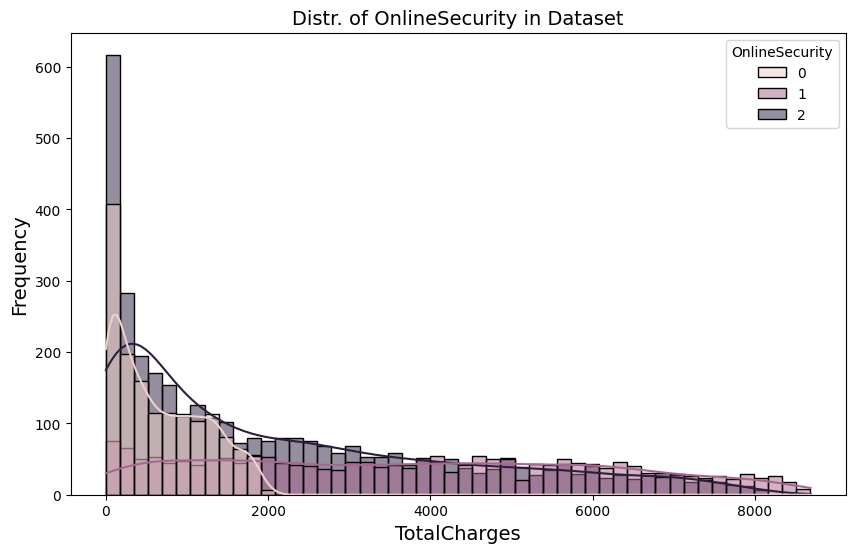

In [113]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='OnlineSecurity')  

## title and axis
plt.title('Distr. of OnlineSecurity in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# OnlineBackup

In [114]:
data["OnlineBackup"].value_counts()

OnlineBackup
No                     3088
Yes                    2429
No internet service    1526
Name: count, dtype: int64

In [115]:
print(3088/(3088+2429+1526))
print(2429/(3088+2429+1526))
print(1526/(3088+2429+1526))

0.43844952435041884
0.3448814425670879
0.21666903308249325


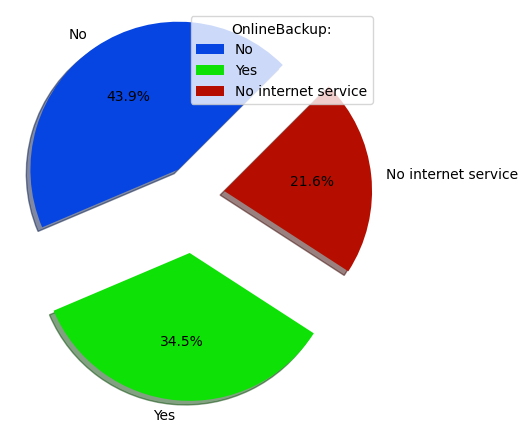

In [116]:
y = np.array([0.438, 0.344, 0.216]) #100
mylabels = ["No", "Yes", "No internet service"]
myexplode = [0.2, 0.4 , 0.2]
mycolors = ["#0645e1", "#0de106", "#b50e00"]

plt.pie(y, labels = mylabels, explode = myexplode ,colors = mycolors, startangle = 45 , autopct= '%1.1f%%' ,shadow = True)
plt.legend(title = "OnlineBackup:",loc='upper right')
plt.show() 

In [117]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="OnlineBackup", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to OnlineBackup")
    plt.show()


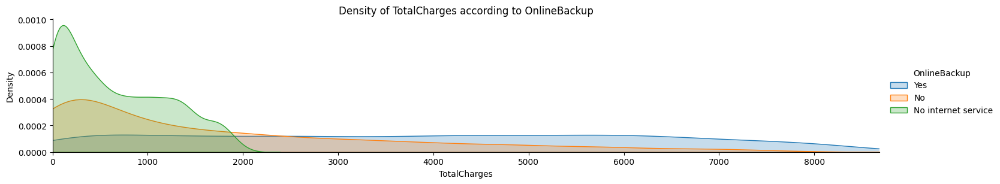

In [118]:
facet("TotalCharges","TotalCharges")

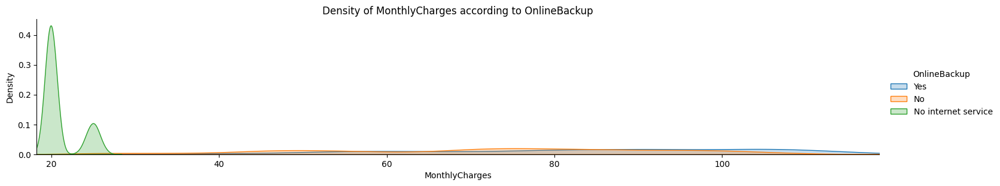

In [119]:
facet("MonthlyCharges","MonthlyCharges")

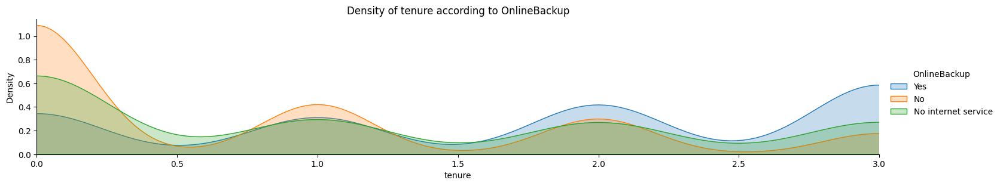

In [120]:
facet("tenure","tenure")

In [121]:
def Backup_count(kind,feature):
    Backup1 = data[data['OnlineBackup']=="Yes"][feature].value_counts()
    Backup2 = data[data['OnlineBackup']=="No"][feature].value_counts()
    Backup3 = data[data['OnlineBackup']=="No internet service"][feature].value_counts()
    df = pd.DataFrame([Backup1, Backup2, Backup3])
    df.index = ['Yes','No', "No internet service"]
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("OnlineBackup")
    plt.xticks(rotation=0)

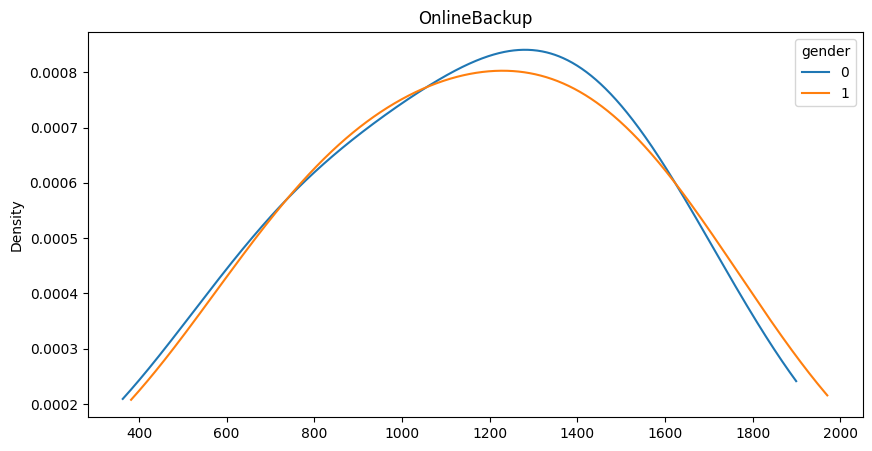

In [122]:
Backup_count("density", "gender")

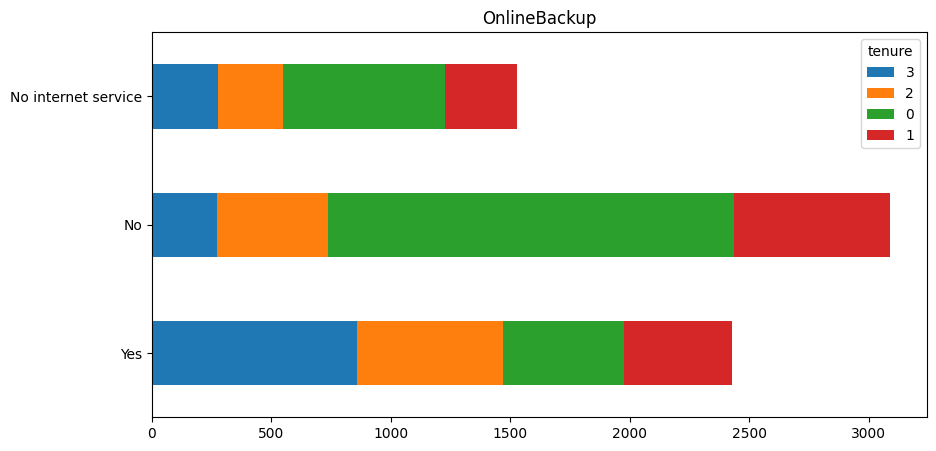

In [123]:
Backup_count("barh", "tenure")

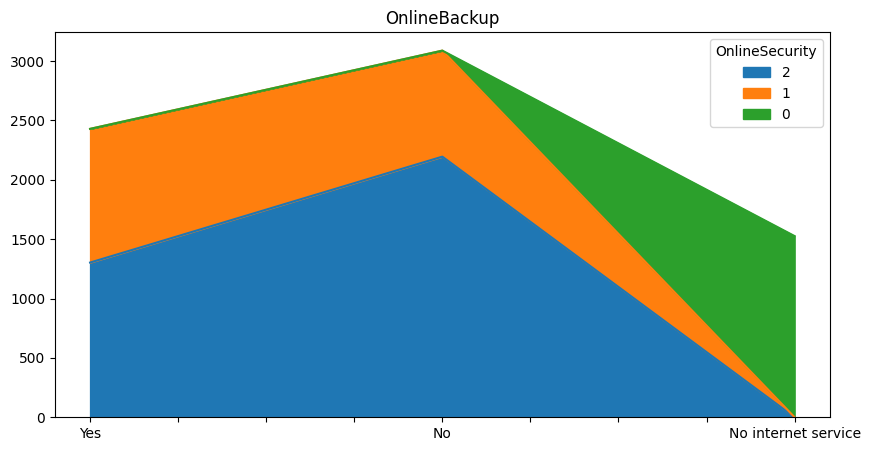

In [124]:
Backup_count("area", "OnlineSecurity")


In [125]:
data["OnlineBackup"] = data["OnlineBackup"].map({"No":2, "No internet service":0, "Yes":1})


In [126]:
data["OnlineBackup"].value_counts()

OnlineBackup
2    3088
1    2429
0    1526
Name: count, dtype: int64

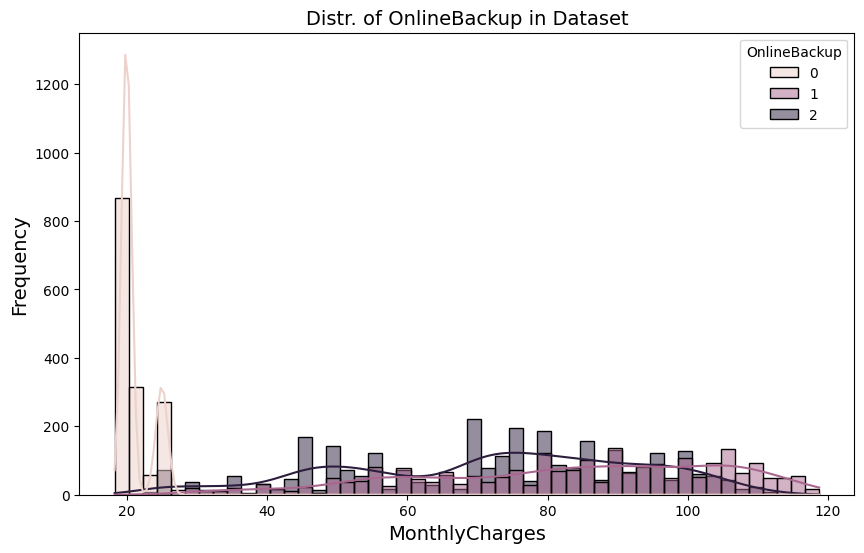

In [127]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='OnlineBackup')  

## title and axis
plt.title('Distr. of OnlineBackup in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

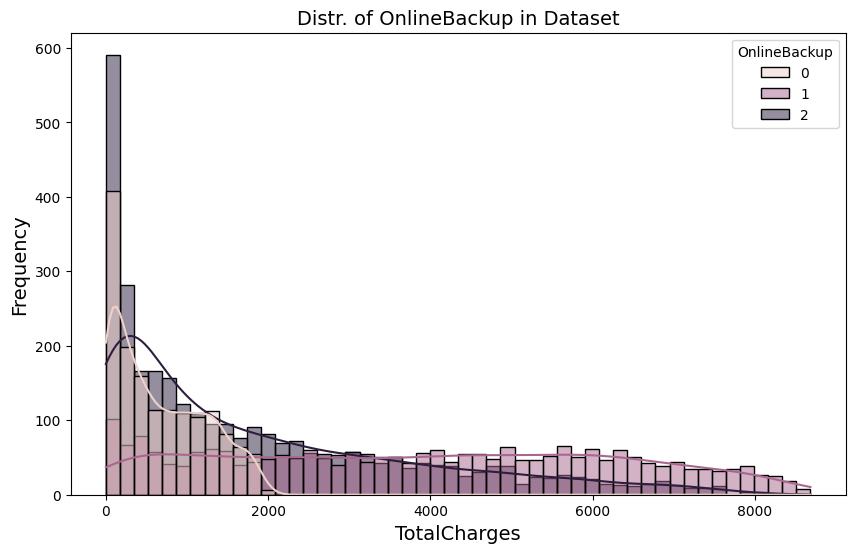

In [128]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='OnlineBackup')  

## title and axis
plt.title('Distr. of OnlineBackup in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# DeviceProtection

In [129]:
data["DeviceProtection"].value_counts()

DeviceProtection
No                     3095
Yes                    2422
No internet service    1526
Name: count, dtype: int64

In [130]:
print(3095/(3095+2422+1526))
print(2422/(3095+2422+1526))
print(1526/(3095+2422+1526))

0.43944341899758627
0.3438875479199205
0.21666903308249325


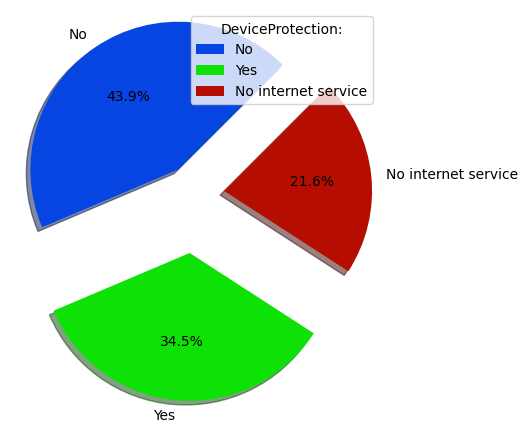

In [131]:
y = np.array([0.438, 0.344, 0.216]) #100
mylabels = ["No", "Yes", "No internet service"]
myexplode = [0.2, 0.4 , 0.2]
mycolors = ["#0645e1", "#0de106", "#b50e00"]

plt.pie(y, labels = mylabels, explode = myexplode ,colors = mycolors, startangle = 45 , autopct= '%1.1f%%' ,shadow = True)
plt.legend(title = "DeviceProtection:",loc='upper right')
plt.show() 

In [132]:
def Device_count(kind,feature):
    Device1 = data[data['DeviceProtection']=="Yes"][feature].value_counts()
    Device2 = data[data['DeviceProtection']=="No"][feature].value_counts()
    Device3 = data[data['DeviceProtection']=="No internet service"][feature].value_counts()
    df = pd.DataFrame([Device1, Device2, Device3])
    df.index = ['Yes','No', "No internet service"]
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("DeviceProtection")
    plt.xticks(rotation=0)

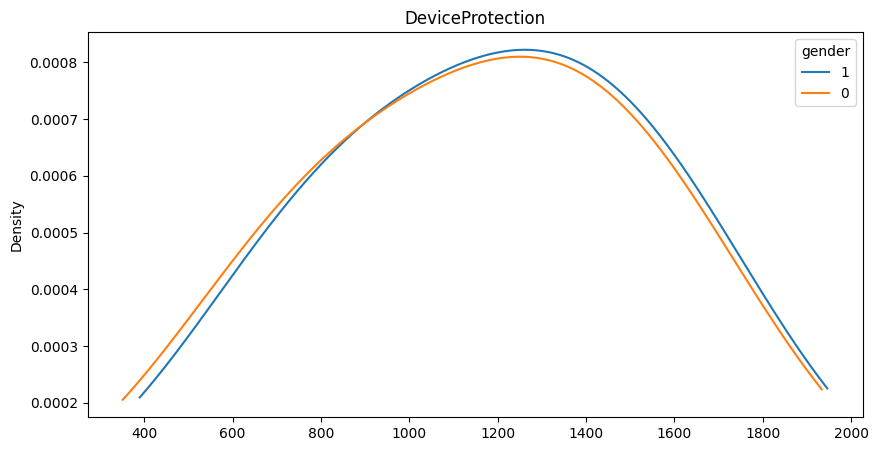

In [133]:
Device_count("density", "gender")

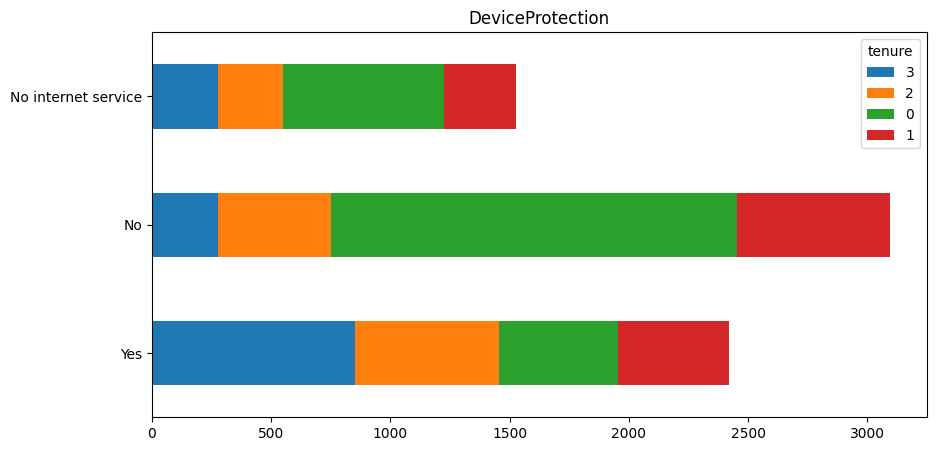

In [134]:
Device_count("barh", "tenure")

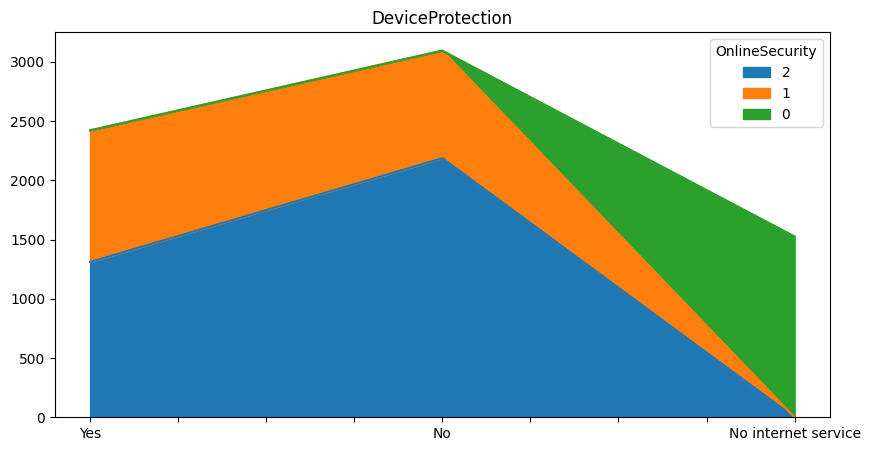

In [135]:
Device_count("area", "OnlineSecurity")

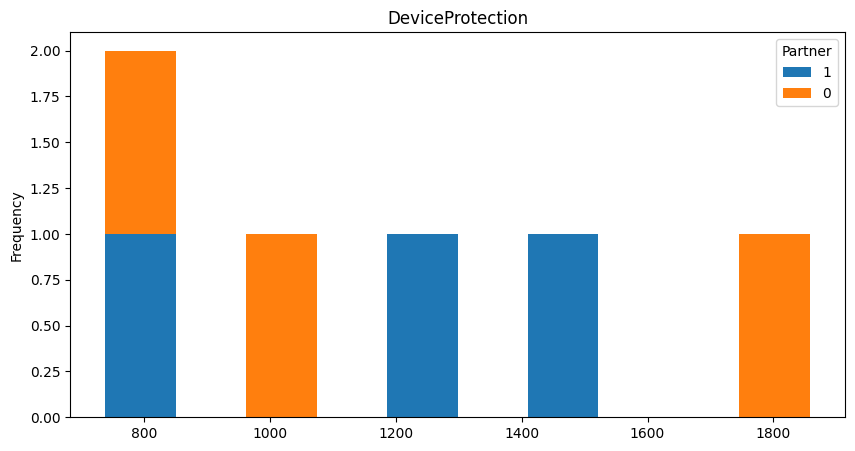

In [136]:
Device_count("hist", "Partner")

In [137]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="DeviceProtection", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to DeviceProtection")
    plt.show()


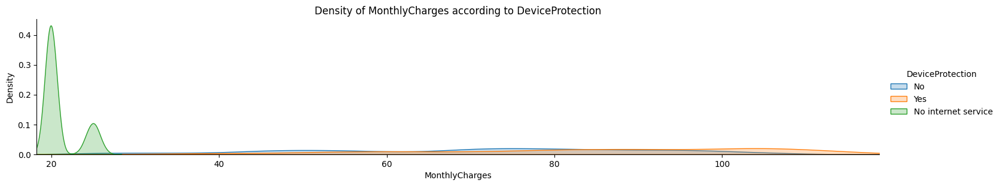

In [138]:
facet("MonthlyCharges","MonthlyCharges")

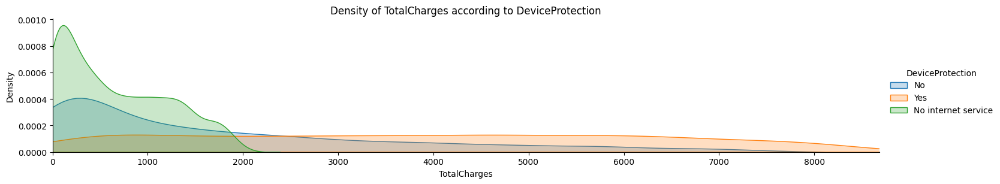

In [139]:
facet("TotalCharges","TotalCharges")

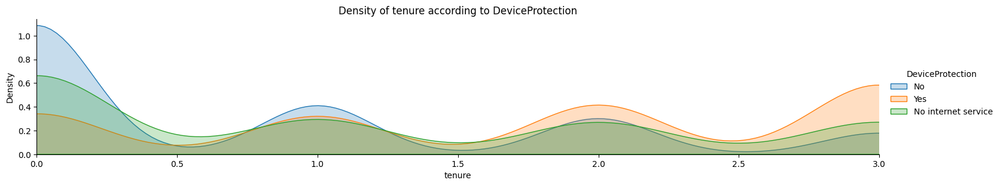

In [140]:
facet("tenure","tenure")

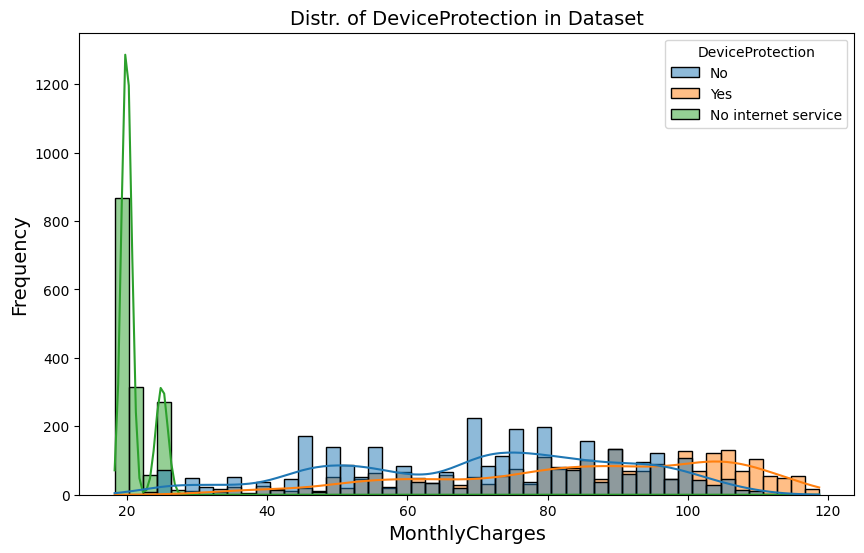

In [141]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='DeviceProtection')  

## title and axis
plt.title('Distr. of DeviceProtection in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

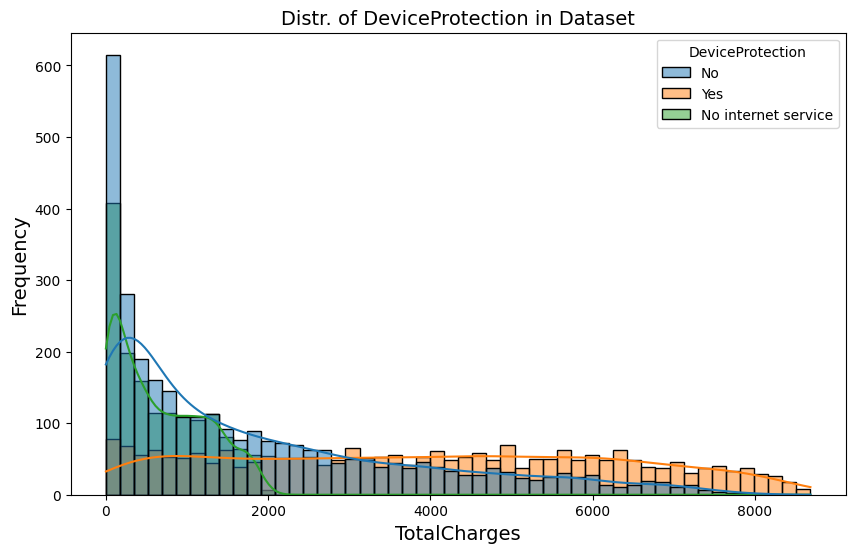

In [142]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='DeviceProtection')  

## title and axis
plt.title('Distr. of DeviceProtection in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

In [143]:
data["DeviceProtection"] = data["DeviceProtection"].map({"No":2, "No internet service":0, "Yes":1})


In [144]:
data["DeviceProtection"].value_counts()

DeviceProtection
2    3095
1    2422
0    1526
Name: count, dtype: int64

# TechSupport

In [145]:
data["TechSupport"].value_counts()

TechSupport
No                     3473
Yes                    2044
No internet service    1526
Name: count, dtype: int64

In [146]:
print(3473/(3473+2044+1526))
print(2044/(3473+2044+1526))
print(1526/(3473+2044+1526))

0.4931137299446259
0.2902172369728809
0.21666903308249325


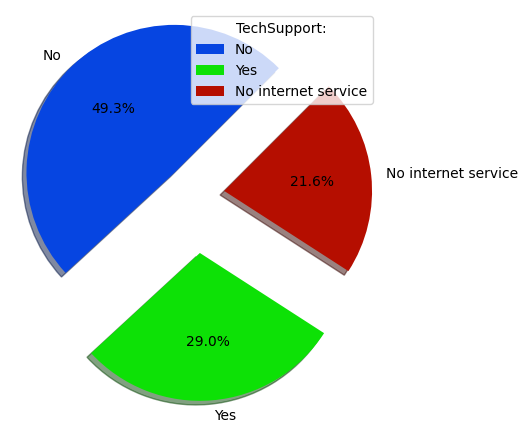

In [147]:
y = np.array([0.493, 0.290, 0.216]) #100
mylabels = ["No", "Yes", "No internet service"]
myexplode = [0.2, 0.4 , 0.2]
mycolors = ["#0645e1", "#0de106", "#b50e00"]

plt.pie(y, labels = mylabels, explode = myexplode ,colors = mycolors, startangle = 45 , autopct= '%1.1f%%' ,shadow = True)
plt.legend(title = "TechSupport:",loc='upper right')
plt.show() 

In [148]:
def Tech_count(kind,feature):
    Tech1 = data[data['TechSupport']=="Yes"][feature].value_counts()
    Tech2 = data[data['TechSupport']=="No"][feature].value_counts()
    Tech3 = data[data['TechSupport']=="No internet service"][feature].value_counts()
    df = pd.DataFrame([Tech1, Tech2, Tech3])
    df.index = ['Yes','No', "No internet service"]
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("TechSupport")
    plt.xticks(rotation=0)

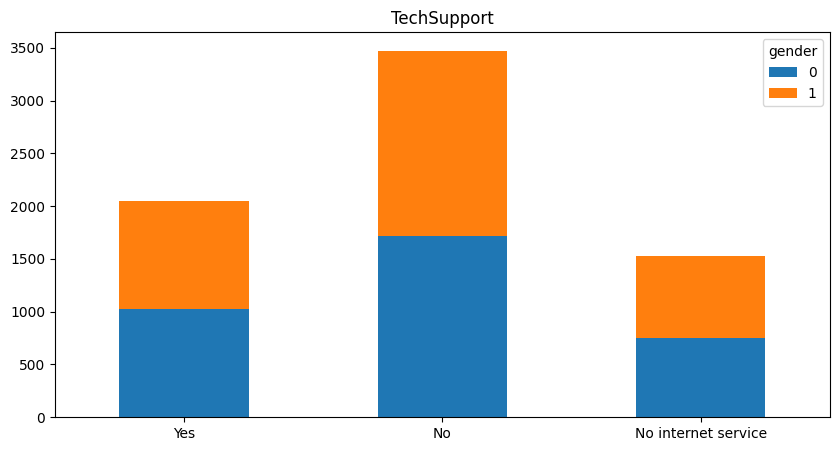

In [149]:
Tech_count("bar","gender")

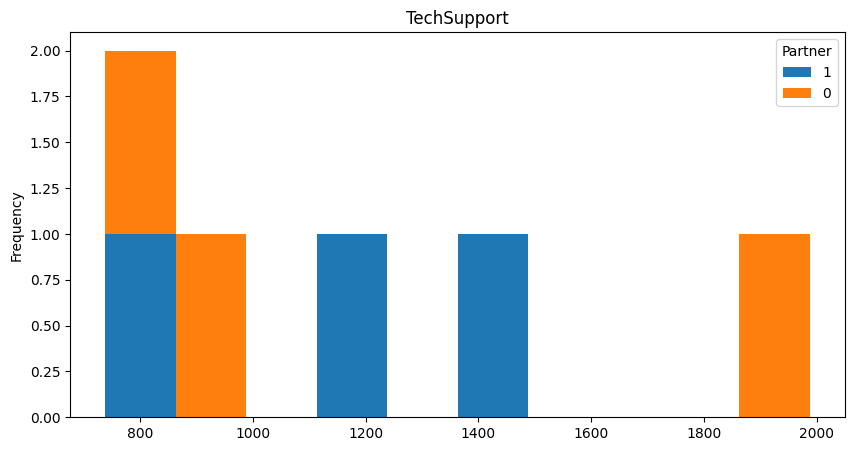

In [150]:
Tech_count("hist","Partner")

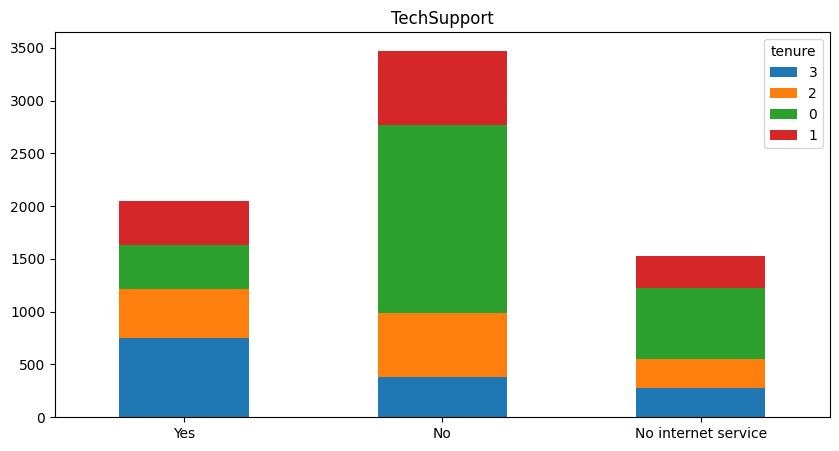

In [151]:
Tech_count("bar","tenure")

In [152]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="TechSupport", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to TechSupport")
    plt.show()


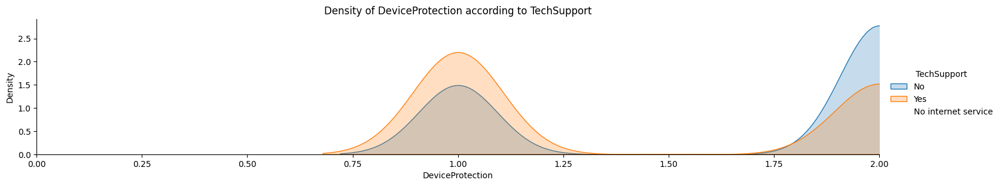

In [153]:
facet("DeviceProtection","DeviceProtection")

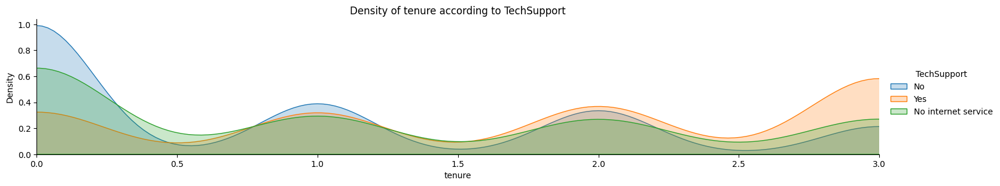

In [154]:
facet("tenure","tenure")

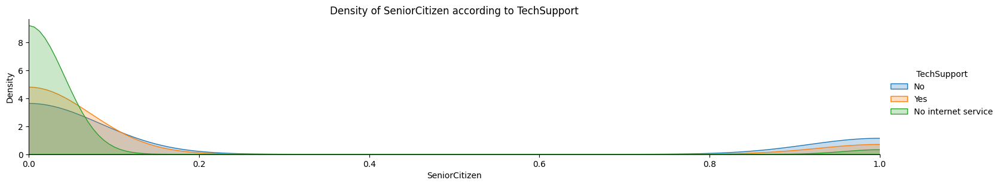

In [155]:
facet("SeniorCitizen","SeniorCitizen")

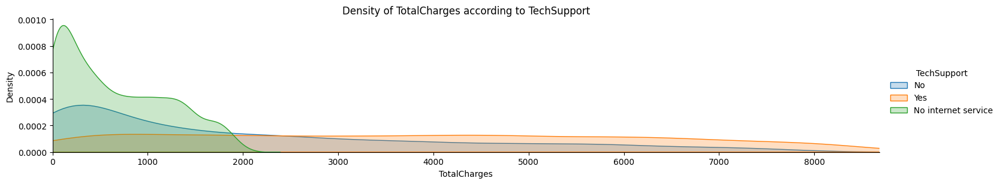

In [156]:
facet("TotalCharges","TotalCharges")

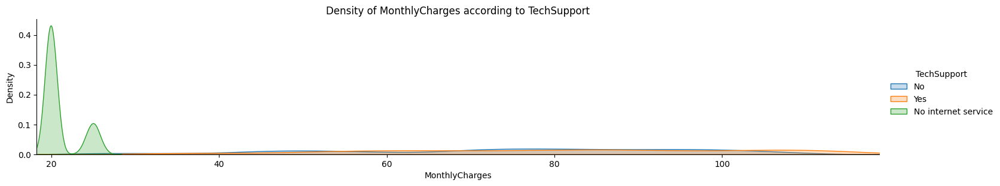

In [157]:
facet("MonthlyCharges","MonthlyCharges")

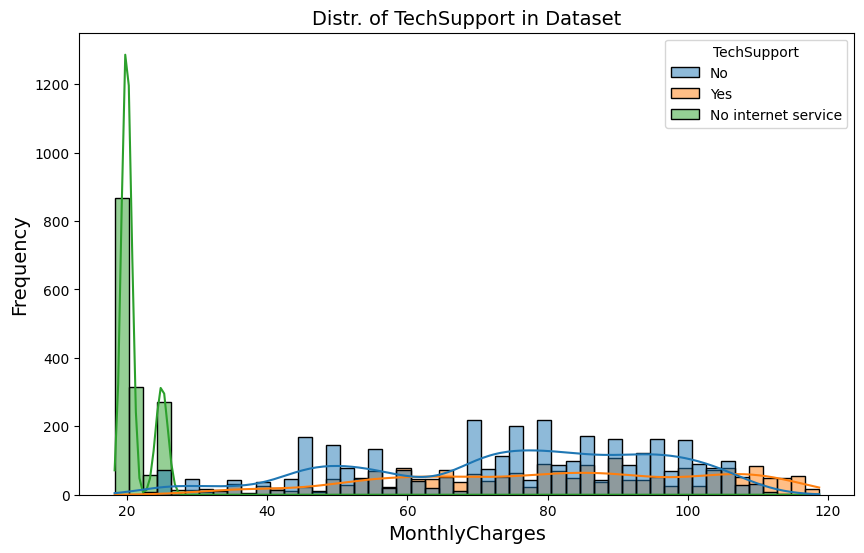

In [158]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='TechSupport')  

## title and axis
plt.title('Distr. of TechSupport in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

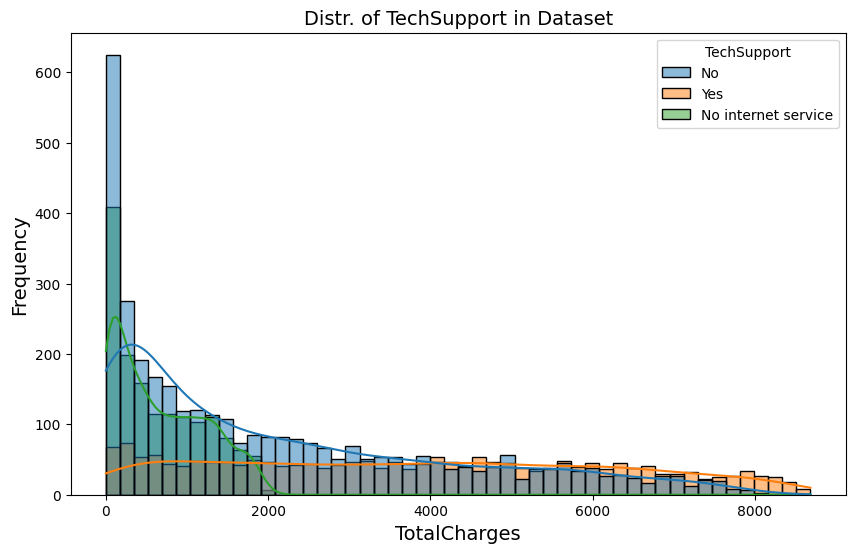

In [159]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='TechSupport')  

## title and axis
plt.title('Distr. of TechSupport in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

In [160]:
data["TechSupport"] = data["TechSupport"].map({"No":2, "No internet service":0, "Yes":1})

In [161]:
data["TechSupport"].value_counts()

TechSupport
2    3473
1    2044
0    1526
Name: count, dtype: int64

# StreamingTV

In [162]:
data["StreamingTV"].value_counts()

StreamingTV
No                     2810
Yes                    2707
No internet service    1526
Name: count, dtype: int64

In [163]:
print(2810/(2810+2707+1526))
print(2707/(2810+2707+1526))
print(1526/(2810+2707+1526))

0.3989777083629135
0.38435325855459324
0.21666903308249325


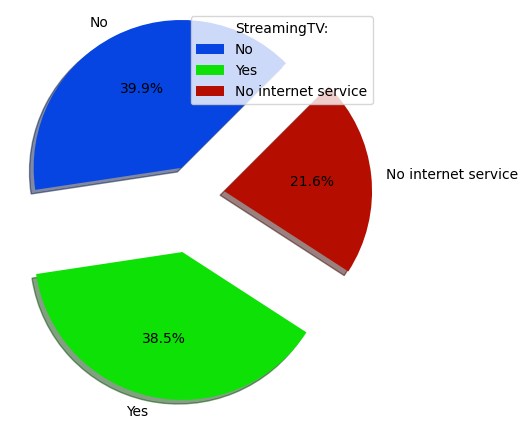

In [164]:
y = np.array([0.398, 0.384, 0.216]) #100
mylabels = ["No", "Yes", "No internet service"]
myexplode = [0.2, 0.4 , 0.2]
mycolors = ["#0645e1", "#0de106", "#b50e00"]

plt.pie(y, labels = mylabels, explode = myexplode ,colors = mycolors, startangle = 45 , autopct= '%1.1f%%' ,shadow = True)
plt.legend(title = "StreamingTV:",loc='upper right')
plt.show() 

In [165]:
def StreamingTV_count(kind,feature):
    StreamingTV1 = data[data['StreamingTV']=="Yes"][feature].value_counts()
    StreamingTV2 = data[data['StreamingTV']=="No"][feature].value_counts()
    StreamingTV3 = data[data['StreamingTV']=="No internet service"][feature].value_counts()
    df = pd.DataFrame([StreamingTV1, StreamingTV2, StreamingTV3])
    df.index = ['Yes','No', "No internet service"]
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("StreamingTV")
    plt.xticks(rotation=0)

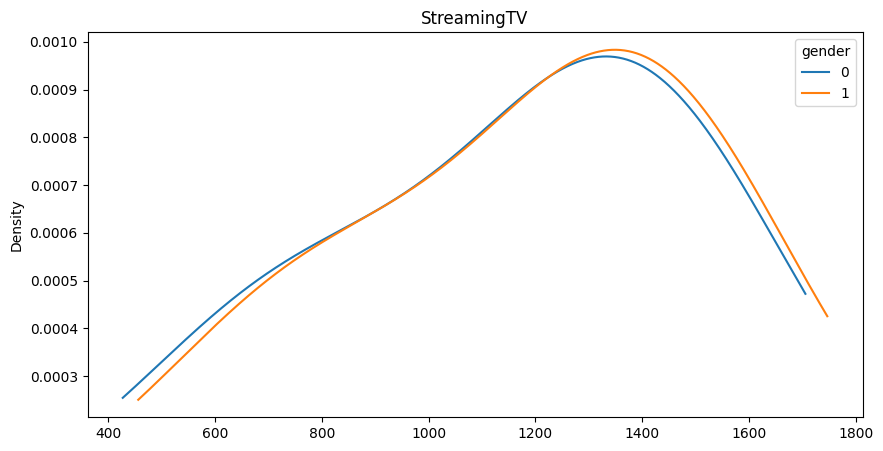

In [166]:
StreamingTV_count("density", "gender")

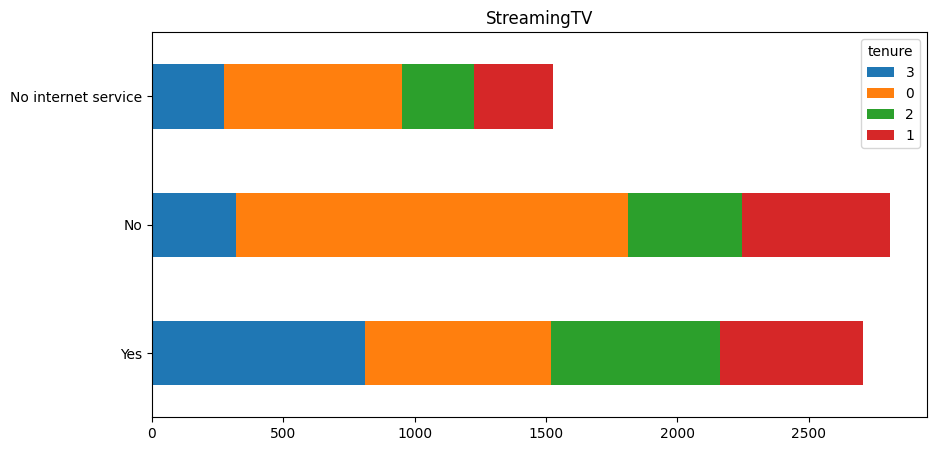

In [167]:
StreamingTV_count("barh", "tenure")

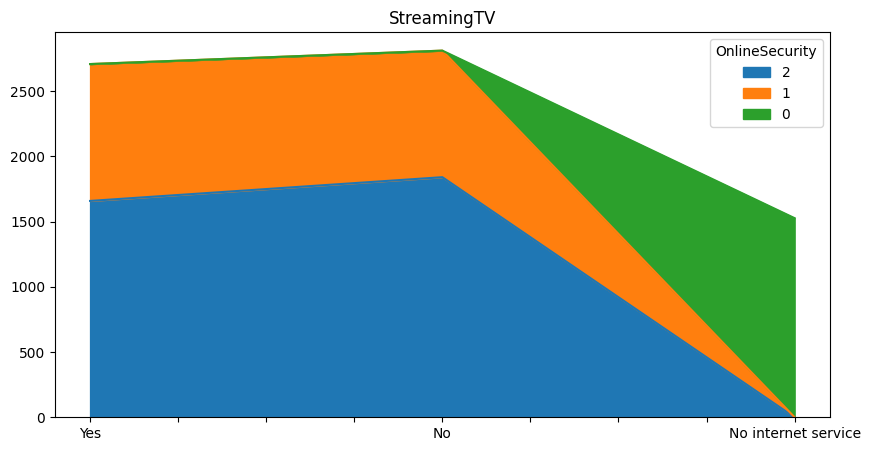

In [168]:
StreamingTV_count("area", "OnlineSecurity")

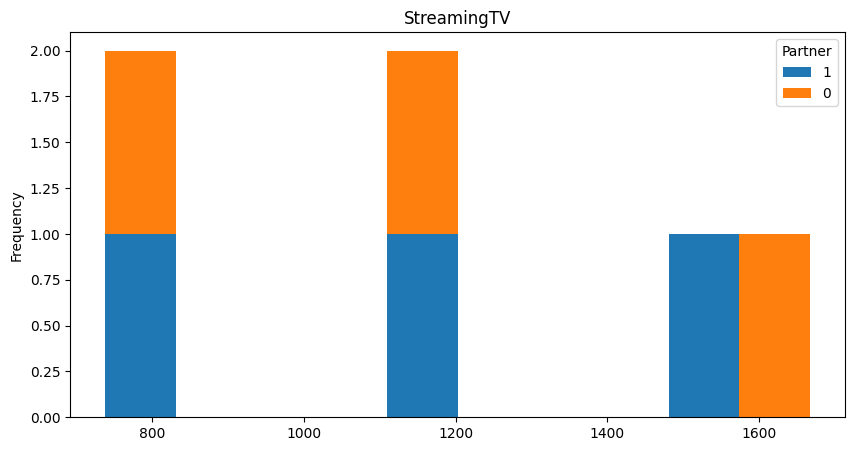

In [169]:
StreamingTV_count("hist", "Partner")

In [170]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="StreamingTV", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to StreamingTV")
    plt.show()


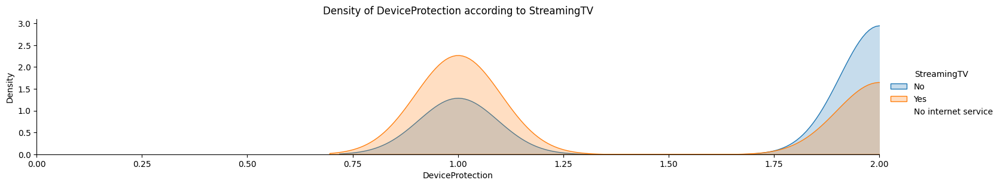

In [171]:
facet("DeviceProtection","DeviceProtection")

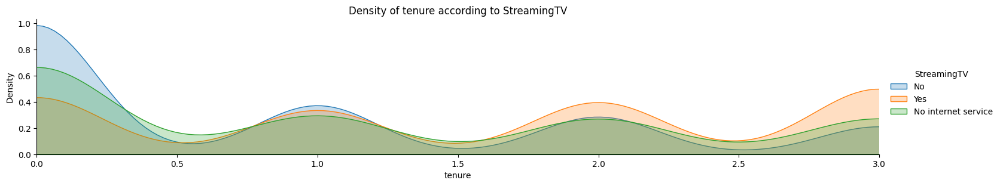

In [172]:
facet("tenure","tenure")

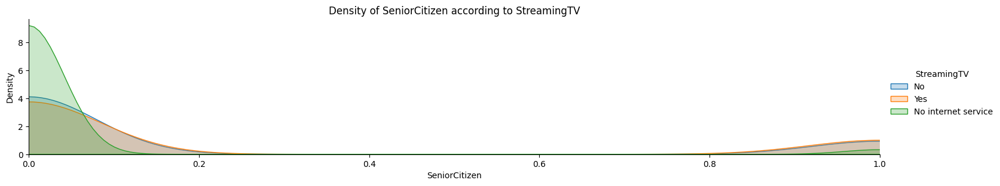

In [173]:
facet("SeniorCitizen","SeniorCitizen")

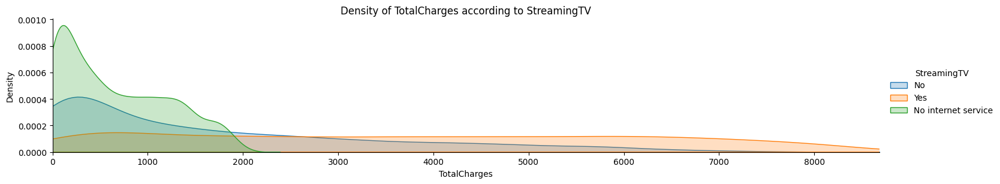

In [174]:
facet("TotalCharges","TotalCharges")

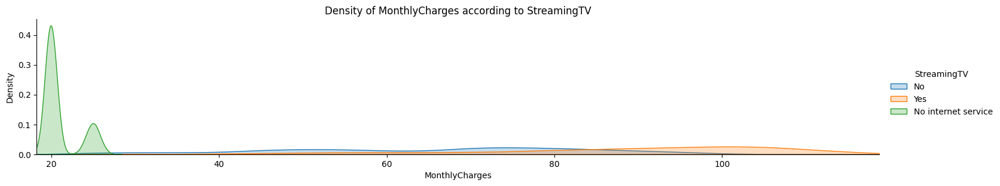

In [175]:
facet("MonthlyCharges","MonthlyCharges")

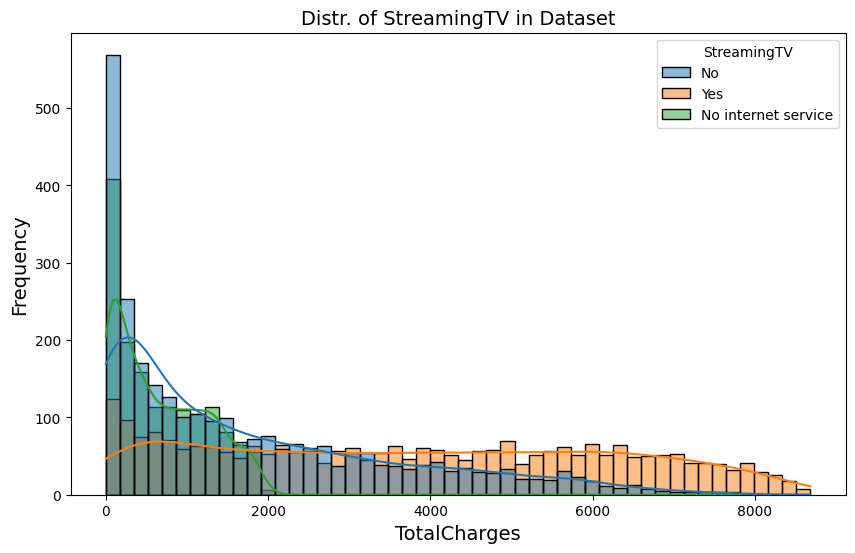

In [176]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='StreamingTV')  

## title and axis
plt.title('Distr. of StreamingTV in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

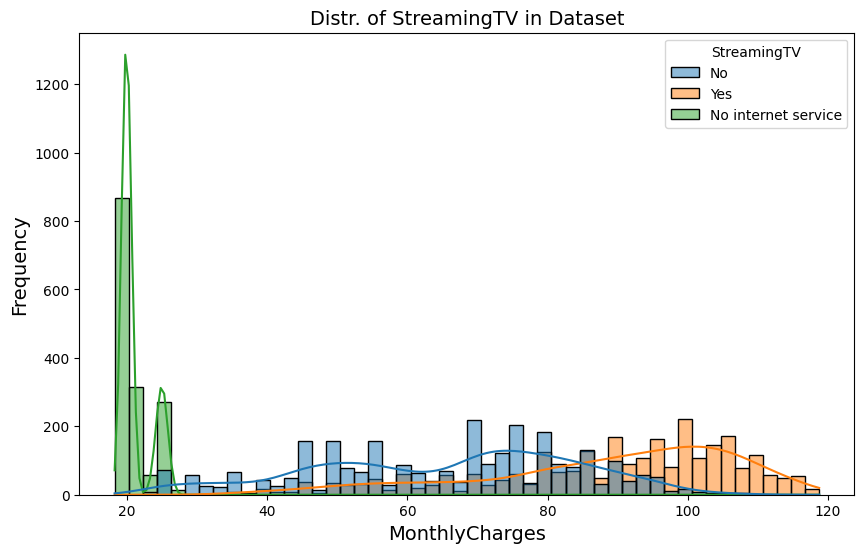

In [177]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='StreamingTV')  

## title and axis
plt.title('Distr. of StreamingTV in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

In [178]:
data["StreamingTV"] = data["StreamingTV"].map({"No":2, "No internet service":0, "Yes":1})
data["StreamingTV"].value_counts()

StreamingTV
2    2810
1    2707
0    1526
Name: count, dtype: int64

# StreamingMovies

In [179]:
data["StreamingMovies"].value_counts()

StreamingMovies
No                     2785
Yes                    2732
No internet service    1526
Name: count, dtype: int64

In [180]:
print(2785/(2785+2732+1526))
print(2732/(2785+2732+1526))
print(1526/(2785+2732+1526))

0.39542808462303
0.3879028822944768
0.21666903308249325


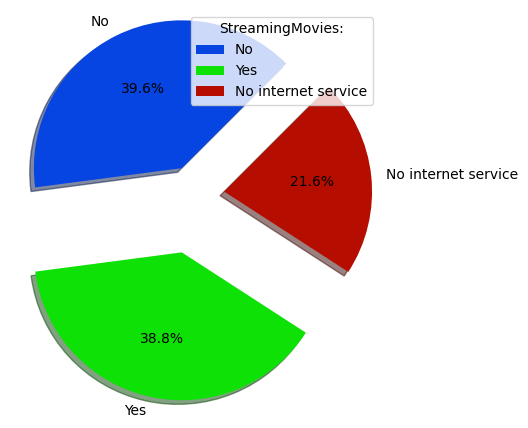

In [181]:
y = np.array([0.395, 0.387, 0.216]) #100
mylabels = ["No", "Yes", "No internet service"]
myexplode = [0.2, 0.4 , 0.2]
mycolors = ["#0645e1", "#0de106", "#b50e00"]

plt.pie(y, labels = mylabels, explode = myexplode ,colors = mycolors, startangle = 45 , autopct= '%1.1f%%' ,shadow = True)
plt.legend(title = "StreamingMovies:",loc='upper right')
plt.show() 

In [182]:
def StreamingMovies_count(kind,feature):
    StreamingMovies1 = data[data['StreamingMovies']=="Yes"][feature].value_counts()
    StreamingMovies2 = data[data['StreamingMovies']=="No"][feature].value_counts()
    StreamingMovies3 = data[data['StreamingMovies']=="No internet service"][feature].value_counts()
    df = pd.DataFrame([StreamingMovies1, StreamingMovies2, StreamingMovies3])
    df.index = ['Yes','No', "No internet service"]
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("StreamingMovies")
    plt.xticks(rotation=0)

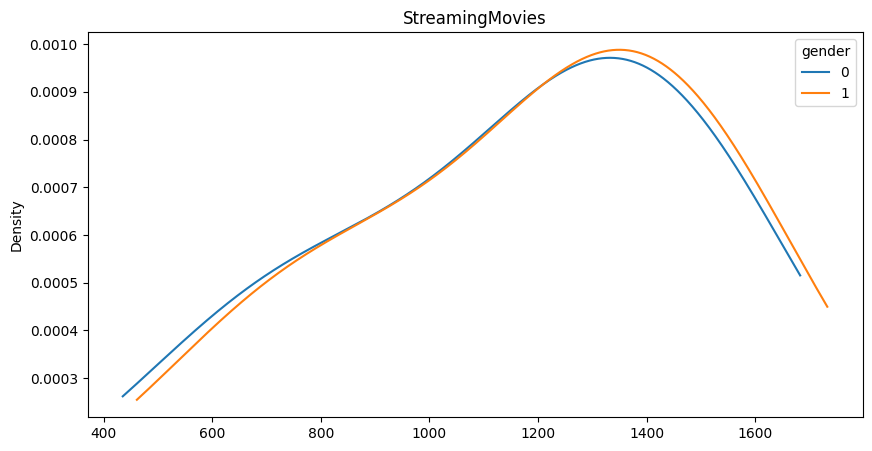

In [183]:
StreamingMovies_count("density", "gender")

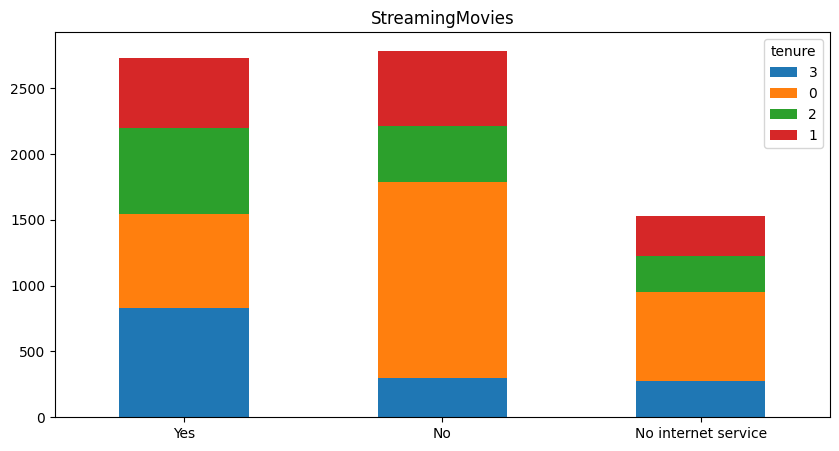

In [184]:
StreamingMovies_count("bar", "tenure")

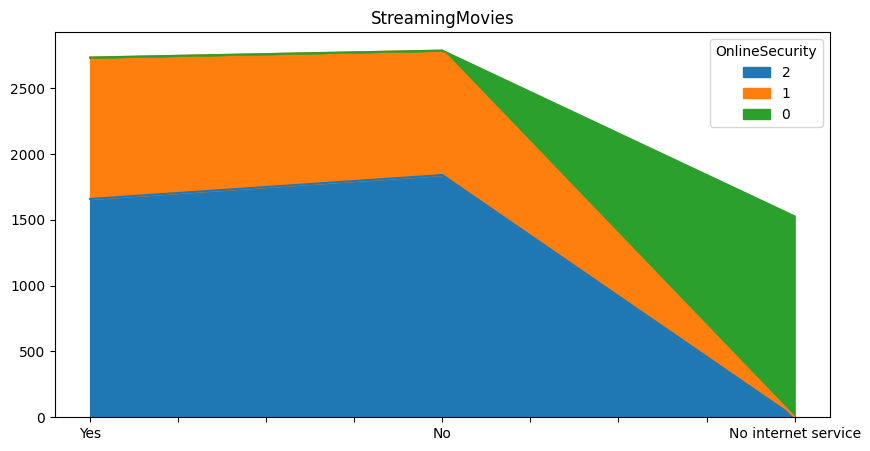

In [185]:
StreamingMovies_count("area", "OnlineSecurity")

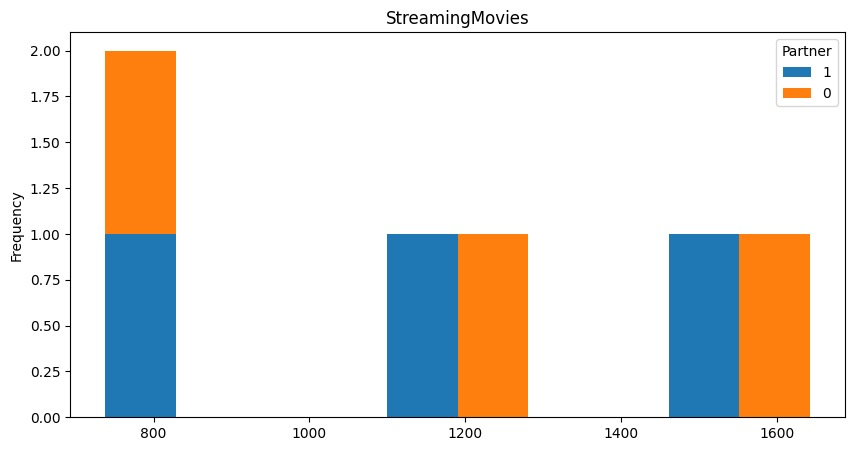

In [186]:
StreamingMovies_count("hist", "Partner")

In [187]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="StreamingMovies", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to StreamingMovies")
    plt.show()


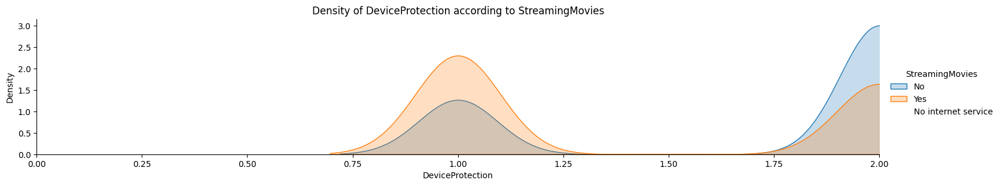

In [188]:
facet("DeviceProtection","DeviceProtection")

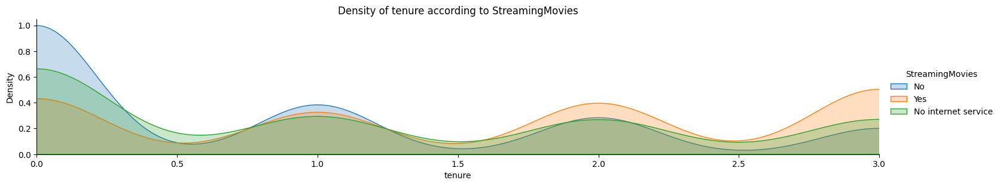

In [189]:
facet("tenure","tenure")

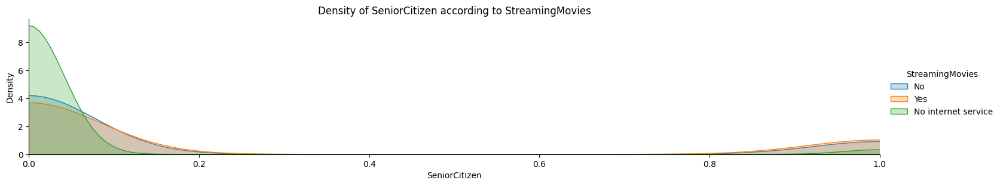

In [190]:
facet("SeniorCitizen","SeniorCitizen")

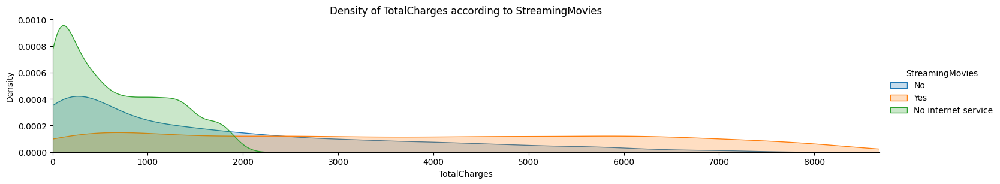

In [191]:
facet("TotalCharges","TotalCharges")

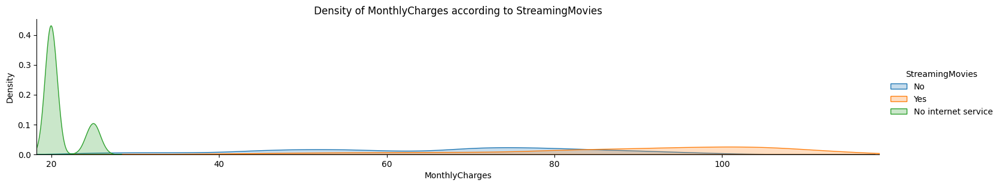

In [192]:
facet("MonthlyCharges","MonthlyCharges")

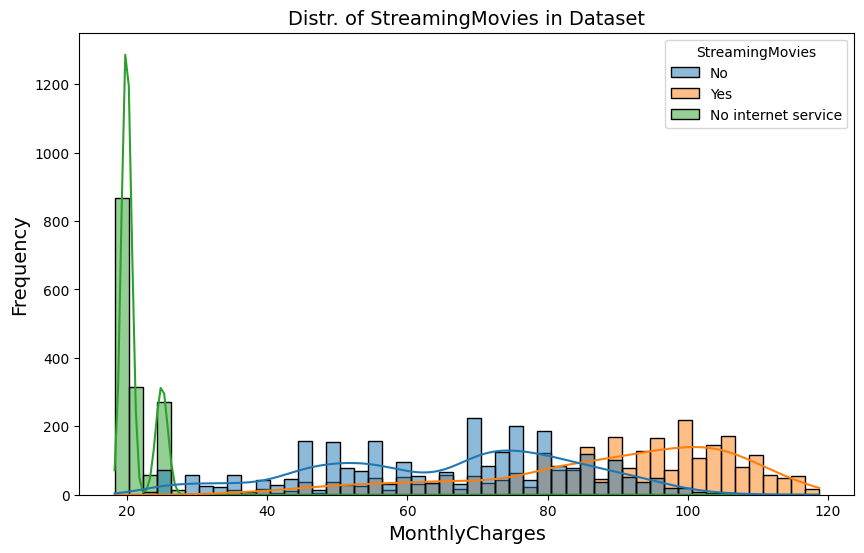

In [193]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='StreamingMovies')  

## title and axis
plt.title('Distr. of StreamingMovies in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

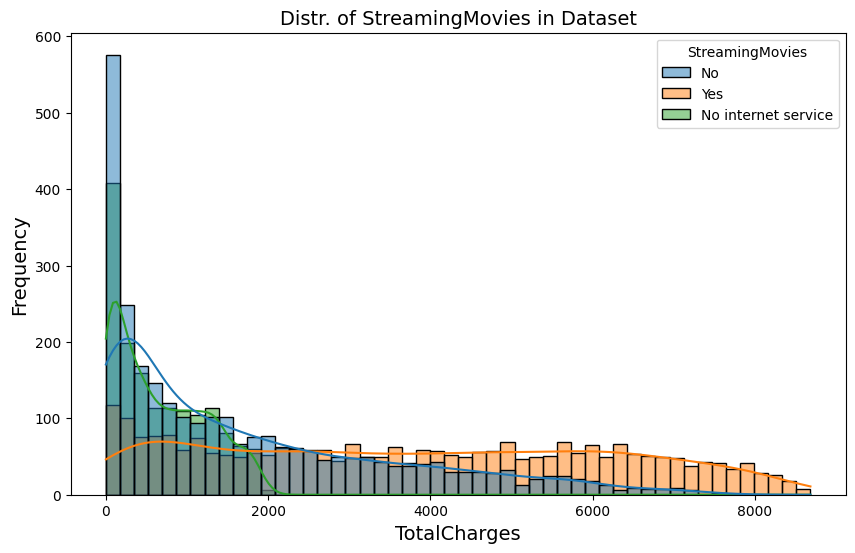

In [194]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='StreamingMovies')  

## title and axis
plt.title('Distr. of StreamingMovies in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

In [195]:
data["StreamingMovies"] = data["StreamingMovies"].map({"No":2, "No internet service":0, "Yes":1})
data["StreamingMovies"].value_counts()

StreamingMovies
2    2785
1    2732
0    1526
Name: count, dtype: int64

# PaperlessBilling

In [196]:
data["PaperlessBilling"].value_counts()

PaperlessBilling
Yes    4171
No     2872
Name: count, dtype: int64

In [197]:
print(4171/(4171+2872))
print(2872/(4171+2872))

0.5922192247621753
0.4077807752378248


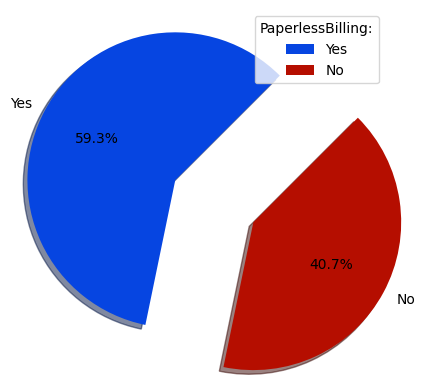

In [198]:
y = np.array([0.592, 0.407]) #100
mylabels = ["Yes", "No"]
myexplode = [0.2, 0.4]
mycolors = ["#0645e1","#b50e00"]

plt.pie(y, labels = mylabels, explode = myexplode ,colors = mycolors, startangle = 45 , autopct= '%1.1f%%' ,shadow = True)
plt.legend(title = "PaperlessBilling:",loc='upper right')
plt.show() 

In [199]:
def PaperlessBilling_count(kind,feature):
    Billing1 = data[data['PaperlessBilling']=="Yes"][feature].value_counts()
    Billing2 = data[data['PaperlessBilling']=="No"][feature].value_counts()
    df = pd.DataFrame([Billing1, Billing2])
    df.index = ['Yes','No']
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("PaperlessBilling")
    plt.xticks(rotation=0)

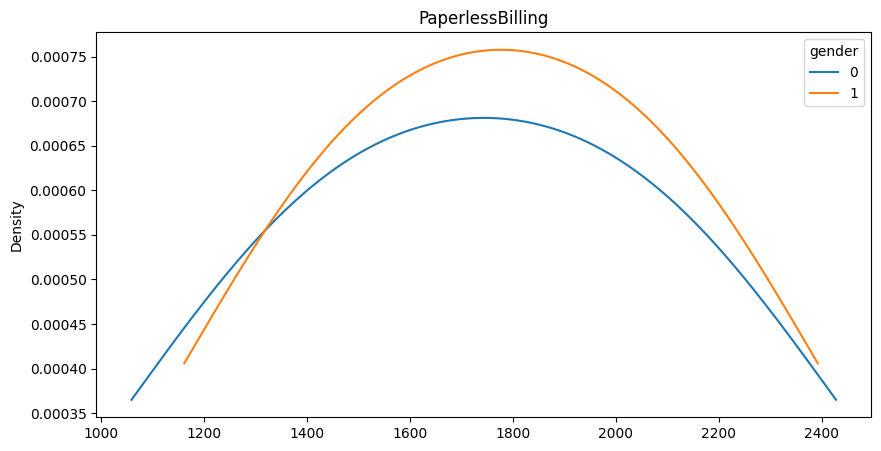

In [200]:
PaperlessBilling_count("density", "gender")

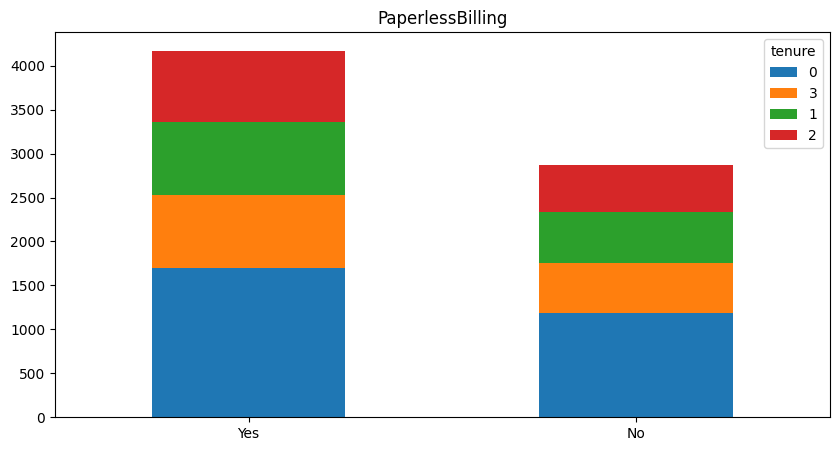

In [201]:
PaperlessBilling_count("bar", "tenure")

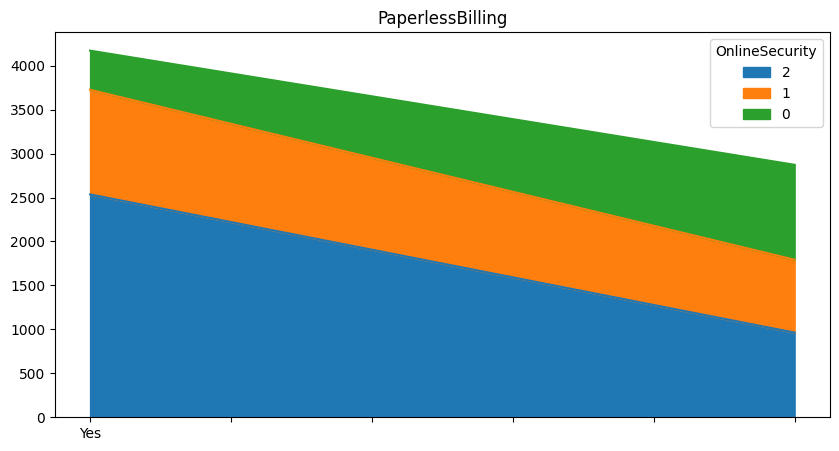

In [202]:
PaperlessBilling_count("area", "OnlineSecurity")

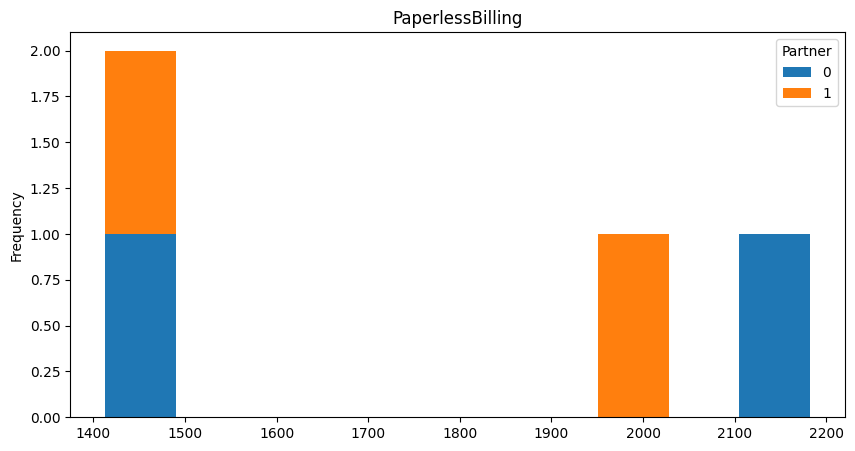

In [203]:
PaperlessBilling_count("hist", "Partner")

In [204]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="PaperlessBilling", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to PaperlessBilling")
    plt.show()


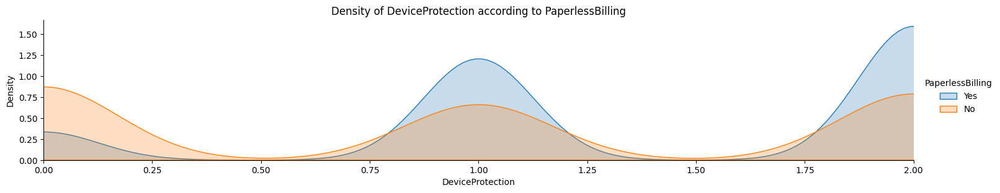

In [205]:
facet("DeviceProtection","DeviceProtection")

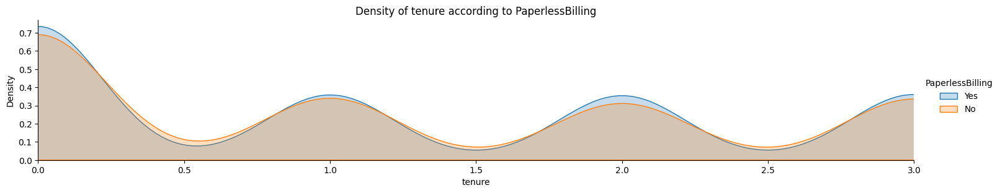

In [206]:
facet("tenure","tenure")

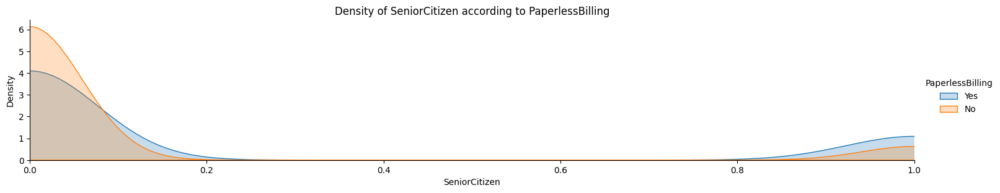

In [207]:
facet("SeniorCitizen","SeniorCitizen")

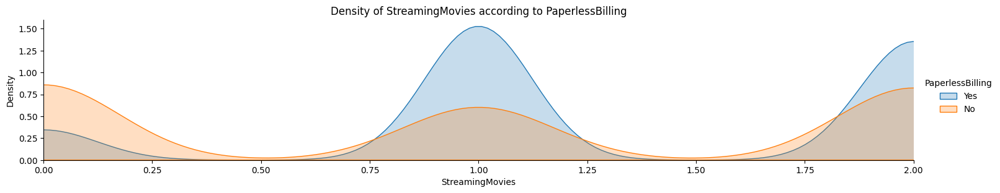

In [208]:
facet("StreamingMovies","StreamingMovies")

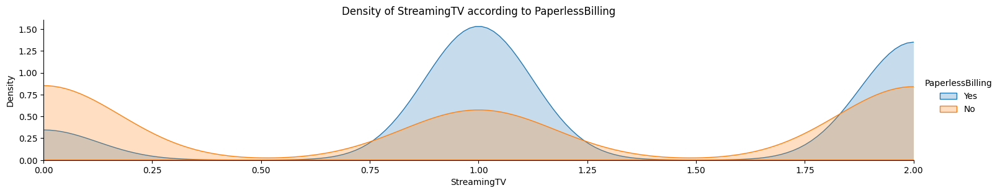

In [209]:
facet("StreamingTV","StreamingTV")

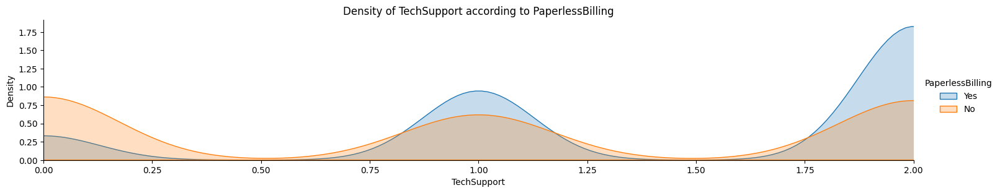

In [210]:
facet("TechSupport","TechSupport")

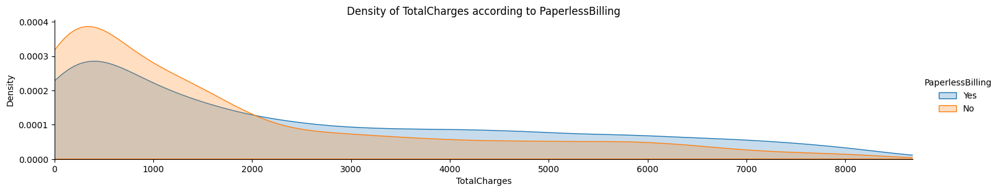

In [211]:
facet("TotalCharges","TotalCharges")

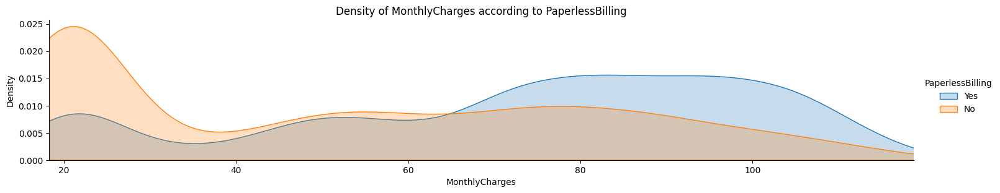

In [212]:
facet("MonthlyCharges","MonthlyCharges")

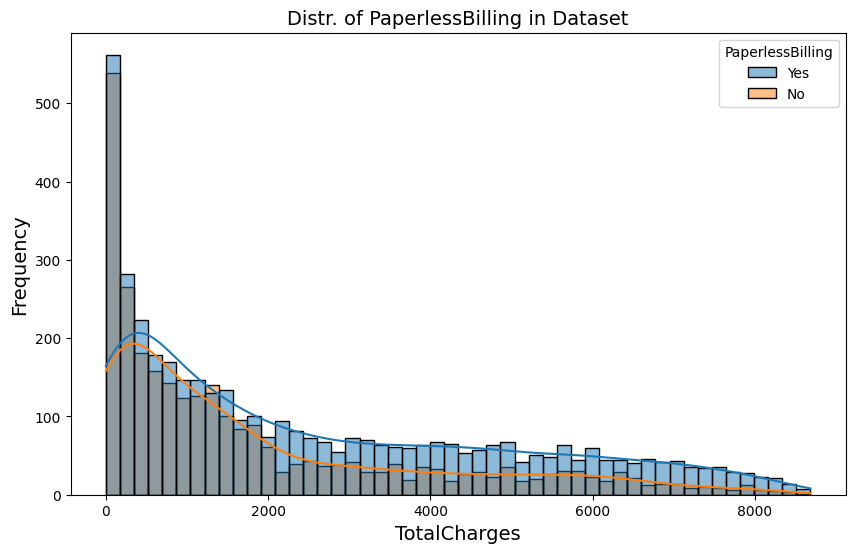

In [213]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='PaperlessBilling')  

## title and axis
plt.title('Distr. of PaperlessBilling in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

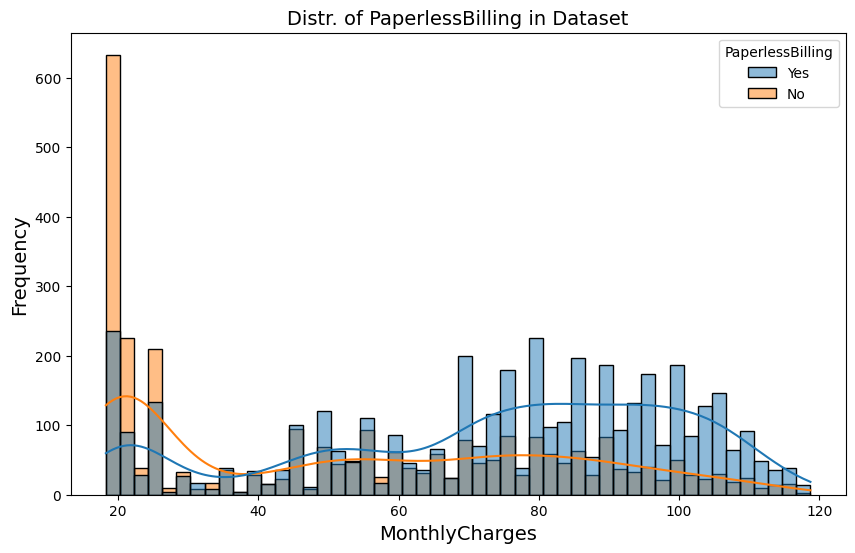

In [214]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='PaperlessBilling')  

## title and axis
plt.title('Distr. of PaperlessBilling in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

In [215]:
data["PaperlessBilling"] = data["PaperlessBilling"].map({"No":0, "Yes":1})
data["PaperlessBilling"].value_counts()

PaperlessBilling
1    4171
0    2872
Name: count, dtype: int64

# Contract

In [216]:
data["Contract"].value_counts()

Contract
Month-to-month    3875
Two year          1695
One year          1473
Name: count, dtype: int64

In [217]:
data["Contract"]=data["Contract"].replace("Month-to-month", "Monthly")

In [218]:
data["Contract"].value_counts()

Contract
Monthly     3875
Two year    1695
One year    1473
Name: count, dtype: int64

In [219]:
print(3875/(3875+1695+1473))
print(1695/(3875+1695+1473))
print(1473/(3875+1695+1473))

0.5501916796819537
0.24066448956410622
0.20914383075394008


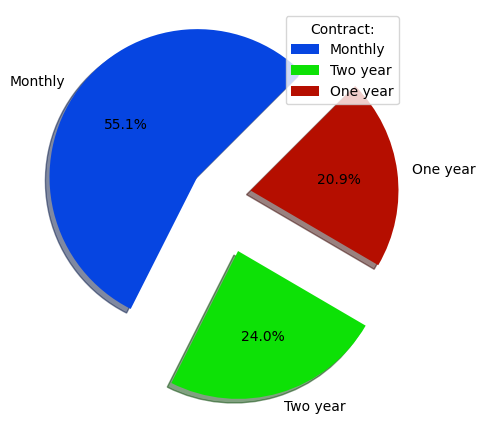

In [220]:
y = np.array([0.550, 0.240, 0.209]) #100
mylabels = ["Monthly", "Two year", "One year"]
myexplode = [0.2, 0.4, 0.2]
mycolors = ["#0645e1", "#0de106", "#b50e00"]

plt.pie(y, labels = mylabels, explode = myexplode ,colors = mycolors, startangle = 45 , autopct= '%1.1f%%' ,shadow = True)
plt.legend(title = "Contract:",loc='upper right')
plt.show() 

In [221]:
def Contract_count(kind,feature):
    Contract1 = data[data['Contract']=="Monthly"][feature].value_counts()
    Contract2 = data[data['Contract']=="Two year"][feature].value_counts()
    Contract3 = data[data['Contract']=="One year"][feature].value_counts()
    df = pd.DataFrame([Contract1, Contract2, Contract3])
    df.index = ['Monthly','Two year', 'One year']
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("Contract")
    plt.xticks(rotation=0)

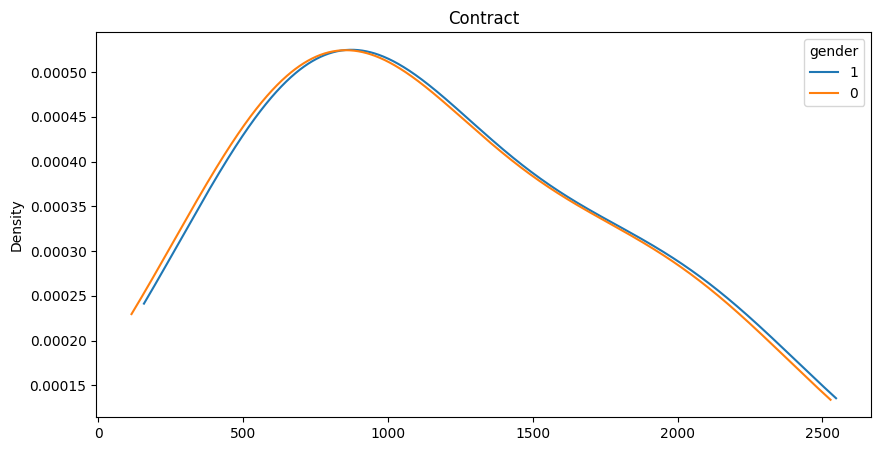

In [222]:
Contract_count("density", "gender")

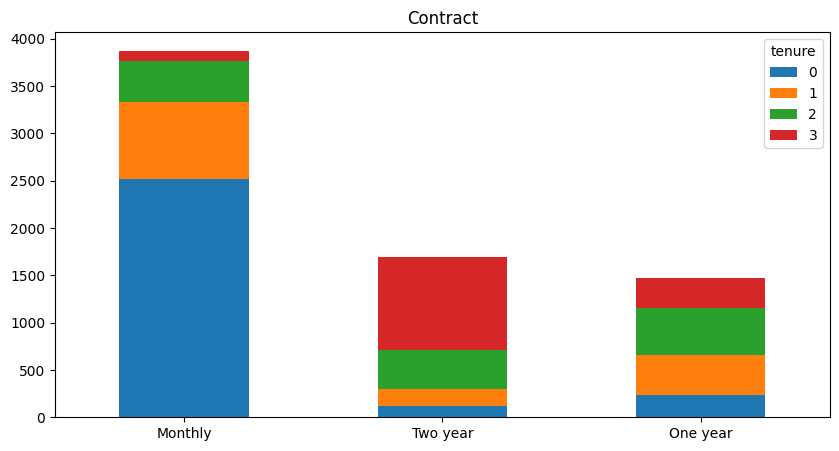

In [223]:
Contract_count("bar", "tenure")

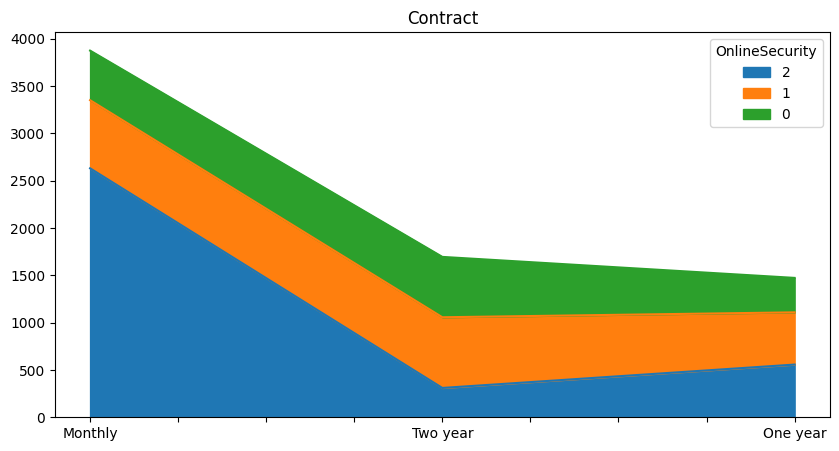

In [224]:
Contract_count("area", "OnlineSecurity")

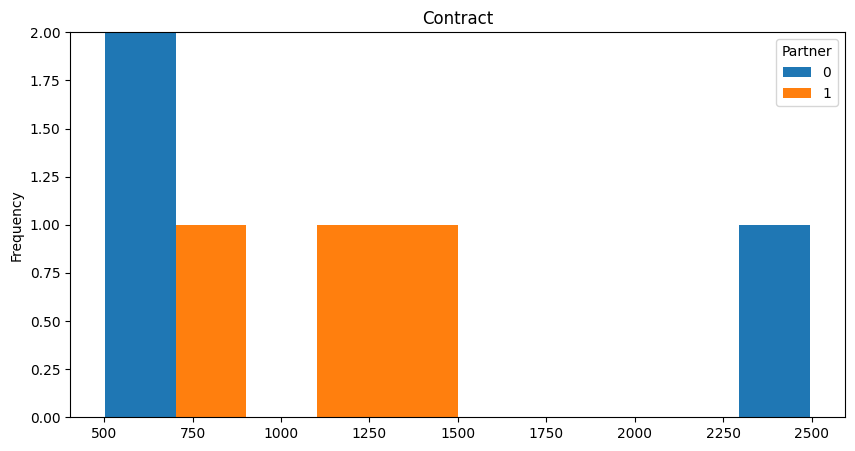

In [225]:
Contract_count("hist", "Partner")

In [226]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="Contract", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to Contract")
    plt.show()

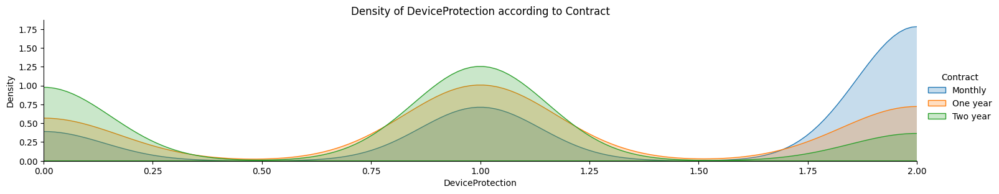

In [227]:
facet("DeviceProtection","DeviceProtection")

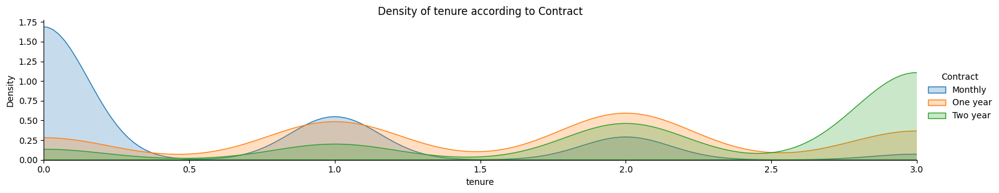

In [228]:
facet("tenure","tenure")

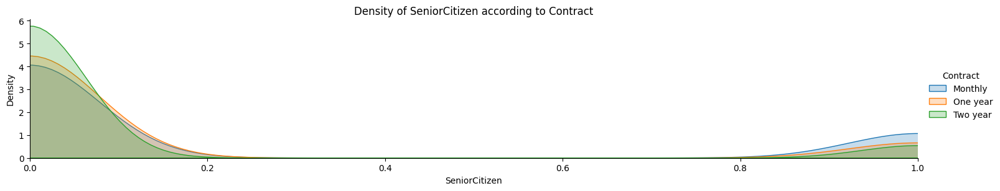

In [229]:
facet("SeniorCitizen","SeniorCitizen")

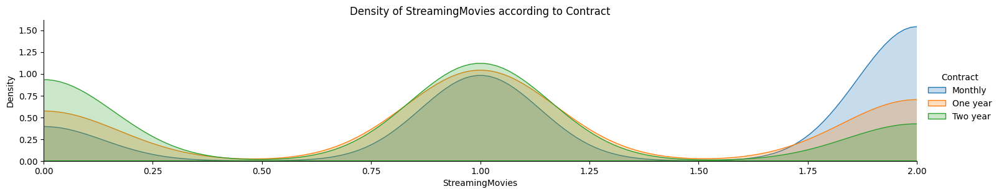

In [230]:
facet("StreamingMovies","StreamingMovies")

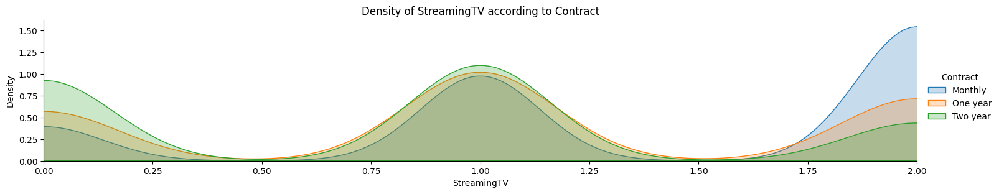

In [231]:
facet("StreamingTV","StreamingTV")

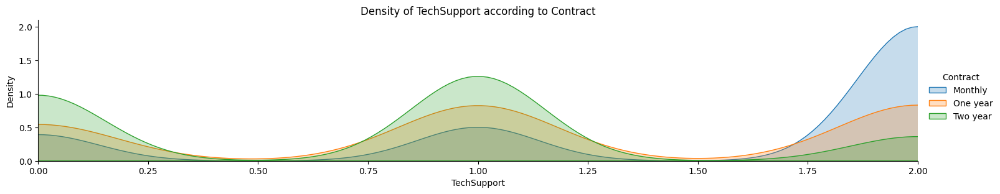

In [232]:
facet("TechSupport","TechSupport")

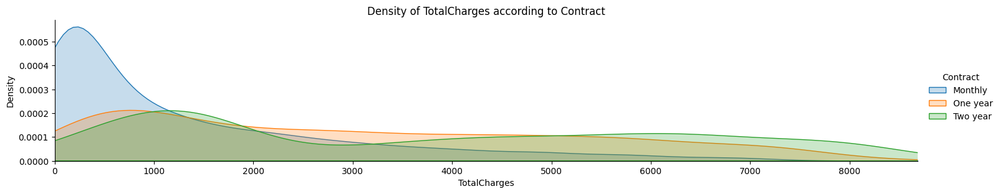

In [233]:
facet("TotalCharges","TotalCharges")

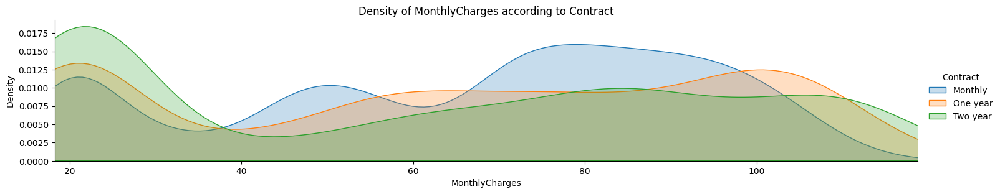

In [234]:
facet("MonthlyCharges","MonthlyCharges")

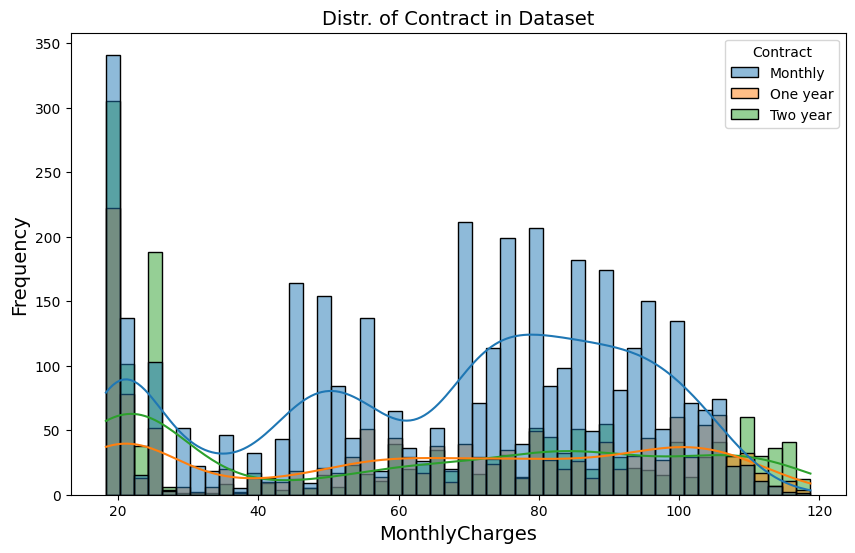

In [235]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='Contract')  

## title and axis
plt.title('Distr. of Contract in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

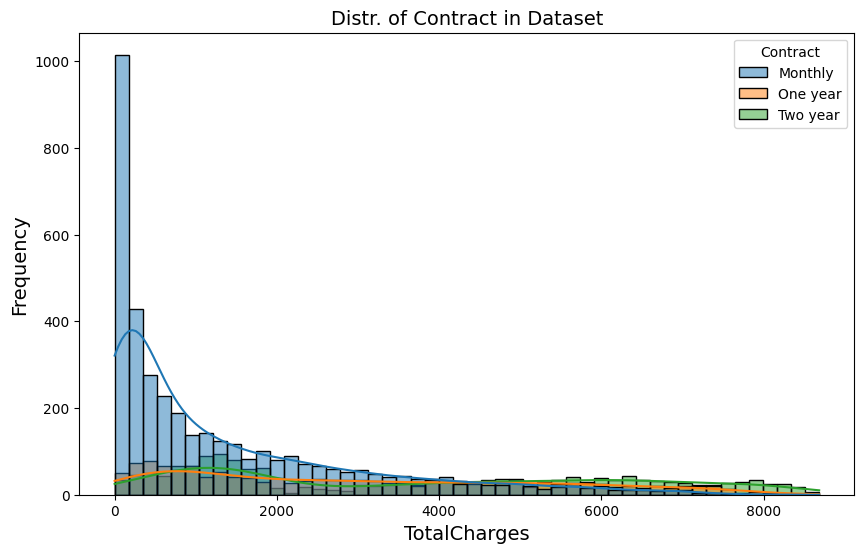

In [236]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='Contract')  

## title and axis
plt.title('Distr. of Contract in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

In [237]:
data["Contract"].value_counts()

Contract
Monthly     3875
Two year    1695
One year    1473
Name: count, dtype: int64

In [238]:
data["Contract"] = data["Contract"].map({"One year":0, "Two year":1, "Monthly":2})
data["Contract"].value_counts()

Contract
2    3875
1    1695
0    1473
Name: count, dtype: int64

# PaymentMethod

In [239]:
data["PaymentMethod"].value_counts()

PaymentMethod
Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: count, dtype: int64

In [240]:
print(2365/(2365+1612+1544+1522))
print(1612/(2365+1612+1544+1522))
print(1544/(2365+1612+1544+1522))
print(1522/(2365+1612+1544+1522))

0.3357944057929859
0.22887973874769274
0.21922476217520942
0.2161010932841119


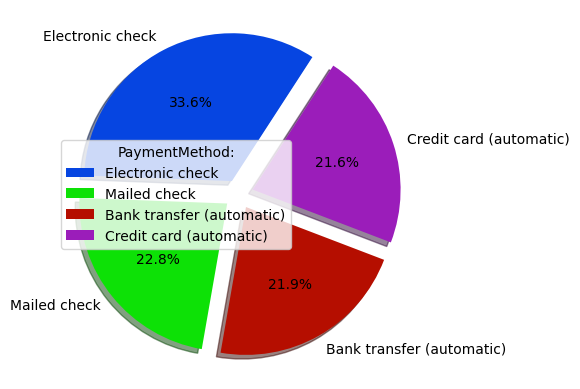

In [241]:
y = np.array([0.335, 0.228, 0.219, 0.216]) #100
mylabels = ["Electronic check", "Mailed check", "Bank transfer (automatic)", "Credit card (automatic)"]
myexplode = [0.1, 0.1, 0.1, 0.1]
mycolors = ["#0645e1", "#0de106", "#b50e00", "#9b1dba"]

plt.pie(y, labels = mylabels, explode = myexplode ,colors = mycolors, startangle = 57 , autopct= '%1.1f%%' ,shadow = True)
plt.legend(title = "PaymentMethod:",loc=6)
plt.show() 

In [242]:
def PaymentMethod_count(kind,feature):
    Paymen1 = data[data['PaymentMethod']=="Electronic check"][feature].value_counts()
    Paymen2 = data[data['PaymentMethod']=="Mailed check"][feature].value_counts()
    Paymen3 = data[data['PaymentMethod']=="Bank transfer (automatic)"][feature].value_counts()
    Paymen4 = data[data['PaymentMethod']=="Credit card (automatic)"][feature].value_counts()
    df = pd.DataFrame([Paymen1, Paymen2, Paymen3, Paymen4])
    df.index = ['Electronic check','Mailed check', 'Bank transfer', 'Credit card']
    df.plot(kind=kind,stacked=True, figsize=(10,5))
    plt.title("Contract")
    plt.xticks(rotation=0)

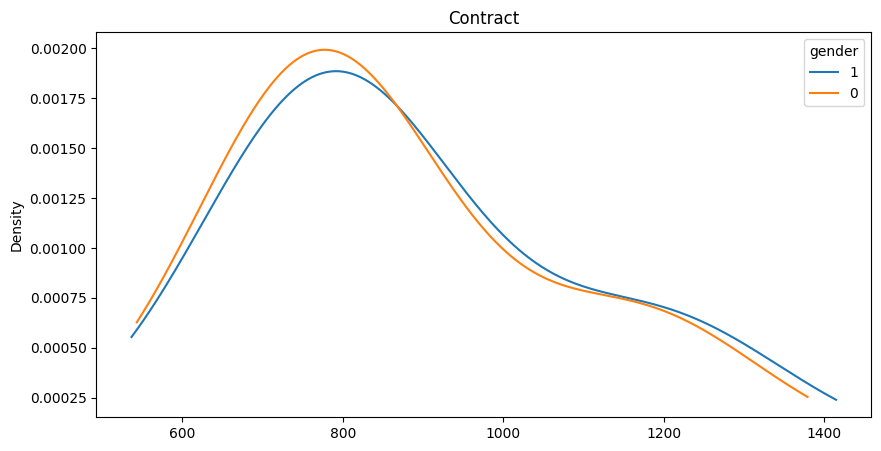

In [243]:
PaymentMethod_count("density", "gender")

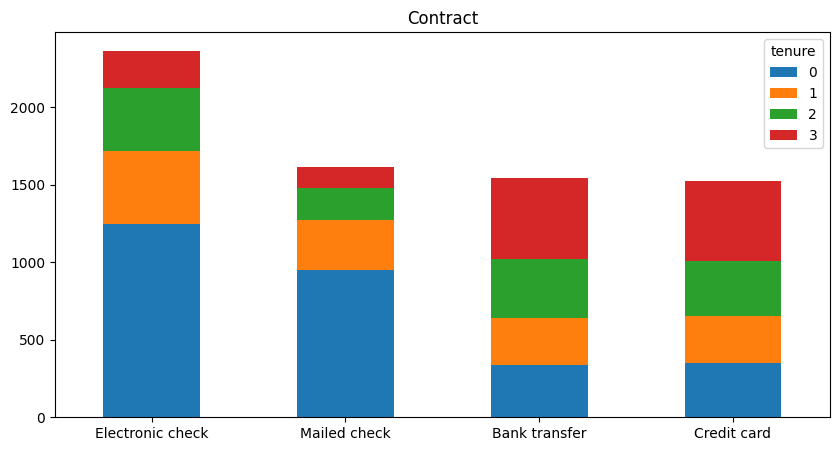

In [244]:
PaymentMethod_count("bar", "tenure")

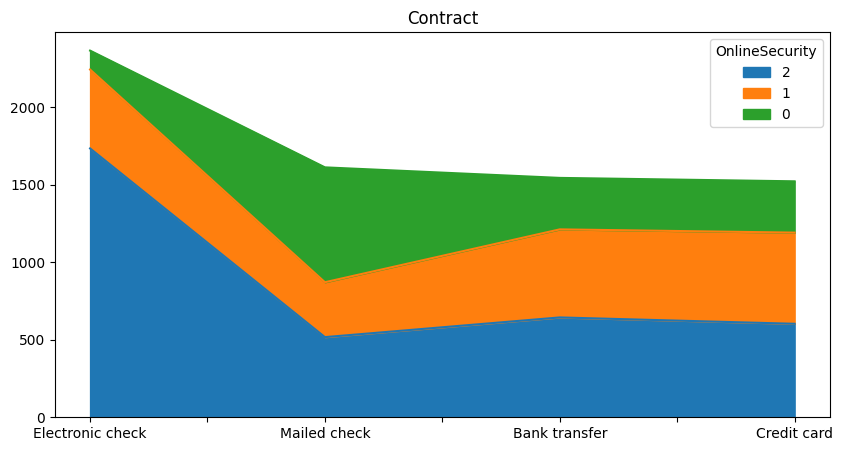

In [245]:
PaymentMethod_count("area", "OnlineSecurity")

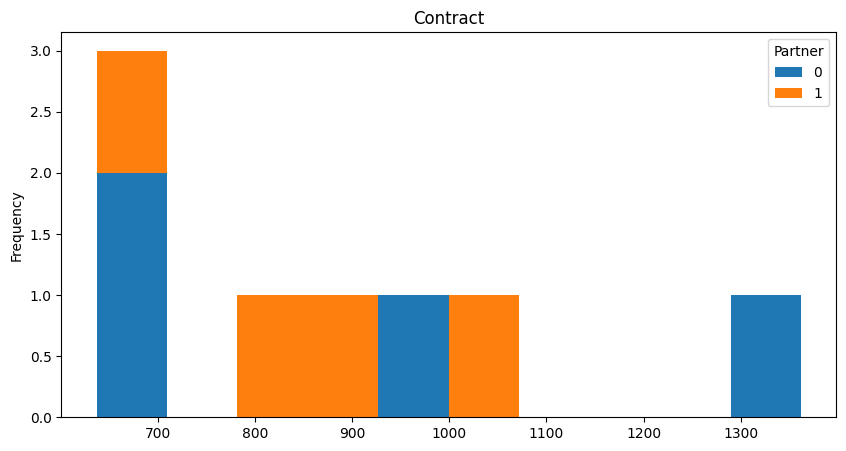

In [246]:
PaymentMethod_count("hist", "Partner")

In [247]:
def facet(title,feature):
    facet = sns.FacetGrid(data, hue="PaymentMethod", aspect=5)
    facet.map(sns.kdeplot, feature, shade = True)
    facet.set(xlim=(  data[feature].min(),  data[feature].max()  ))
    facet.add_legend()
    plt.title(f"Density of {title} according to PaymentMethod")
    plt.show()

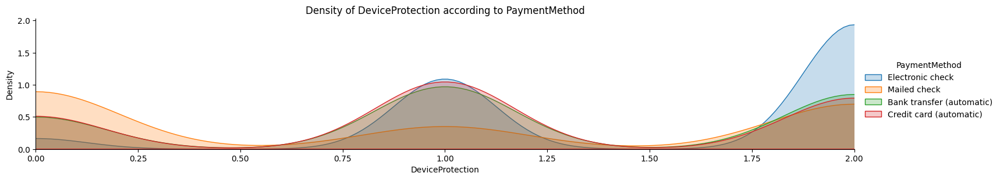

In [248]:
facet("DeviceProtection","DeviceProtection")

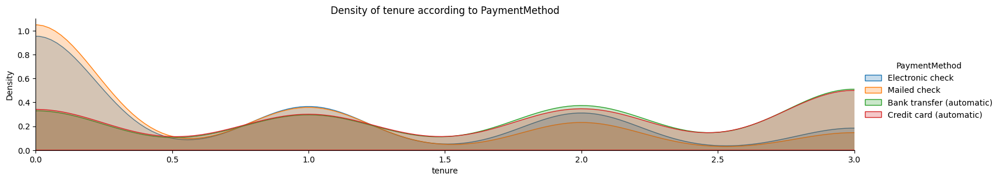

In [249]:
facet("tenure","tenure")

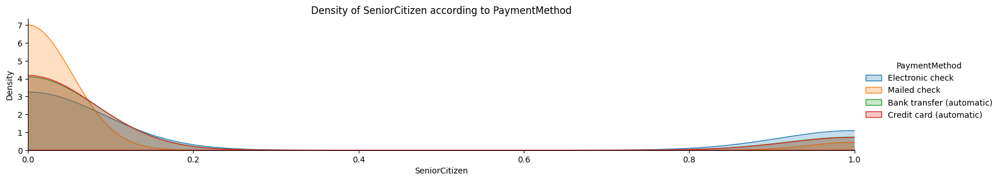

In [250]:
facet("SeniorCitizen","SeniorCitizen")

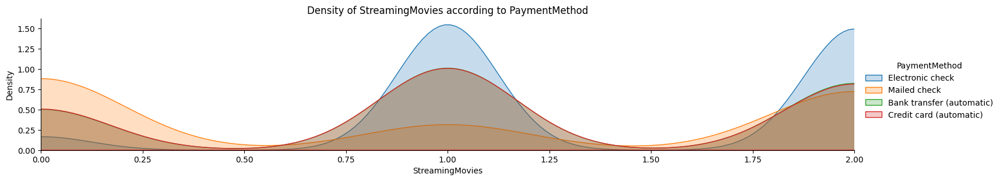

In [251]:
facet("StreamingMovies","StreamingMovies")

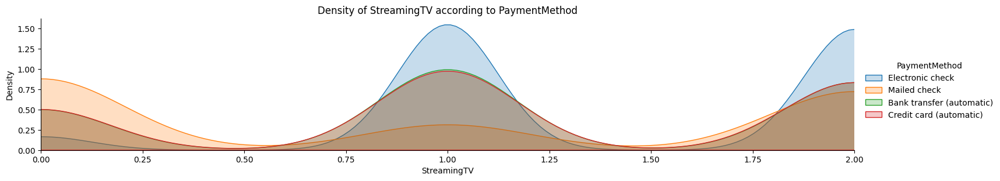

In [252]:
facet("StreamingTV","StreamingTV")

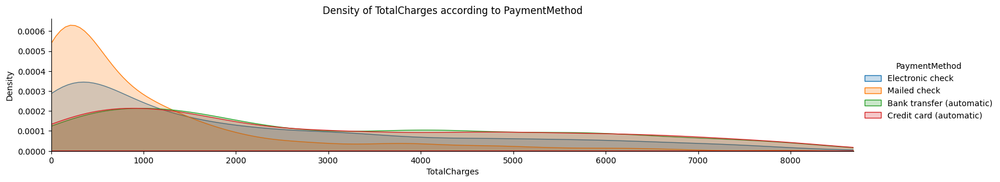

In [253]:
facet("TotalCharges","TotalCharges")

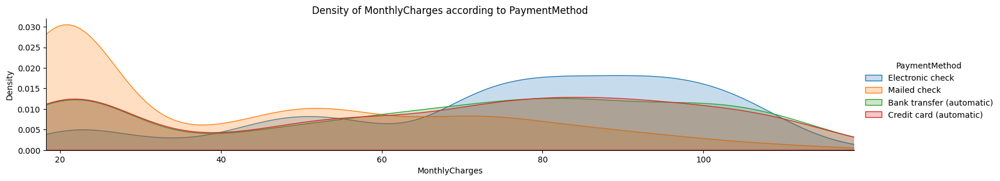

In [254]:
facet("MonthlyCharges","MonthlyCharges")

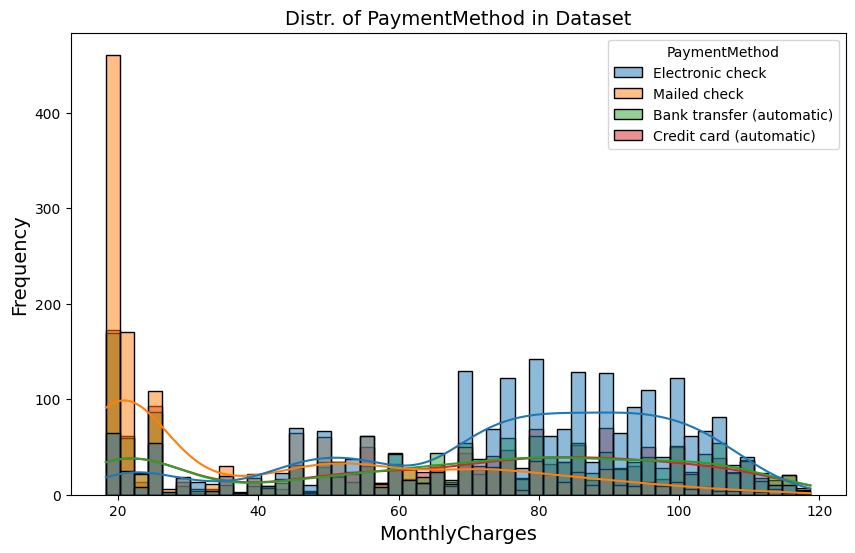

In [255]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='MonthlyCharges', data=data, bins=50, kde=True, hue='PaymentMethod')  

## title and axis
plt.title('Distr. of PaymentMethod in Dataset', fontsize=14)
plt.xlabel('MonthlyCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

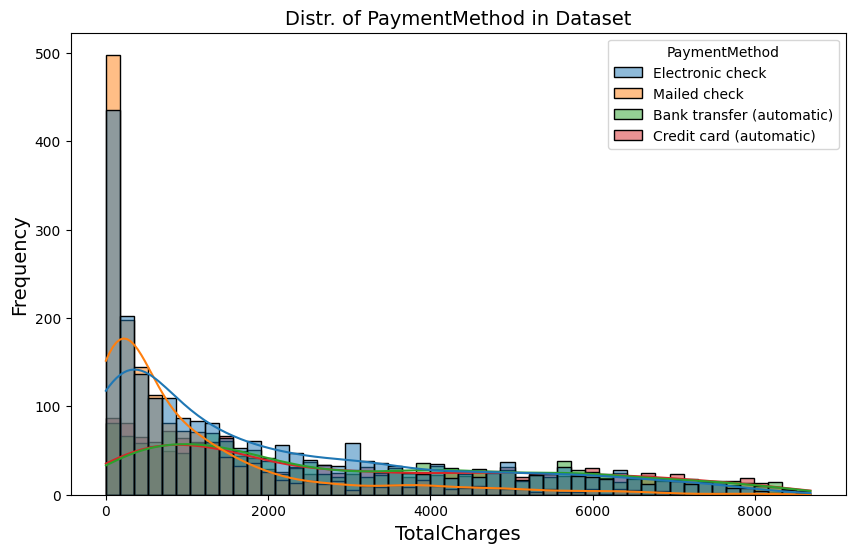

In [256]:
plt.figure(figsize=(10, 6))   

sns.histplot(x='TotalCharges', data=data, bins=50, kde=True, hue='PaymentMethod')  

## title and axis
plt.title('Distr. of PaymentMethod in Dataset', fontsize=14)
plt.xlabel('TotalCharges', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

In [257]:
data["PaymentMethod"].value_counts()

PaymentMethod
Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: count, dtype: int64

In [258]:
data["PaymentMethod"] = data["PaymentMethod"].map({"Electronic check":0, "Mailed check":1, "Bank transfer (automatic)":2, "Credit card (automatic)":3})
data["PaymentMethod"].value_counts()

PaymentMethod
0    2365
1    1612
2    1544
3    1522
Name: count, dtype: int64

# MonthlyCharges and TotalCharges

In [259]:
data_list = []  # Create an empty list to store data

for i, j, c in zip(data["MonthlyCharges"], data["TotalCharges"], data["customerID"]):
    num_of_months = int(j / i)
    num_of_years = int(num_of_months / 12)
    
    # Append the calculated data to the list
    data_list.append({"customerID": c,  
                      "MonthlyCharges": i,  
                      "TotalCharges": j,  
                      "Month/s": num_of_months,  
                      "Year/s": num_of_years})

# Create a DataFrame from the list
df = pd.DataFrame(data_list)

print(df)


      customerID  MonthlyCharges  TotalCharges  Month/s  Year/s
0     7590-VHVEG           29.85         29.85        1       0
1     5575-GNVDE           56.95       1889.50       33       2
2     3668-QPYBK           53.85        108.15        2       0
3     7795-CFOCW           42.30       1840.75       43       3
4     9237-HQITU           70.70        151.65        2       0
...          ...             ...           ...      ...     ...
7038  6840-RESVB           84.80       1990.50       23       1
7039  2234-XADUH          103.20       7362.90       71       5
7040  4801-JZAZL           29.60        346.45       11       0
7041  8361-LTMKD           74.40        306.60        4       0
7042  3186-AJIEK          105.65       6844.50       64       5

[7043 rows x 5 columns]


In [260]:
#df.to_csv('customers.csv', index=False)

In [261]:
list = [data]

In [262]:
print("Maximum of MonthlyCharges is ", data["MonthlyCharges"].max())
print("Minimum of MonthlyCharges is ", data["MonthlyCharges"].min())
print("Maximum of TotalCharges is ", data["TotalCharges"].max())
print("Minimum of TotalCharges is ", data["TotalCharges"].min())

Maximum of MonthlyCharges is  118.75
Minimum of MonthlyCharges is  18.25
Maximum of TotalCharges is  8684.8
Minimum of TotalCharges is  0.0


In [263]:
# MonthlyCharges  18.25 ---> 118.75

for pointer in list:
    pointer.loc[ pointer['MonthlyCharges'] <= 30, 'MonthlyCharges'] = 0
    pointer.loc[(pointer['MonthlyCharges'] > 30) & (pointer['MonthlyCharges'] <= 60), 'MonthlyCharges'] = 1
    pointer.loc[(pointer['MonthlyCharges'] > 60) & (pointer['MonthlyCharges'] <= 90), 'MonthlyCharges'] = 2
    pointer.loc[ pointer['MonthlyCharges'] > 90, 'MonthlyCharges'] = 3

In [264]:
# TotalCharges  max 999.9

for pointer in list:
    pointer.loc[ pointer['TotalCharges'] <= 100, 'TotalCharges'] = 0
    pointer.loc[(pointer['TotalCharges'] > 100) & (pointer['TotalCharges'] <= 400), 'TotalCharges'] = 1
    pointer.loc[(pointer['TotalCharges'] > 400) & (pointer['TotalCharges'] <= 800), 'TotalCharges'] = 2
    pointer.loc[ pointer['TotalCharges'] > 800, 'TotalCharges'] = 3

In [265]:
data

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,0,0,1,0,0,0,0,1,2,...,2,2,2,2,2,1,0,0.0,0.0,0
1,5575-GNVDE,1,0,0,0,1,1,1,1,1,...,1,2,2,2,0,0,1,1.0,3.0,0
2,3668-QPYBK,1,0,0,0,0,1,1,1,1,...,2,2,2,2,2,1,1,1.0,1.0,1
3,7795-CFOCW,1,0,0,0,2,0,0,1,1,...,1,1,2,2,0,0,2,1.0,3.0,0
4,9237-HQITU,0,0,0,0,0,1,1,2,2,...,2,2,2,2,2,1,0,2.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,1,0,1,1,1,1,2,1,1,...,1,1,1,1,0,1,1,2.0,3.0,0
7039,2234-XADUH,0,0,1,1,3,1,2,2,2,...,1,2,1,1,0,1,3,3.0,3.0,0
7040,4801-JZAZL,0,0,1,1,0,0,0,1,1,...,2,2,2,2,2,1,0,0.0,1.0,0
7041,8361-LTMKD,1,1,1,0,0,1,2,2,2,...,2,2,2,2,2,1,1,2.0,1.0,1


# Models

In [266]:
data = data.drop(["customerID"], axis=1)

In [267]:
train = data.drop('Churn', axis=1)

target = data['Churn']

train.shape, target.shape

((7043, 19), (7043,))

# KFold

In [268]:
k_fold = KFold(n_splits= 5, shuffle=True, random_state=42)

# KNN

In [269]:
clf = KNeighborsClassifier(n_neighbors = 50)
scoring = 'accuracy'

score = cross_val_score(clf, train, target, cv=k_fold, n_jobs=-1, scoring=scoring)

print(score)

round(np.mean(score)*100, 2)

[0.80411639 0.81547197 0.79488999 0.78267045 0.79474432]


79.84

# Decision Tree

In [270]:
clf2 = DecisionTreeClassifier(criterion = "entropy" ,max_depth=7 ,random_state= 42, max_features=7)
scoring = 'accuracy'

score = cross_val_score(clf2, train, target, cv=k_fold, n_jobs=1, scoring=scoring)

print(score)

round(np.mean(score)*100, 2)

[0.79985806 0.80056778 0.7828247  0.77840909 0.79261364]


79.09

# Random Forest

In [271]:
clf3 = RandomForestClassifier(n_estimators=150 , criterion = "gini" , max_depth= 9 ,random_state= 0)
scoring = 'accuracy'

score = cross_val_score(clf3, train, target, cv=k_fold, n_jobs=1, scoring=scoring)

print(score)

round(np.mean(score)*100, 2)


[0.80766501 0.81547197 0.79276082 0.78480114 0.8046875 ]


80.11

# Naive Bayes

In [272]:
clf4 = GaussianNB()
scoring = 'accuracy'
score = cross_val_score(clf4, train, target, cv=k_fold, n_jobs=1, scoring=scoring)
print(score)
round(np.mean(score)*100, 2)

[0.72320795 0.72533712 0.71823989 0.72301136 0.73011364]


72.4

# GradientBoostingClassifier

In [273]:
gbc = GradientBoostingClassifier(n_estimators=200, learning_rate=0.03, random_state=100, max_features=4, max_depth=4)
scoring = 'accuracy'
score = cross_val_score(gbc, train, target, cv=k_fold, n_jobs=1, scoring=scoring)
print(score)
round(np.mean(score)*100,2)


[0.81760114 0.81405252 0.79985806 0.78693182 0.80326705]


80.43

# SVM

In [274]:
clf5 = SVC( kernel='poly', random_state= 0 )
scoring = 'accuracy'
score = cross_val_score(clf5, train, target, cv=k_fold, n_jobs=1, scoring=scoring)
print(score)
round(np.mean(score)*100,2)


[0.81263307 0.81902058 0.79701916 0.78551136 0.80255682]


80.33

# AdaBoostClassifier

In [275]:
clf6 = AdaBoostClassifier(n_estimators=100, learning_rate=0.2)
scoring = 'accuracy'
score = cross_val_score(clf6, train, target, cv=k_fold, n_jobs=-1, scoring=scoring)
print(score)
round(np.mean(score)*100,2)


[0.81618169 0.81760114 0.79559972 0.78693182 0.80113636]


80.35

# XGBClassifier

In [276]:
clf7 = XGBClassifier(max_depth = 3 , learning_rate = 0.03 ,n_estimators= 200, random_state=42 , max_features= 1 )
scoring = 'accuracy'
score = cross_val_score(clf7, train, target, cv=k_fold, n_jobs=1, scoring=scoring)
print(score)
round(np.mean(score)*100, 2)


[0.81831086 0.81263307 0.80482612 0.79190341 0.8046875 ]


80.65

# Voting

In [277]:
clf8 = RandomForestClassifier(n_estimators=150 , criterion = "gini" , max_depth= 9 ,random_state= 0)
clf9 = GradientBoostingClassifier(n_estimators=200, learning_rate=0.03, random_state=100, max_features=4, max_depth=4)
clf10 = SVC( kernel='poly', random_state= 0 )
clf11 = AdaBoostClassifier(n_estimators=100, learning_rate=0.2)
clf12 = XGBClassifier(max_depth = 3 , learning_rate = 0.03 ,n_estimators= 200, random_state=42 , max_features= 1 )

In [278]:
v_clf55 = VotingClassifier(estimators=[("RandomForestClassifier" , clf8) , ('GradientBoostingClassifier' , clf9) ,
                                     ("SVC" , clf10) ,("AdaBoostClassifier" , clf11), ("XGBClassifier", clf12)] , voting = "hard")

scoring = 'accuracy'
score = cross_val_score(v_clf55, train, target, cv=k_fold, n_jobs=1, scoring=scoring)
print(score)
round(np.mean(score)*100, 2)


[0.81902058 0.81192335 0.80056778 0.78551136 0.80823864]


80.51

# train test split

In [279]:
x = data.drop('Churn',axis=1)
y = data['Churn']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.6, random_state=42)

# LogisticRegression

In [280]:
LogR = LogisticRegression(random_state = 42)

In [281]:
LogR.fit(x_train, y_train)

LogisticRegression(random_state=42)

In [282]:
y_pred = LogR.predict(x_test)

In [283]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2838  251]
 [ 545  592]]
81.16422148603881


In [284]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')
cm = confusion_matrix(y_test, y_pred)
print(cm)

tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]

print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')

accuracy_score: 81.16422148603881
[[2838  251]
 [ 545  592]]
True Positive: 592
True Negative: 2838
False Positive: 251
False Negative: 545
precision_score1: 0.7022538552787663
precision_score2: 0.7022538552787663
recall_score: 0.5206684256816183
recall_score: 0.5206684256816183


# KNN

In [285]:
knn = KNeighborsClassifier(n_neighbors = 100 )

In [286]:
knn.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=100)

In [287]:
y_pred = knn.predict(x_test)

In [288]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2811  278]
 [ 558  579]]
80.21769995267393


In [289]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')

cm = confusion_matrix(y_test, y_pred)
print(cm)

tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]


print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')

accuracy_score: 80.21769995267393
[[2811  278]
 [ 558  579]]
True Positive: 579
True Negative: 2811
False Positive: 278
False Negative: 558
precision_score1: 0.67561260210035
precision_score2: 0.67561260210035
recall_score: 0.5092348284960422
recall_score: 0.5092348284960422


# SVM

In [290]:
svm1 = SVC(kernel = "rbf", random_state = 0)
svm1.fit(x_train, y_train)

SVC(random_state=0)

In [291]:
y_pred = svm1.predict(x_test)

In [292]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2874  215]
 [ 605  532]]
80.59630856601989


In [293]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')

cm = confusion_matrix(y_test, y_pred)
print(cm)


tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]


print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')

accuracy_score: 80.59630856601989
[[2874  215]
 [ 605  532]]
True Positive: 532
True Negative: 2874
False Positive: 215
False Negative: 605
precision_score1: 0.7121820615796519
precision_score2: 0.7121820615796519
recall_score: 0.4678979771328056
recall_score: 0.4678979771328056


# DecisionTreeClassifier

In [294]:
Dtc = DecisionTreeClassifier(criterion = 'entropy' ,max_depth=6 ,random_state= 42  , max_features=9)
Dtc.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features=9,
                       random_state=42)

In [295]:
y_pred = Dtc.predict(x_test)

In [296]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2781  308]
 [ 591  546]]
78.72692853762423


In [297]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')

cm = confusion_matrix(y_test, y_pred)
print(cm)


tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]


print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')


accuracy_score: 78.72692853762423
[[2781  308]
 [ 591  546]]
True Positive: 546
True Negative: 2781
False Positive: 308
False Negative: 591
precision_score1: 0.639344262295082
precision_score2: 0.639344262295082
recall_score: 0.48021108179419525
recall_score: 0.48021108179419525


# Random Forest

In [298]:
Rf = RandomForestClassifier(n_estimators=300, random_state=42 ,max_depth=7  , max_features=8)
Rf.fit(x_train, y_train)

RandomForestClassifier(max_depth=7, max_features=8, n_estimators=300,
                       random_state=42)

In [299]:
y_pred = Rf.predict(x_test)

In [300]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2840  249]
 [ 559  578]]
80.88026502602933


In [301]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')

cm = confusion_matrix(y_test, y_pred)
print(cm)

tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]


print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')

accuracy_score: 80.88026502602933
[[2840  249]
 [ 559  578]]
True Positive: 578
True Negative: 2840
False Positive: 249
False Negative: 559
precision_score1: 0.6989117291414753
precision_score2: 0.6989117291414753
recall_score: 0.5083553210202286
recall_score: 0.5083553210202286


# XGBOOST

In [302]:
xgb = XGBClassifier(max_depth = 4 , learning_rate = 0.06 ,  n_estimators= 100, random_state=42 , max_features= 6 )
xgb.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.06, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_features=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [303]:
y_pred = xgb.predict(x_test)

In [304]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2817  272]
 [ 535  602]]
80.90392806436346


In [305]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')

cm = confusion_matrix(y_test, y_pred)
print(cm)


tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]


print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')

accuracy_score: 80.90392806436346
[[2817  272]
 [ 535  602]]
True Positive: 602
True Negative: 2817
False Positive: 272
False Negative: 535
precision_score1: 0.6887871853546911
precision_score2: 0.6887871853546911
recall_score: 0.5294635004397538
recall_score: 0.5294635004397538


# GradientBoostingClassifier

In [306]:
gbc = GradientBoostingClassifier(n_estimators= 150, learning_rate=0.06, random_state=42 ,max_depth=3  , max_features=6 )
gbc.fit(x_train, y_train)

GradientBoostingClassifier(learning_rate=0.06, max_features=6, n_estimators=150,
                           random_state=42)

In [307]:
y_pred = gbc.predict(x_test)

In [308]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2825  264]
 [ 527  610]]
81.28253667770942


In [309]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')

cm = confusion_matrix(y_test, y_pred)
print(cm)


tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]


print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')

accuracy_score: 81.28253667770942
[[2825  264]
 [ 527  610]]
True Positive: 610
True Negative: 2825
False Positive: 264
False Negative: 527
precision_score1: 0.6979405034324943
precision_score2: 0.6979405034324943
recall_score: 0.5364995602462621
recall_score: 0.5364995602462621


# AdaBoostClassifier

In [310]:
ada = AdaBoostClassifier(n_estimators=500, learning_rate=0.07)
ada.fit(x_train, y_train)

AdaBoostClassifier(learning_rate=0.07, n_estimators=500)

In [311]:
y_pred = ada.predict(x_test)

In [312]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2810  279]
 [ 526  611]]
80.9512541410317


In [313]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')

cm = confusion_matrix(y_test, y_pred)
print(cm)


tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]


print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')

accuracy_score: 80.9512541410317
[[2810  279]
 [ 526  611]]
True Positive: 611
True Negative: 2810
False Positive: 279
False Negative: 526
precision_score1: 0.6865168539325842
precision_score2: 0.6865168539325842
recall_score: 0.5373790677220757
recall_score: 0.5373790677220757


# Voting

In [314]:
clf1 = LogisticRegression(random_state = 42) # 81.16
clf2 = XGBClassifier(max_depth = 4 , learning_rate = 0.06 ,  n_estimators= 100, random_state=42 , max_features= 6 ) # 80.90
clf3 = GradientBoostingClassifier(n_estimators= 150, learning_rate=0.06, random_state=42 ,max_depth=3  , max_features=6 ) # 81.28
clf4 = AdaBoostClassifier(n_estimators=500, learning_rate=0.07) # 80.95

In [315]:
v_clf = VotingClassifier(estimators=[("LogisticRegression" , clf1) , ('XGBClassifier' , clf2) ,
                                     ("GradientBoostingClassifier" , clf3) ,("AdaBoostClassifier" , clf4)] , voting = "soft")

In [316]:
v_clf.fit(x_train, y_train)

VotingClassifier(estimators=[('LogisticRegression',
                              LogisticRegression(random_state=42)),
                             ('XGBClassifier',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_poli...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None, ...)),
                             ('GradientBoostingClassifier',
                              GradientBoostingClassifier(learning_rate=0.06,
                                                         max_features=6,
                                                         n_estimators=150,
                                                         random_state=42)),
                             ('AdaBoostClassifier',
                              AdaBoostClassifier(learning_rate=0.07,
                                                 n_estimators=500))],
                 voting='soft')

In [317]:
y_pred = v_clf.predict(x_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred)*100)

[[2830  259]
 [ 535  602]]
81.21154756270705


In [318]:
print(f'accuracy_score: {accuracy_score(y_test, y_pred)*100}')

cm = confusion_matrix(y_test, y_pred)
print(cm)

tp, tn, fp, fn = cm[1, 1], cm[0, 0], cm[0, 1], cm[1,0]

print(f'True Positive: {tp}')
print(f'True Negative: {tn}')
print(f'False Positive: {fp}')
print(f'False Negative: {fn}')

print(f'precision_score1: {precision_score(y_test, y_pred)}')

prec = tp/(tp+fp)

print(f'precision_score2: {prec}')

print(f'recall_score: {recall_score(y_test, y_pred)}')

rec = tp/(tp+fn)

print(f'recall_score: {rec}')

accuracy_score: 81.21154756270705
[[2830  259]
 [ 535  602]]
True Positive: 602
True Negative: 2830
False Positive: 259
False Negative: 535
precision_score1: 0.6991869918699187
precision_score2: 0.6991869918699187
recall_score: 0.5294635004397538
recall_score: 0.5294635004397538


# Testing

In [319]:
clf = VotingClassifier(estimators=[("LogisticRegression" , clf1) , ('XGBClassifier' , clf2) ,
                             ("GradientBoostingClassifier" , clf3) ,("AdaBoostClassifier" , clf4)] , voting = "soft")
clf.fit(train, target)

test_data = data.drop("Churn", axis=1).copy()
prediction = clf.predict(test_data)

In [320]:
submission = pd.DataFrame({
        "customerID": df["customerID"],
        "Churn": prediction
    })

submission.to_csv('Churn.csv', index=False)

In [321]:
subm = pd.read_csv('Churn.csv')
subm

,customerID,Churn
0,7590-VHVEG,1
1,5575-GNVDE,0
2,3668-QPYBK,0
3,7795-CFOCW,0
4,9237-HQITU,1
...,...,...
7038,6840-RESVB,0
7039,2234-XADUH,0
7040,4801-JZAZL,0
7041,8361-LTMKD,1


# Calculate the correct and wrong predictions

In [322]:
final_testing = pd.read_csv("/kaggle/input/telco-customer-churn/WA_Fn-UseC_-Telco-Customer-Churn.csv")

In [323]:
count = 0
for final_ID, subm_ID, target_churn, subm_churn in zip(final_testing["customerID"], subm["customerID"], target, subm["Churn"]):
    if final_ID == subm_ID and target_churn==subm_churn:
        count += 1
print(f"Total predictions is {subm.index.stop}\n The number of Correct predictions is {count}\n The number of wrong predictions is {(subm.index.stop)-count}")


Total predictions is 7043
 The number of Correct predictions is 5723
 The number of wrong predictions is 1320


# creat a CSV file for wrong predictions

In [324]:
wrong_pred = []

for final_ID, subm_ID, target_churn, subm_churn in zip(final_testing["customerID"], subm["customerID"], target, subm["Churn"]):
    if final_ID == subm_ID and target_churn!=subm_churn:
        wrong_pred.append({"customerID":final_ID,
                           "Actual":target_churn,
                           "Wrong prediction":subm_churn})
        
wrong_sumb = pd.DataFrame(wrong_pred)
print(wrong_sumb)

      customerID  Actual  Wrong prediction
0     7590-VHVEG       0                 1
1     3668-QPYBK       1                 0
2     0280-XJGEX       1                 0
3     4190-MFLUW       1                 0
4     1066-JKSGK       1                 0
...          ...     ...               ...
1315  2823-LKABH       0                 1
1316  8775-CEBBJ       1                 0
1317  2235-DWLJU       0                 1
1318  0639-TSIQW       1                 0
1319  8456-QDAVC       0                 1

[1320 rows x 3 columns]


In [325]:
wrong_sumb.to_csv("wrong prediction.csv", index=False)
wrong_sumb = pd.read_csv("wrong prediction.csv")
wrong_sumb

,customerID,Actual,Wrong prediction
0,7590-VHVEG,0,1
1,3668-QPYBK,1,0
2,0280-XJGEX,1,0
3,4190-MFLUW,1,0
4,1066-JKSGK,1,0
...,...,...,...
1315,2823-LKABH,0,1
1316,8775-CEBBJ,1,0
1317,2235-DWLJU,0,1
1318,0639-TSIQW,1,0


# Creat a CSV file for correct perdictions

In [326]:
correct_pred = []

for final_ID, subm_ID, target_churn, subm_churn in zip(final_testing["customerID"], subm["customerID"], target, subm["Churn"]):
    if final_ID == subm_ID and target_churn==subm_churn:
        correct_pred.append({"customerID":final_ID,
                           "Actual":target_churn,
                           "correct prediction":subm_churn})
        
correct_sumb = pd.DataFrame(correct_pred)
print(correct_sumb)

      customerID  Actual  correct prediction
0     5575-GNVDE       0                   0
1     7795-CFOCW       0                   0
2     9237-HQITU       1                   1
3     9305-CDSKC       1                   1
4     1452-KIOVK       0                   0
...          ...     ...                 ...
5718  6840-RESVB       0                   0
5719  2234-XADUH       0                   0
5720  4801-JZAZL       0                   0
5721  8361-LTMKD       1                   1
5722  3186-AJIEK       0                   0

[5723 rows x 3 columns]


In [327]:
correct_sumb.to_csv("correct prediction.csv", index=False)
correct_sumb = pd.read_csv("correct prediction.csv")
correct_sumb

,customerID,Actual,correct prediction
0,5575-GNVDE,0,0
1,7795-CFOCW,0,0
2,9237-HQITU,1,1
3,9305-CDSKC,1,1
4,1452-KIOVK,0,0
...,...,...,...
5718,6840-RESVB,0,0
5719,2234-XADUH,0,0
5720,4801-JZAZL,0,0
5721,8361-LTMKD,1,1
